## Import de packages

In [1]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import seaborn as sns
import random
import shap
import matplotlib.pyplot as plt
import xgboost as xgb
import geopandas as gpd
import fiona

from functools import reduce
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import cross_val_score, KFold, GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from scipy.stats import skew
from IPython.display import display

pd.options.display.max_columns = 200

## Funções que iremos usar ao longo do notebook

In [2]:
def frequencia_absoluta_relativa(variavel):
    frequencia_absoluta = variavel.value_counts()
    frequencia_relativa = round(variavel.value_counts(normalize = True)*100, 2) 
    df = pd.DataFrame({'Frequência Absoluta':frequencia_absoluta, 'Frequência Relativa (%)':frequencia_relativa})
    print('Frequências Absoluta e Relativa de [',variavel.name,']')
    return df
       
############################################################################

def padronizaMunicipios(municipio):
    municipio = municipio.upper().strip()
    municipio = municipio.replace('Á', 'A')
    municipio = municipio.replace('Ã', 'A')
    municipio = municipio.replace('Â', 'A')
    municipio = municipio.replace('É', 'E')
    municipio = municipio.replace('Ê', 'E')
    municipio = municipio.replace('Í', 'I')
    municipio = municipio.replace('Ó', 'O')
    municipio = municipio.replace('Õ', 'O')
    municipio = municipio.replace('Ô', 'O')
    municipio = municipio.replace('Ú', 'U')
    municipio = municipio.replace('Ç', 'C')
    return municipio

############################################################################

def padronizaColunas(coluna):
    coluna = coluna.upper().strip()
    coluna = coluna.replace('Á', 'A')
    coluna = coluna.replace('Ã', 'A')
    coluna = coluna.replace('Â', 'A')
    coluna = coluna.replace('É', 'E')
    coluna = coluna.replace('Ê', 'E')
    coluna = coluna.replace('Í', 'I')
    coluna = coluna.replace('Ó', 'O')
    coluna = coluna.replace('Õ', 'O')
    coluna = coluna.replace('Ô', 'O')
    coluna = coluna.replace('Ú', 'U')
    coluna = coluna.replace('Ç', 'C')
    coluna = coluna.replace(' (EM %)', '')
    coluna = coluna.replace(' (EM REAIS DE 2017)', '')
    coluna = coluna.replace(' - ', '_')
    coluna = coluna.replace(' ', '_')
    return coluna

############################################################################

def preencheZeros(coluna):
    if coluna == '-':
        return '0'
    else:
        return coluna
    
############################################################################

def removeEspacos(coluna):
    return str(coluna).strip()
    
############################################################################

def getCodigo(coluna):
    return coluna[0:6]

############################################################################

def mudaValor(coluna):
    return str(coluna).replace(',','.')

############################################################################

def trataZeros(df, search_text, column_type=int):
    for col in df.columns:
        df[col] = df[col].apply(preencheZeros)
        if search_text in col:
            df[col] = df[col].apply(mudaValor)
            df[col] = df[col].astype(column_type)     
    return df

############################################################################

def trataNulos(df, search_text, column_type=int):
    for col in df.columns:
        if search_text in col:
            df[col] = df[col].fillna(0)
            df[col] = df[col].astype(column_type)     
    return df

############################################################################

def trataValores(df, search_text, column_type=int):
    for col in df.columns:
        if search_text in col:
            df[col] = df[col].apply(mudaValor)
            df[col] = df[col].astype(column_type)     
    return df

############################################################################

def joinDataframes(left_df, 
                   right_df, 
                   left_key = 'NO_MUNICIPIO_RESIDENCIA', 
                   right_key = 'NO_MUNICIPIO_RESIDENCIA',
                   exception=False,
                   function=None):
    # Todas as colunas exceto a que é referente ao município
    colunas = right_df.loc[:, right_df.columns != right_key].columns

    for coluna in colunas:
        if not exception:
            left_df[coluna] = \
            left_df[left_key].map(right_df.set_index(right_key)[coluna])
        else:
            left_df[coluna] = \
            left_df[left_key].apply(function).map(right_df.set_index(right_key)[coluna])
        
    return left_df

############################################################################

def trataColunasCategoricas(df, colunas, numeric=False):
    for coluna in colunas:
        
        # Se for nulo, colocamos 0 (numérico) ou '0' (não numérico)
        order = 0
        if df[coluna].isnull().sum() > 0:
            if not numeric:
                    df[coluna].fillna('0', inplace=True)
            else:
                df[coluna].fillna(0, inplace=True)
        # Se não tivermos nulos nem elementos iguais a zero, começamos pelo 1
        else: 
            if ('0' not in list(df[coluna].unique())) and (0 not in list(df[coluna].unique())):
                order = 1
            
        itens = sorted(list(df[coluna].unique()))
        
        for item in itens:
            if not numeric:
                df[coluna].replace(item, str(order), inplace=True)
            else:
                df[coluna].replace(item, order, inplace=True)
            order += 1
        df[coluna] = df[coluna].astype(int)

    return df

############################################################################

def normalMinMax(coluna):
    return (coluna - coluna.min())/(coluna.max() - coluna.min())

############################################################################

def get_r2(model, kfold, x, y):
    r2 = cross_val_score(model, x, y=y, scoring="r2", cv=kfold)
    return r2

############################################################################

def get_results(models, algorithms, kfold, X, y):
    
    clf_results = []
    for clf in models:
        clf_results.append(get_r2(clf, kfold, X, y))

    clf_means = []
    clf_std = []
    for clf_result in clf_results:
        clf_means.append(clf_result.mean())
        clf_std.append(clf_result.std())

    df_result = pd.DataFrame({"Médias":clf_means, 
                              "STDs": clf_std, 
                              "Algoritmo": algorithms})
    
    return df_result.sort_values(by=['Médias'], ascending=False)

############################################################################

## Diretório que contém os datasets

In [3]:
# Rodando no Linux ou Mac, colocar '/'. Se for executado no Windows, colocar '\'

DIR_DATA = 'dados/'

## Parte 1 - Leitura dos datasets

### 1. Leitura do arquivo com as informações de 'População em idade escolar'

In [4]:
# Fonte: http://www.imp.seade.gov.br/frontend/#/tabelas
# População em Idade Escolar e Taxa de Analfabetismo (a taxa de analfabetismo não é apresentada nesta tabela)

df_idade_escolar = pd.read_csv(DIR_DATA + 'populacao_idade_escolar.csv', encoding='iso-8859-1', delimiter=';')

# Padronizando as colunas em maiúsculo e removendo os caracteres especiais

df_idade_escolar.columns = [padronizaColunas(col) for col in df_idade_escolar.columns]

# Deletando colunas desnecessárias

del df_idade_escolar['PERIODOS']
del df_idade_escolar['TAXA_DE_ANALFABETISMO_DA_POPULACAO_DE_15_ANOS_E_MAIS_PNAD']
del df_idade_escolar['COD._IBGE']

# Renomeando colunas

df_idade_escolar.rename(columns={'LOCALIDADES':'NO_MUNICIPIO_RESIDENCIA'}, inplace=True)

# Padronizando os municípios

df_idade_escolar['NO_MUNICIPIO_RESIDENCIA'] = \
df_idade_escolar['NO_MUNICIPIO_RESIDENCIA'].apply(padronizaMunicipios)

df_idade_escolar.head()

,NO_MUNICIPIO_RESIDENCIA,POPULACAO_DE_0_A_3_ANOS,POPULACAO_DE_4_A_6_ANOS,POPULACAO_DE_6_ANOS,POPULACAO_DE_7_A_10_ANOS,POPULACAO_DE_11_A_14_ANOS,POPULACAO_DE_15_A_17_ANOS,POPULACAO_DE_18_A_19_ANOS
0,ADAMANTINA,1461,1020,339,1415,1590,1324,965
1,ADOLFO,142,111,38,167,187,150,101
2,AGUAI,1881,1388,461,1848,1926,1613,1136
3,AGUAS DA PRATA,306,243,82,343,373,309,223
4,AGUAS DE LINDOIA,1013,617,200,817,927,792,545


In [5]:
df_idade_escolar.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 645 entries, 0 to 644
Data columns (total 8 columns):
NO_MUNICIPIO_RESIDENCIA      645 non-null object
POPULACAO_DE_0_A_3_ANOS      645 non-null int64
POPULACAO_DE_4_A_6_ANOS      645 non-null int64
POPULACAO_DE_6_ANOS          645 non-null int64
POPULACAO_DE_7_A_10_ANOS     645 non-null int64
POPULACAO_DE_11_A_14_ANOS    645 non-null int64
POPULACAO_DE_15_A_17_ANOS    645 non-null int64
POPULACAO_DE_18_A_19_ANOS    645 non-null int64
dtypes: int64(7), object(1)
memory usage: 40.4+ KB


### 2. Leitura do arquivo com as informações de 'Matrículas na Educação Básica'

In [6]:
# Fonte: http://www.imp.seade.gov.br/frontend/#/tabelas
# Matrículas na Educação Básica, por Níveis de Ensino e Redes de Atendimento

df_matricula_escolar = pd.read_csv(DIR_DATA + 'matricula_escolar.csv', encoding='iso-8859-1', delimiter=';')

# Padronizando as colunas em maiúsculo e removendo os caracteres especiais

df_matricula_escolar.columns = [padronizaColunas(col) for col in df_matricula_escolar.columns]

# Deletando colunas desnecessárias

del df_matricula_escolar['PERIODOS']
del df_matricula_escolar['MATRICULAS_NA_EDUCACAO_INFANTIL']
del df_matricula_escolar['MATRICULAS_NO_ENSINO_FUNDAMENTAL']
del df_matricula_escolar['MATRICULAS_NO_ENSINO_MEDIO']
del df_matricula_escolar['MATRICULAS_NA_EDUCACAO_ESPECIAL']
del df_matricula_escolar['COD._IBGE']

# Renomeando colunas

df_matricula_escolar.rename(columns={'LOCALIDADES':'NO_MUNICIPIO_RESIDENCIA'}, inplace=True)

# Padronizando os municípios

df_matricula_escolar['NO_MUNICIPIO_RESIDENCIA'] = \
df_matricula_escolar['NO_MUNICIPIO_RESIDENCIA'].apply(padronizaMunicipios)

# Preenche com zeros as colunas que não possuem informações e estão com '-'

df_matricula_escolar = trataZeros(df_matricula_escolar, 'MATRICULA')
   
df_matricula_escolar.head()

,NO_MUNICIPIO_RESIDENCIA,MATRICULAS_NA_EDUCACAO_INFANTIL_REDE_MUNICIPAL,MATRICULAS_NA_EDUCACAO_INFANTIL_REDE_PARTICULAR,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_PRIVADA,MATRICULAS_NO_ENSINO_MEDIO_REDE_ESTADUAL,MATRICULAS_NO_ENSINO_MEDIO_REDE_MUNICIPAL,MATRICULAS_NO_ENSINO_MEDIO_REDE_PARTICULAR,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_ESTADUAL,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_MUNICIPAL,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_PARTICULAR
0,ADAMANTINA,1001,358,1211,1480,849,1343,0,232,0,0,65
1,ADOLFO,41,78,0,487,0,176,0,0,0,0,0
2,AGUAI,1182,152,1572,2429,329,1068,0,39,0,34,130
3,AGUAS DA PRATA,192,0,323,383,0,138,0,0,0,0,0
4,AGUAS DE LINDOIA,770,104,450,1617,151,468,0,58,0,0,42


In [7]:
df_matricula_escolar.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 645 entries, 0 to 644
Data columns (total 12 columns):
NO_MUNICIPIO_RESIDENCIA                            645 non-null object
MATRICULAS_NA_EDUCACAO_INFANTIL_REDE_MUNICIPAL     645 non-null int64
MATRICULAS_NA_EDUCACAO_INFANTIL_REDE_PARTICULAR    645 non-null int64
MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL     645 non-null int64
MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL    645 non-null int64
MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_PRIVADA      645 non-null int64
MATRICULAS_NO_ENSINO_MEDIO_REDE_ESTADUAL           645 non-null int64
MATRICULAS_NO_ENSINO_MEDIO_REDE_MUNICIPAL          645 non-null int64
MATRICULAS_NO_ENSINO_MEDIO_REDE_PARTICULAR         645 non-null int64
MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_ESTADUAL      645 non-null int64
MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_MUNICIPAL     645 non-null int64
MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_PARTICULAR    645 non-null int64
dtypes: int64(11), object(1)
memory usage: 60.5+ KB


### 3. Leitura do arquivo com as informações de 'Taxa de Abandono da Educação Básica'

In [8]:
# Fonte: http://www.imp.seade.gov.br/frontend/#/tabelas
# Taxas de Abandono da Educação Básica, por Níveis de Ensino e Redes de Atendimento

df_taxa_abandono = pd.read_csv(DIR_DATA + 'taxa_abandono.csv', encoding='iso-8859-1', delimiter=';')

# Padronizando as colunas em maiúsculo e removendo os caracteres especiais

df_taxa_abandono.columns = [padronizaColunas(col) for col in df_taxa_abandono.columns]

# Deletando colunas desnecessárias

del df_taxa_abandono['PERIODOS']
del df_taxa_abandono['TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL']
del df_taxa_abandono['TAXA_DE_ABANDONO_DO_ENSINO_MEDIO']
del df_taxa_abandono['COD._IBGE']

# Renomeando colunas

df_taxa_abandono.rename(columns={'LOCALIDADES':'NO_MUNICIPIO_RESIDENCIA'}, inplace=True)

# Padronizando os municípios

df_taxa_abandono['NO_MUNICIPIO_RESIDENCIA'] = \
df_taxa_abandono['NO_MUNICIPIO_RESIDENCIA'].apply(padronizaMunicipios)

# Preenche com zeros as colunas que não possuem informações e estão com '-'

df_taxa_abandono = trataZeros(df_taxa_abandono, 'TAXA', float)

df_taxa_abandono.head()

,NO_MUNICIPIO_RESIDENCIA,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_PARTICULAR,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_PARTICULAR
0,ADAMANTINA,0.0,0.1,0.0,0.2,0.0,0.0
1,ADOLFO,0.0,0.2,0.0,1.2,0.0,0.0
2,AGUAI,0.6,0.4,0.0,0.3,0.0,0.0
3,AGUAS DA PRATA,0.0,0.0,0.0,0.0,0.0,0.0
4,AGUAS DE LINDOIA,0.5,0.2,0.0,7.4,0.0,0.0


In [9]:
df_taxa_abandono.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 645 entries, 0 to 644
Data columns (total 7 columns):
NO_MUNICIPIO_RESIDENCIA                                   645 non-null object
TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL      645 non-null float64
TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL     645 non-null float64
TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_PARTICULAR    645 non-null float64
TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_ESTADUAL            645 non-null float64
TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_MUNICIPAL           645 non-null float64
TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_PARTICULAR          645 non-null float64
dtypes: float64(6), object(1)
memory usage: 35.4+ KB


### 4. Leitura do arquivo com as informações de 'Taxa de Reprovação da Educação Básica'

In [10]:
# Fonte: http://www.imp.seade.gov.br/frontend/#/tabelas
# Taxas de Reprovação da Educação Básica, por Níveis de Ensino e Redes de Atendimento

df_taxa_reprovacao = pd.read_csv(DIR_DATA + 'taxa_reprovacao.csv', encoding='iso-8859-1', delimiter=';')

# Padronizando as colunas em maiúsculo e removendo os caracteres especiais

df_taxa_reprovacao.columns = [padronizaColunas(col) for col in df_taxa_reprovacao.columns]

# Deletando colunas desnecessárias

del df_taxa_reprovacao['PERIODOS']
del df_taxa_reprovacao['TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL']
del df_taxa_reprovacao['TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO']
del df_taxa_reprovacao['COD._IBGE']

# Renomeando colunas

df_taxa_reprovacao.rename(columns={'LOCALIDADES':'NO_MUNICIPIO_RESIDENCIA'}, inplace=True)

# Padronizando os municípios

df_taxa_reprovacao['NO_MUNICIPIO_RESIDENCIA'] = \
df_taxa_reprovacao['NO_MUNICIPIO_RESIDENCIA'].apply(padronizaMunicipios)

# Preenche com zeros as colunas que não possuem informações e estão com '-'

df_taxa_reprovacao = trataZeros(df_taxa_reprovacao, 'TAXA', float)

df_taxa_reprovacao.head()

,NO_MUNICIPIO_RESIDENCIA,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_PRIVADA,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_PRIVADA
0,ADAMANTINA,10.3,1.2,2.4,7.1,0.0,4.2
1,ADOLFO,0.0,4.2,0.0,1.8,0.0,0.0
2,AGUAI,2.7,12.7,0.6,6.8,0.0,2.6
3,AGUAS DA PRATA,1.0,4.1,0.0,3.1,0.0,0.0
4,AGUAS DE LINDOIA,3.5,7.4,2.7,5.3,0.0,12.3


In [11]:
df_taxa_reprovacao.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 645 entries, 0 to 644
Data columns (total 7 columns):
NO_MUNICIPIO_RESIDENCIA                                    645 non-null object
TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL     645 non-null float64
TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL    645 non-null float64
TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_PRIVADA      645 non-null float64
TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_ESTADUAL           645 non-null float64
TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_MUNICIPAL          645 non-null float64
TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_PRIVADA            645 non-null float64
dtypes: float64(6), object(1)
memory usage: 35.4+ KB


### 5. Leitura do arquivo com as informações de 'Taxa de Aprovação da Educação Básica'

In [12]:
# Fonte: http://www.imp.seade.gov.br/frontend/#/tabelas
# Taxas de Aprovação da Educação Básica, por Níveis de Ensino e Redes de Atendimento

df_taxa_aprovacao = pd.read_csv(DIR_DATA + 'taxa_aprovacao.csv', encoding='iso-8859-1', delimiter=';')

# Padronizando as colunas em maiúsculo e removendo os caracteres especiais

df_taxa_aprovacao.columns = [padronizaColunas(col) for col in df_taxa_aprovacao.columns]

# Deletando colunas desnecessárias

del df_taxa_aprovacao['PERIODOS']
del df_taxa_aprovacao['TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL']
del df_taxa_aprovacao['TAXA_DE_APROVACAO_DO_ENSINO_MEDIO']
del df_taxa_aprovacao['COD._IBGE']

# Renomeando colunas

df_taxa_aprovacao.rename(columns={'LOCALIDADES':'NO_MUNICIPIO_RESIDENCIA'}, inplace=True)

# Padronizando os municípios

df_taxa_aprovacao['NO_MUNICIPIO_RESIDENCIA'] = \
df_taxa_aprovacao['NO_MUNICIPIO_RESIDENCIA'].apply(padronizaMunicipios)

# Preenche com zeros as colunas que não possuem informações e estão com '-'

df_taxa_aprovacao = trataZeros(df_taxa_aprovacao, 'TAXA', float)

df_taxa_aprovacao.head()

,NO_MUNICIPIO_RESIDENCIA,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_PARTICULAR,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_PARTICULAR
0,ADAMANTINA,89.7,98.7,97.6,92.7,0.0,95.8
1,ADOLFO,0.0,95.6,0.0,97.0,0.0,0.0
2,AGUAI,96.7,86.9,99.4,92.9,0.0,97.4
3,AGUAS DA PRATA,99.0,95.9,0.0,96.9,0.0,0.0
4,AGUAS DE LINDOIA,96.0,92.4,97.3,87.3,0.0,87.7


In [13]:
df_taxa_aprovacao.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 645 entries, 0 to 644
Data columns (total 7 columns):
NO_MUNICIPIO_RESIDENCIA                                    645 non-null object
TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL      645 non-null float64
TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL     645 non-null float64
TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_PARTICULAR    645 non-null float64
TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_ESTADUAL            645 non-null float64
TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_MUNICIPAL           645 non-null float64
TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_PARTICULAR          645 non-null float64
dtypes: float64(6), object(1)
memory usage: 35.4+ KB


### 6. Leitura do arquivo com as informações de 'Despesas Municipais em Educação'

In [14]:
# Fonte: http://www.imp.seade.gov.br/frontend/#/tabelas
# Despesas Municipais em Educação, por Subfunções (Obs.: Dados de 2013)

df_despesas_educacao = pd.read_csv(DIR_DATA + 'despesas_educacao.csv', encoding='iso-8859-1', delimiter=';')

# Padronizando as colunas em maiúsculo e removendo os caracteres especiais

df_despesas_educacao.columns = [padronizaColunas(col) for col in df_despesas_educacao.columns]

# Deletando colunas desnecessárias

del df_despesas_educacao['PERIODOS']
del df_despesas_educacao['COD._IBGE']
del df_despesas_educacao['TOTAL_DE_DESPESAS_MUNICIPAIS_EDUCACAO']

# Renomeando colunas

df_despesas_educacao.rename(columns={'LOCALIDADES':'NO_MUNICIPIO_RESIDENCIA'}, inplace=True)

df_despesas_educacao.rename(columns={'DESPESAS_MUNICIPAIS_NA_SUBFUNCAO_EDUCACAO_ESPECIAL':'DESPESAS_EDUCACAO_ESPECIAL'}, inplace=True)
df_despesas_educacao.rename(columns={'DESPESAS_MUNICIPAIS_NA_SUBFUNCAO_EDUCACAO_INFANTIL':'DESPESAS_EDUCACAO_INFANTIL'}, inplace=True)
df_despesas_educacao.rename(columns={'DESPESAS_MUNICIPAIS_NA_SUBFUNCAO_ENSINO_FUNDAMENTAL':'DESPESAS_ENSINO_FUNDAMENTAL'}, inplace=True)
df_despesas_educacao.rename(columns={'DESPESAS_MUNICIPAIS_NA_SUBFUNCAO_ENSINO_MEDIO':'DESPESAS_ENSINO_MEDIO'}, inplace=True)

# Padronizando os municípios

df_despesas_educacao['NO_MUNICIPIO_RESIDENCIA'] = \
df_despesas_educacao['NO_MUNICIPIO_RESIDENCIA'].apply(padronizaMunicipios)

# Preenche com zeros as colunas que não possuem informações e estão com NaN

df_despesas_educacao = trataNulos(df_despesas_educacao, 'DESPESA', float)

df_despesas_educacao.head()

,NO_MUNICIPIO_RESIDENCIA,DESPESAS_EDUCACAO_ESPECIAL,DESPESAS_EDUCACAO_INFANTIL,DESPESAS_ENSINO_FUNDAMENTAL,DESPESAS_ENSINO_MEDIO
0,ADAMANTINA,0.0,7589657.0,9752168.0,0.0
1,ADOLFO,0.0,809844.0,3708478.0,38472.0
2,AGUAI,403273.0,4491508.0,14870188.0,909037.0
3,AGUAS DA PRATA,0.0,889243.0,2636192.0,0.0
4,AGUAS DE LINDOIA,197954.0,7663831.0,12541480.0,0.0


In [15]:
df_despesas_educacao.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 645 entries, 0 to 644
Data columns (total 5 columns):
NO_MUNICIPIO_RESIDENCIA        645 non-null object
DESPESAS_EDUCACAO_ESPECIAL     645 non-null float64
DESPESAS_EDUCACAO_INFANTIL     645 non-null float64
DESPESAS_ENSINO_FUNDAMENTAL    645 non-null float64
DESPESAS_ENSINO_MEDIO          645 non-null float64
dtypes: float64(4), object(1)
memory usage: 25.3+ KB


### 7. Leitura do arquivo com as informações de 'PIB e PIB per Capita'

In [16]:
# Fonte: http://www.imp.seade.gov.br/frontend/#/tabelas
# Produto Interno Bruto e Produto Interno Bruto per Capita

df_pib = pd.read_csv(DIR_DATA + 'pib.csv', encoding='iso-8859-1', delimiter=';')

# Padronizando as colunas em maiúsculo e removendo os caracteres especiais

df_pib.columns = [padronizaColunas(col) for col in df_pib.columns]

# Deletando colunas desnecessárias

del df_pib['PERIODOS']
del df_pib['COD._IBGE']
del df_pib['PARTICIPACAO_NO_PIB_DO_ESTADO']

# Renomeando colunas

df_pib.rename(columns={'LOCALIDADES':'NO_MUNICIPIO_RESIDENCIA'}, inplace=True)
df_pib.rename(columns={'PIB_(EM_MIL_REAIS_CORRENTES)':'PIB'}, inplace=True)
df_pib.rename(columns={'PIB_PER_CAPITA_(EM_REAIS_CORRENTES)':'PIB_PER_CAPITA'}, inplace=True)

# Padronizando os municípios

df_pib['NO_MUNICIPIO_RESIDENCIA'] = \
df_pib['NO_MUNICIPIO_RESIDENCIA'].apply(padronizaMunicipios)

# Preenche com zeros as colunas que não possuem informações e estão com NaN

df_pib = trataValores(df_pib, 'PIB', float)

df_pib.head()

,NO_MUNICIPIO_RESIDENCIA,PIB,PIB_PER_CAPITA
0,ADAMANTINA,883055.34,26078.06
1,ADOLFO,79414.14,22612.23
2,AGUAI,747278.20,22278.88
3,AGUAS DA PRATA,121399.24,15815.43
4,AGUAS DE LINDOIA,365468.80,20611.85


In [17]:
df_pib.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 645 entries, 0 to 644
Data columns (total 3 columns):
NO_MUNICIPIO_RESIDENCIA    645 non-null object
PIB                        645 non-null float64
PIB_PER_CAPITA             645 non-null float64
dtypes: float64(2), object(1)
memory usage: 15.2+ KB


### 8. Leitura do arquivo com as informações de 'Renda per Capita'

In [18]:
# Fonte: http://www.imp.seade.gov.br/frontend/#/tabelas
# Renda per Capita (Obs.: Dados de 2013)

df_renda_per_capita = pd.read_csv(DIR_DATA + 'renda_per_capita.csv', encoding='iso-8859-1', delimiter=';')

# Padronizando as colunas em maiúsculo e removendo os caracteres especiais

df_renda_per_capita.columns = [padronizaColunas(col) for col in df_renda_per_capita.columns]

# Deletando colunas desnecessárias

del df_renda_per_capita['PERIODOS']
del df_renda_per_capita['COD._IBGE']

# Renomeando colunas

df_renda_per_capita.rename(columns={'LOCALIDADES':'NO_MUNICIPIO_RESIDENCIA'}, inplace=True)
df_renda_per_capita.rename(columns={'RENDA_PER_CAPITA_CENSO_DEMOGRAFICO_(EM_REAIS_CORRENTES)':'RENDA_PER_CAPITA'}, inplace=True)
df_renda_per_capita.rename(columns={'DOMICILIOS_PARTICULARES_COM_RENDA_PER_CAPITA_ATE_1/2_SALARIO_MINIMO_CENSO_DEMOGRAFICO':'RENDA_ATE_MEIO_SM'}, inplace=True)
df_renda_per_capita.rename(columns={'DOMICILIOS_PARTICULARES_COM_RENDA_PER_CAPITA_ATE_1/4_DO_SALARIO_MINIMO_CENSO_DEMOGRAFICO':'RENDA_ATE_QUARTO_SM'}, inplace=True)

# Padronizando os municípios

df_renda_per_capita['NO_MUNICIPIO_RESIDENCIA'] = \
df_renda_per_capita['NO_MUNICIPIO_RESIDENCIA'].apply(padronizaMunicipios)

# Preenche com zeros as colunas que não possuem informações e estão com NaN

df_renda_per_capita = trataValores(df_renda_per_capita, 'RENDA', float)

df_renda_per_capita.head()

,NO_MUNICIPIO_RESIDENCIA,RENDA_PER_CAPITA,RENDA_ATE_MEIO_SM,RENDA_ATE_QUARTO_SM
0,ADAMANTINA,778.44,12.78,3.03
1,ADOLFO,588.02,16.08,5.33
2,AGUAI,540.88,24.41,6.87
3,AGUAS DA PRATA,726.28,18.04,4.09
4,AGUAS DE LINDOIA,680.22,15.97,5.31


In [19]:
df_renda_per_capita.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 645 entries, 0 to 644
Data columns (total 4 columns):
NO_MUNICIPIO_RESIDENCIA    645 non-null object
RENDA_PER_CAPITA           645 non-null float64
RENDA_ATE_MEIO_SM          645 non-null float64
RENDA_ATE_QUARTO_SM        645 non-null float64
dtypes: float64(3), object(1)
memory usage: 20.2+ KB


### 9. Leitura do arquivo com as informações de 'Despesas Municipais em Saúde'

In [20]:
# Fonte: http://www.imp.seade.gov.br/frontend/#/tabelas
# Despesas Municipais em Saúde, por Subfunções (Obs.: Dados de 2013)

df_despesas_saude = pd.read_csv(DIR_DATA + 'despesas_saude.csv', encoding='iso-8859-1', delimiter=';')

# Padronizando as colunas em maiúsculo e removendo os caracteres especiais

df_despesas_saude.columns = [padronizaColunas(col) for col in df_despesas_saude.columns]

# Deletando colunas desnecessárias

del df_despesas_saude['PERIODOS']
del df_despesas_saude['COD._IBGE']
del df_despesas_saude['TOTAL_DE_DESPESAS_MUNICIPAIS_SAUDE']

# Renomeando colunas

df_despesas_saude.rename(columns={'LOCALIDADES':'NO_MUNICIPIO_RESIDENCIA'}, inplace=True)

df_despesas_saude.rename(columns={'DESPESAS_MUNICIPAIS_NA_SUBFUNCAO_ATENCAO_BASICA':'DESPESAS_ATENCAO_BASICA'}, inplace=True)
df_despesas_saude.rename(columns={'DESPESAS_MUNICIPAIS_NA_SUBFUNCAO_ASSISTENCIA_HOSPITALAR_E_AMBULATORIAL':'DESPESAS_ASSISTENCIA_HOSPITALAR_E_AMBULATORIAL_INFANTIL'}, inplace=True)
df_despesas_saude.rename(columns={'DESPESAS_MUNICIPAIS_NA_SUBFUNCAO_SUPORTE_PROFILATICO_E_TERAPEUTICO':'DESPESAS_SUPORTE_PROFILATICO_E_TERAPEUTICO'}, inplace=True)
df_despesas_saude.rename(columns={'DESPESAS_MUNICIPAIS_NA_SUBFUNCAO_VIGILANCIA_SANITARIA':'DESPESAS_VIGILANCIA_SANITARIA'}, inplace=True)
df_despesas_saude.rename(columns={'DESPESAS_MUNICIPAIS_NA_SUBFUNCAO_SUPORTE_PROFILATICO_E_TERAPEUTICO':'DESPESAS_SUPORTE_PROFILATICO_E_TERAPEUTICO'}, inplace=True)
df_despesas_saude.rename(columns={'DESPESAS_MUNICIPAIS_NA_SUBFUNCAO_VIGILANCIA_EPIDEMIOLOGICA':'DESPESAS_VIGILANCIA_EPIDEMIOLOGICA'}, inplace=True)
df_despesas_saude.rename(columns={'DESPESAS_MUNICIPAIS_NA_SUBFUNCAO_ALIMENTACAO_E_NUTRICAO':'DESPESAS_ALIMENTACAO_E_NUTRICAO'}, inplace=True)

# Padronizando os municípios

df_despesas_saude['NO_MUNICIPIO_RESIDENCIA'] = \
df_despesas_saude['NO_MUNICIPIO_RESIDENCIA'].apply(padronizaMunicipios)

# Preenche com zeros as colunas que não possuem informações e estão com NaN

df_despesas_saude = trataNulos(df_despesas_saude, 'DESPESA', float)

df_despesas_saude.head()

,NO_MUNICIPIO_RESIDENCIA,DESPESAS_ATENCAO_BASICA,DESPESAS_ASSISTENCIA_HOSPITALAR_E_AMBULATORIAL_INFANTIL,DESPESAS_SUPORTE_PROFILATICO_E_TERAPEUTICO,DESPESAS_VIGILANCIA_SANITARIA,DESPESAS_VIGILANCIA_EPIDEMIOLOGICA,DESPESAS_ALIMENTACAO_E_NUTRICAO
0,ADAMANTINA,23320974.0,0.0,0.0,45144.0,0.0,1502573.0
1,ADOLFO,3808462.0,23770.0,19193.0,0.0,16389.0,0.0
2,AGUAI,14678871.0,2884237.0,8870.0,334865.0,218285.0,1476252.0
3,AGUAS DA PRATA,4549651.0,0.0,355026.0,4074.0,21444.0,400842.0
4,AGUAS DE LINDOIA,15025942.0,0.0,0.0,0.0,0.0,0.0


In [21]:
df_despesas_saude.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 645 entries, 0 to 644
Data columns (total 7 columns):
NO_MUNICIPIO_RESIDENCIA                                    645 non-null object
DESPESAS_ATENCAO_BASICA                                    645 non-null float64
DESPESAS_ASSISTENCIA_HOSPITALAR_E_AMBULATORIAL_INFANTIL    645 non-null float64
DESPESAS_SUPORTE_PROFILATICO_E_TERAPEUTICO                 645 non-null float64
DESPESAS_VIGILANCIA_SANITARIA                              645 non-null float64
DESPESAS_VIGILANCIA_EPIDEMIOLOGICA                         645 non-null float64
DESPESAS_ALIMENTACAO_E_NUTRICAO                            645 non-null float64
dtypes: float64(6), object(1)
memory usage: 35.4+ KB


### 10. Leitura do arquivo com as informações de 'Índice de Desenvolvimento Humano Municipal'

In [22]:
# Fonte: http://www.imp.seade.gov.br/frontend/#/tabelas
# Índice de Desenvolvimento Humano Municipal, por Dimensões (Obs.: Dados de 2010)

df_idhm = pd.read_csv(DIR_DATA + 'idhm.csv', encoding='iso-8859-1', delimiter=';')

# Padronizando as colunas em maiúsculo e removendo os caracteres especiais

df_idhm.columns = [padronizaColunas(col) for col in df_idhm.columns]

# Deletando colunas desnecessárias

del df_idhm['PERIODOS']
del df_idhm['COD._IBGE']
del df_idhm['INDICE_DE_DESENVOLVIMENTO_HUMANO_MUNICIPAL_IDHM_RANKING_DOS_MUNICIPIOS']

# Renomeando colunas

df_idhm.rename(columns={'LOCALIDADES':'NO_MUNICIPIO_RESIDENCIA'}, inplace=True)
df_idhm.rename(columns={'INDICE_DE_DESENVOLVIMENTO_HUMANO_MUNICIPAL_IDHM':'IDHM'}, inplace=True)
df_idhm.rename(columns={'INDICE_DE_DESENVOLVIMENTO_HUMANO_MUNICIPAL_IDHM_LONGEVIDADE':'IDHM_LONGEVIDADE'}, inplace=True)
df_idhm.rename(columns={'INDICE_DE_DESENVOLVIMENTO_HUMANO_MUNICIPAL_IDHM_EDUCACAO':'IDHM_EDUCACAO'}, inplace=True)
df_idhm.rename(columns={'INDICE_DE_DESENVOLVIMENTO_HUMANO_MUNICIPAL_IDHM_RENDA':'IDHM_RENDA'}, inplace=True)

# Padronizando os municípios

df_idhm['NO_MUNICIPIO_RESIDENCIA'] = \
df_idhm['NO_MUNICIPIO_RESIDENCIA'].apply(padronizaMunicipios)

# Trata as colunas que são string e deverão ser float

df_idhm = trataValores(df_idhm, 'IDH', float)

df_idhm.head()

,NO_MUNICIPIO_RESIDENCIA,IDHM,IDHM_LONGEVIDADE,IDHM_EDUCACAO,IDHM_RENDA
0,ADAMANTINA,0.790,0.852,0.750,0.772
1,ADOLFO,0.730,0.844,0.648,0.710
2,AGUAI,0.715,0.858,0.606,0.703
3,AGUAS DA PRATA,0.781,0.886,0.716,0.750
4,AGUAS DE LINDOIA,0.745,0.846,0.675,0.725


In [23]:
df_idhm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 645 entries, 0 to 644
Data columns (total 5 columns):
NO_MUNICIPIO_RESIDENCIA    645 non-null object
IDHM                       645 non-null float64
IDHM_LONGEVIDADE           645 non-null float64
IDHM_EDUCACAO              645 non-null float64
IDHM_RENDA                 645 non-null float64
dtypes: float64(4), object(1)
memory usage: 25.3+ KB


### 11. Leitura do arquivo com as informações de 'Taxa de analfabetismo'

In [24]:
# Fonte: http://tabnet.datasus.gov.br/cgi/tabcgi.exe?ibge/censo/cnv/alfbr.def
# Taxa de analfabetismo por municípios (Obs.: Dados de 2010)

df_taxa_analfabetismo = pd.read_csv(DIR_DATA + 'taxa_analfabetismo.csv', encoding='iso-8859-1', delimiter=';')

# Separando o Código do Nome do Município

df_taxa_analfabetismo['Cod Município'] = \
df_taxa_analfabetismo['Município'].replace({r"((\d*)([a-zA-Z'\s*]*))" : r'\2'}, regex=True)

df_taxa_analfabetismo['Município'] = \
df_taxa_analfabetismo['Município'].replace({r"((\d*)([a-zA-Z'\s*]*))" : r'\3'}, regex=True)

# Padronizando as colunas em maiúsculo e removendo os caracteres especiais

df_taxa_analfabetismo.columns = [padronizaColunas(col) for col in df_taxa_analfabetismo.columns]

# Recuperando apenas os municípios do Estado de São Paulo

df_taxa_analfabetismo = df_taxa_analfabetismo[df_taxa_analfabetismo['COD_MUNICIPIO'].str.startswith('35')]
df_taxa_analfabetismo.reset_index(inplace=True, drop=True)

# Deletando colunas desnecessárias

del df_taxa_analfabetismo['COD_MUNICIPIO']

# Renomeando colunas

df_taxa_analfabetismo.rename(columns={'MUNICIPIO':'NO_MUNICIPIO_RESIDENCIA'}, inplace=True)

# Padronizando os municípios

df_taxa_analfabetismo['NO_MUNICIPIO_RESIDENCIA'] = \
df_taxa_analfabetismo['NO_MUNICIPIO_RESIDENCIA'].apply(padronizaMunicipios)

df_taxa_analfabetismo.head()

,NO_MUNICIPIO_RESIDENCIA,TAXA_DE_ANALFABETISMO
0,ADAMANTINA,5.8
1,ADOLFO,7.8
2,AGUAI,8.3
3,AGUAS DA PRATA,5.3
4,AGUAS DE LINDOIA,5.9


In [25]:
df_taxa_analfabetismo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 645 entries, 0 to 644
Data columns (total 2 columns):
NO_MUNICIPIO_RESIDENCIA    645 non-null object
TAXA_DE_ANALFABETISMO      645 non-null float64
dtypes: float64(1), object(1)
memory usage: 10.2+ KB


### 12. Leitura do arquivo com as informações de 'Quantidade de desempregados'

In [26]:
# Fonte: IBGE

df_desemprego = pd.read_csv(DIR_DATA + 'numero_desemprego.csv', encoding='iso-8859-1')

# Padronizando as colunas em maiúsculo e removendo os caracteres especiais

df_desemprego.columns = [padronizaColunas(col) for col in df_desemprego.columns]

# Recuperando apenas as observações do ano de 2014

df_desemprego = df_desemprego[df_desemprego['ANO'] == 2014]

# Deletando colunas desnecessárias

del df_desemprego['UNNAMED:_0']
del df_desemprego['ANO']

# Recuperando apenas os municípios do Estado de São Paulo

df_desemprego['MUNICIPIO_IBGE'] = df_desemprego['MUNICIPIO_IBGE'].astype(str)
df_desemprego = df_desemprego[df_desemprego['MUNICIPIO_IBGE'].str.startswith('35')]
df_desemprego.reset_index(inplace=True, drop=True)

df_desemprego.head()

,MUNICIPIO_IBGE,DESEMPREGO
0,350010,9283
1,350020,869
2,350030,6565
3,350050,4792
4,350055,1458


In [27]:
df_desemprego.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 645 entries, 0 to 644
Data columns (total 2 columns):
MUNICIPIO_IBGE    645 non-null object
DESEMPREGO        645 non-null int64
dtypes: int64(1), object(1)
memory usage: 10.2+ KB


### 13. Leitura do arquivo com as informações de 'Trabalho Infantil'

In [28]:
# Fonte: http://tabnet.datasus.gov.br/cgi/tabcgi.exe?ibge/censo/cnv/trabinfbr.def
# Taxa de trabalho infantil: Percentual da população de 10 a 15 anos ocupada (Obs.: Dados de 2010)

df_trabalho_infantil = pd.read_csv(DIR_DATA + 'trabalho_infantil.csv', encoding='iso-8859-1', delimiter=';')

# Separando o Código do Nome do Município

df_trabalho_infantil['Cod Município'] = \
df_trabalho_infantil['Município'].replace({r"((\d*)([a-zA-Z'\s*]*))" : r'\2'}, regex=True)

df_trabalho_infantil['Município'] = \
df_trabalho_infantil['Município'].replace({r"((\d*)([a-zA-Z'\s*]*))" : r'\3'}, regex=True)

# Padronizando as colunas em maiúsculo e removendo os caracteres especiais

df_trabalho_infantil.columns = [padronizaColunas(col) for col in df_trabalho_infantil.columns]

# Recuperando apenas os municípios do Estado de São Paulo

df_trabalho_infantil = df_trabalho_infantil[df_trabalho_infantil['COD_MUNICIPIO'].str.startswith('35')]
df_trabalho_infantil.reset_index(inplace=True, drop=True)

# Deletando colunas desnecessárias

del df_trabalho_infantil['COD_MUNICIPIO']

# Renomeando colunas

df_trabalho_infantil.rename(columns={'MUNICIPIO':'NO_MUNICIPIO_RESIDENCIA'}, inplace=True)
df_trabalho_infantil.rename(columns={'TAXA_DE_TRABALHO_INFANTIL':'TAXA_DE_TRABALHO_INFANTIL'}, inplace=True)

# Padronizando os municípios

df_trabalho_infantil['NO_MUNICIPIO_RESIDENCIA'] = \
df_trabalho_infantil['NO_MUNICIPIO_RESIDENCIA'].apply(padronizaMunicipios)

# Trata as colunas que são string e deverão ser float

df_trabalho_infantil = trataValores(df_trabalho_infantil, 'TAXA', float)

df_trabalho_infantil.head()

,NO_MUNICIPIO_RESIDENCIA,TAXA_DE_TRABALHO_INFANTIL
0,ADAMANTINA,6.37
1,ADOLFO,7.27
2,AGUAI,9.46
3,AGUAS DA PRATA,8.10
4,AGUAS DE LINDOIA,11.02


In [29]:
# Dois municípios a menos que o total do Estado de São Paulo

df_trabalho_infantil.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 643 entries, 0 to 642
Data columns (total 2 columns):
NO_MUNICIPIO_RESIDENCIA      643 non-null object
TAXA_DE_TRABALHO_INFANTIL    643 non-null float64
dtypes: float64(1), object(1)
memory usage: 10.1+ KB


### 14. Leitura do arquivo com as informações de 'Taxa de Mortalidade Infantil'

In [30]:
# Fonte: http://www.imp.seade.gov.br/frontend/#/tabelas
# Taxas de mortalidade infantil, por idade

df_mortalidade_infantil = pd.read_csv(DIR_DATA + 'taxa_mortalidade_infantil.csv', encoding='iso-8859-1', delimiter=';')

# Padronizando as colunas em maiúsculo e removendo os caracteres especiais

df_mortalidade_infantil.columns = [padronizaColunas(col) for col in df_mortalidade_infantil.columns]

# Deletando colunas

del df_mortalidade_infantil['PERIODOS']
del df_mortalidade_infantil['COD._IBGE']
del df_mortalidade_infantil['TAXA_DE_MORTALIDADE_NEONATAL_PRECOCE_(POR_MIL_NASCIDOS_VIVOS)']
del df_mortalidade_infantil['TAXA_DE_MORTALIDADE_NEONATAL_(POR_MIL_NASCIDOS_VIVOS)']
del df_mortalidade_infantil['TAXA_DE_MORTALIDADE_POS_NEONATAL_(POR_MIL_NASCIDOS_VIVOS)']
del df_mortalidade_infantil['TAXA_DE_MORTALIDADE_NEONATAL_TARDIA_(POR_MIL_NASCIDOS_VIVOS)']

# Renomeando colunas

df_mortalidade_infantil.rename(columns={'LOCALIDADES':'NO_MUNICIPIO_RESIDENCIA'}, inplace=True)
df_mortalidade_infantil.rename(columns={'TAXA_DE_MORTALIDADE_INFANTIL_(POR_MIL_NASCIDOS_VIVOS)':'TAXA_DE_MORTALIDADE_INFANTIL'}, inplace=True)

# Padronizando os municípios

df_mortalidade_infantil['NO_MUNICIPIO_RESIDENCIA'] = \
df_mortalidade_infantil['NO_MUNICIPIO_RESIDENCIA'].apply(padronizaMunicipios)

# Trata as colunas que são string e deverão ser float

df_mortalidade_infantil = trataZeros(df_mortalidade_infantil, 'TAXA', float)

df_mortalidade_infantil.head()

,NO_MUNICIPIO_RESIDENCIA,TAXA_DE_MORTALIDADE_INFANTIL
0,ADAMANTINA,5.39
1,ADOLFO,18.18
2,AGUAI,15.08
3,AGUAS DA PRATA,10.53
4,AGUAS DE LINDOIA,8.97


In [31]:
df_mortalidade_infantil.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 645 entries, 0 to 644
Data columns (total 2 columns):
NO_MUNICIPIO_RESIDENCIA         645 non-null object
TAXA_DE_MORTALIDADE_INFANTIL    645 non-null float64
dtypes: float64(1), object(1)
memory usage: 10.2+ KB


### 15. Leitura do arquivo com as informações de 'Taxa de Mortalidade'

In [32]:
# Fonte: http://www.imp.seade.gov.br/frontend/#/tabelas
# Óbitos e taxas de mortalidade, por causas selecionadas de morte

df_mortalidade = pd.read_csv(DIR_DATA + 'taxa_mortalidade.csv', encoding='iso-8859-1', delimiter=';')

# Padronizando as colunas em maiúsculo e removendo os caracteres especiais

df_mortalidade.columns = [padronizaColunas(col) for col in df_mortalidade.columns]

# Deletando colunas

del df_mortalidade['PERIODOS']
del df_mortalidade['COD._IBGE']
del df_mortalidade['OBITOS_POR_CAUSAS_EXTERNAS']
del df_mortalidade['OBITOS_POR_AGRESSOES']
del df_mortalidade['OBITOS_POR_ACIDENTES_DE_TRANSPORTES']
del df_mortalidade['TAXA_DE_MORTALIDADE_POR_ACIDENTES_DE_TRANSPORTES_(POR_CEM_MIL_HABITANTES)']

# Renomeando colunas

df_mortalidade.rename(columns={'LOCALIDADES':'NO_MUNICIPIO_RESIDENCIA'}, inplace=True)
df_mortalidade.rename(columns={'TAXA_DE_MORTALIDADE_POR_CAUSAS_EXTERNAS_(POR_CEM_MIL_HABITANTES)':'TAXA_DE_MORTALIDADE_POR_CAUSAS_EXTERNAS'}, inplace=True)
df_mortalidade.rename(columns={'TAXA_DE_MORTALIDADE_POR_AGRESSOES_(POR_CEM_MIL_HABITANTES)':'TAXA_DE_MORTALIDADE_POR_AGRESSOES'}, inplace=True)

# Padronizando os municípios

df_mortalidade['NO_MUNICIPIO_RESIDENCIA'] = \
df_mortalidade['NO_MUNICIPIO_RESIDENCIA'].apply(padronizaMunicipios)

# Trata as colunas que são string e deverão ser float

df_mortalidade = trataZeros(df_mortalidade, 'TAXA', float)

df_mortalidade.head()

,NO_MUNICIPIO_RESIDENCIA,TAXA_DE_MORTALIDADE_POR_CAUSAS_EXTERNAS,TAXA_DE_MORTALIDADE_POR_AGRESSOES
0,ADAMANTINA,56.11,2.95
1,ADOLFO,28.47,28.47
2,AGUAI,83.48,11.93
3,AGUAS DA PRATA,65.14,0.00
4,AGUAS DE LINDOIA,39.48,5.64


In [33]:
df_mortalidade.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 645 entries, 0 to 644
Data columns (total 3 columns):
NO_MUNICIPIO_RESIDENCIA                    645 non-null object
TAXA_DE_MORTALIDADE_POR_CAUSAS_EXTERNAS    645 non-null float64
TAXA_DE_MORTALIDADE_POR_AGRESSOES          645 non-null float64
dtypes: float64(2), object(1)
memory usage: 15.2+ KB


### 16. Leitura do arquivo com os microdados do ENEM

In [34]:
# Total de linhas do dataset

linhas = 8722249

# Tamanho da amostra

amostra = 1000000

random.seed(10)
df_enem = pd.read_csv(DIR_DATA + 'MICRODADOS_ENEM_2014.csv', 
                      skiprows=sorted(random.sample(range(1, linhas), linhas - amostra)), 
                      engine='c',
                      encoding='iso-8859-1',
                      low_memory=True)

df_enem = df_enem[df_enem['UF_RESIDENCIA'] == 'SP'].reset_index(drop=True)
df_enem['COD_MUNICIPIO_RESIDENCIA'] = df_enem['COD_MUNICIPIO_RESIDENCIA'].astype(str)

# Municípios com os nomes divergentes 

df_enem['NO_MUNICIPIO_RESIDENCIA'] = df_enem['NO_MUNICIPIO_RESIDENCIA'].apply(removeEspacos)
df_enem['NO_MUNICIPIO_RESIDENCIA'] = df_enem['NO_MUNICIPIO_RESIDENCIA'].replace('MOJI MIRIM', 'MOGI MIRIM')
df_enem['NO_MUNICIPIO_RESIDENCIA'] = df_enem['NO_MUNICIPIO_RESIDENCIA'].replace('SANTA BARBARA D OESTE', "SANTA BARBARA D'OESTE")
df_enem['NO_MUNICIPIO_RESIDENCIA'] = df_enem['NO_MUNICIPIO_RESIDENCIA'].replace('SAO JOAO DO PAU D ALHO', "SAO JOAO DO PAU D'ALHO")
df_enem['NO_MUNICIPIO_RESIDENCIA'] = df_enem['NO_MUNICIPIO_RESIDENCIA'].replace('PALMEIRA D OESTE', "PALMEIRA D'OESTE")
df_enem['NO_MUNICIPIO_RESIDENCIA'] = df_enem['NO_MUNICIPIO_RESIDENCIA'].replace('ESTRELA D OESTE', "ESTRELA D'OESTE")
df_enem['NO_MUNICIPIO_RESIDENCIA'] = df_enem['NO_MUNICIPIO_RESIDENCIA'].replace('APARECIDA D OESTE', "APARECIDA D'OESTE")
df_enem['NO_MUNICIPIO_RESIDENCIA'] = df_enem['NO_MUNICIPIO_RESIDENCIA'].replace('SANTA CLARA D OESTE', "SANTA CLARA D'OESTE")
df_enem['NO_MUNICIPIO_RESIDENCIA'] = df_enem['NO_MUNICIPIO_RESIDENCIA'].replace('SANTA RITA D OESTE', "SANTA RITA D'OESTE")
df_enem['NO_MUNICIPIO_RESIDENCIA'] = df_enem['NO_MUNICIPIO_RESIDENCIA'].replace('GUARANI D OESTE', "GUARANI D'OESTE")
df_enem['NO_MUNICIPIO_RESIDENCIA'] = df_enem['NO_MUNICIPIO_RESIDENCIA'].replace('SAO LUIS DO PARAITINGA', "SAO LUIZ DO PARAITINGA")

df_enem.head()

,NU_INSCRICAO,NU_ANO,COD_MUNICIPIO_RESIDENCIA,NO_MUNICIPIO_RESIDENCIA,COD_UF_RESIDENCIA,UF_RESIDENCIA,IN_ESTUDA_CLASSE_HOSPITALAR,COD_ESCOLA,COD_MUNICIPIO_ESC,NO_MUNICIPIO_ESC,COD_UF_ESC,UF_ESC,ID_DEPENDENCIA_ADM_ESC,ID_LOCALIZACAO_ESC,SIT_FUNC_ESC,IDADE,TP_SEXO,NACIONALIDADE,COD_MUNICIPIO_NASCIMENTO,NO_MUNICIPIO_NASCIMENTO,COD_UF_NASCIMENTO,UF_NASCIMENTO,ST_CONCLUSAO,ANO_CONCLUIU,TP_ESCOLA,IN_TP_ENSINO,TP_ESTADO_CIVIL,TP_COR_RACA,IN_BAIXA_VISAO,IN_CEGUEIRA,IN_SURDEZ,IN_DEFICIENCIA_AUDITIVA,IN_SURDO_CEGUEIRA,IN_DEFICIENCIA_FISICA,IN_DEFICIENCIA_MENTAL,IN_DEFICIT_ATENCAO,IN_DISLEXIA,IN_GESTANTE,IN_LACTANTE,IN_IDOSO,IN_AUTISMO,IN_SABATISTA,IN_BRAILLE,IN_AMPLIADA_24,IN_AMPLIADA_18,IN_LEDOR,IN_ACESSO,IN_TRANSCRICAO,IN_LIBRAS,IN_LEITURA_LABIAL,IN_MESA_CADEIRA_RODAS,IN_MESA_CADEIRA_SEPARADA,IN_APOIO_PERNA,IN_GUIA_INTERPRETE,IN_CERTIFICADO,NO_ENTIDADE_CERTIFICACAO,COD_UF_ENTIDADE_CERTIFICACAO,UF_ENTIDADE_CERTIFICACAO,COD_MUNICIPIO_PROVA,NO_MUNICIPIO_PROVA,COD_UF_PROVA,UF_PROVA,IN_PRESENCA_CN,IN_PRESENCA_CH,IN_PRESENCA_LC,IN_PRESENCA_MT,ID_PROVA_CN,ID_PROVA_CH,ID_PROVA_LC,ID_PROVA_MT,NOTA_CN,NOTA_CH,NOTA_LC,NOTA_MT,TX_RESPOSTAS_CN,TX_RESPOSTAS_CH,TX_RESPOSTAS_LC,TX_RESPOSTAS_MT,TP_LINGUA,GABARITO_CN,GABARITO_CH,GABARITO_LC,GABARITO_MT,IN_STATUS_REDACAO,NU_NOTA_COMP1,NU_NOTA_COMP2,NU_NOTA_COMP3,NU_NOTA_COMP4,NU_NOTA_COMP5,NU_NOTA_REDACAO,Q001,Q002,Q003,Q004,Q005,Q006,Q007,Q008,Q009,Q010,Q011,Q012,Q013,Q014,Q015,Q016,Q017,Q018,Q019,Q020,Q021,Q022,Q023,Q024,Q025,Q026,Q027,Q028,Q029,Q030,Q031,Q032,Q033,Q034,Q035,Q036,Q037,Q038,Q039,Q040,Q041,Q042,Q043,Q044,Q045,Q046,Q047,Q048,Q049,Q050,Q051,Q052,Q053,Q054,Q055,Q056,Q057,Q058,Q059,Q060,Q061,Q062,Q063,Q064,Q065,Q066,Q067,Q068,Q069,Q070,Q071,Q072,Q073,Q074,Q075,Q076
0,140000000001,2014,3548708,SAO BERNARDO DO CAMPO,35,SP,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,18.0,F,1,2603801.0,CAPOEIRAS,26.0,PE,1,2013.0,1.0,1.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,3548708,SAO BERNARDO DO CAMPO,35,SP,1,1,1,1,199,195,203,207,536.9,570.2,576.1,478.3,EABDEADABDECBDEEADEDBCEBDEABEADCDCDBBEADBADEC,BCBDAAADCAAEEBACACCAAEBAAEBEBCAEBCADBEAACCDAA,CADCCBCBCDCBDBCEBDEBCAAEACCDBDEAABBEABAEBBBAE,ABAAECBBCABECDBBECAEDEADDAEACCABCDCBACEADBBDA,0,ADBDDADABCDCBDCBEECABAEEDEADDBCBDBEBABEDEACDC,ECBDADADECAABBECBCCEADBABDEECAADECEDCEBDBABCA,CDACAAADECBCBCDCBEBCECDEBACAEBDCDEDBCABBCBCDAB...,DDCDEECBBEDBBDABBCCBCCEDEAECAEADDCDAABABDCECA,7,120,120,120,120,80,560,B,E,E,4,A,B,C,B,A,A,A,A,A,D,A,A,A,A,A,D,B,A,3,4,4.0,5,4,5,3,B,A,A,B,A,A,A,A,B,B,15.0,E,5.0,0.0,4.0,4.0,5.0,B,A,B,A,A,B,B,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,140000000010,2014,3550308,SAO PAULO,35,SP,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38.0,M,1,3550308.0,SAO PAULO,35.0,SP,1,2004.0,1.0,1.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,3550308,SAO PAULO,35,SP,1,1,0,0,201,197,203,207,506.8,650.9,NaN,NaN,EBCCCCCDDEAADCECADBBCBCDAACCBEBAAEEEABDEAEEBE,BDECECBCCECAEBBEBEBAABAAECEDBBAEDECDADBBEAACE,.............................................,.............................................,1,EDEADBCBDADBDCDCDABABEADECBEBCBDCBEABCDAEEDDA,ADECECBCCECAABBEBCABDBAECCEDEBDADCEDADBABAADE,NaN,NaN,6,0,0,0,0,0,0,I,E,C,2,D,B,A,D,A,A,D,A,A,D,D,A,A,D,D,D,A,B,0,0,NaN,3,5,5,0,C,A,A,B,A,A,A,B,B,A,18.0,B,0.0,0.0,5.0,5.0,5.0,B,B,A,B,A,B,B,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,140000000034,2014,3543907,RIO CLARO,35,SP,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,19.0,F,1,3543907.0,RIO CLARO,35.0,SP,1,2013.0,1.0,1.0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,3543907,RIO CLARO,35,SP,1,1,0,0,202,198,203,207,541.3,595.2,NaN,NaN,EAADDDEAECADBCCBEBAEBEAADAEDACDDAABACADEEBCBD,ADBBEAACEAEBBDEEDBAEBBBEDECCCADECEAAEBDBBBACE,.............................................,.............................................,0,AEABEDEABEBCBEECCBDEDEADADBDCDCDABCDDAABDBCBD,AABBEAADEADBABCEDBDADDEECECCEADECBDBACBCABCCE,NaN,NaN,6,0,0,0,0,0,0,

In [35]:
# Frequência de municípios na amosta selecionada

frequencia_absoluta_relativa(df_enem['NO_MUNICIPIO_RESIDENCIA']).head(10)

Frequências Absoluta e Relativa de [ NO_MUNICIPIO_RESIDENCIA ]


,Frequência Absoluta,Frequência Relativa (%)
SAO PAULO,39538,26.10
GUARULHOS,4584,3.03
CAMPINAS,3839,2.53
SAO JOSE DOS CAMPOS,3275,2.16
SAO BERNARDO DO CAMPO,3194,2.11
OSASCO,2661,1.76
SOROCABA,2648,1.75
SANTO ANDRE,2513,1.66
RIBEIRAO PRETO,2447,1.62
DIADEMA,1692,1.12


### Cópia do ENEM original

In [36]:
# Guardar uma cópia em caso de erros de operações

df_enem_copy = df_enem.copy(deep=False)
df_enem_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 151500 entries, 0 to 151499
Columns: 166 entries, NU_INSCRICAO to Q076
dtypes: float64(25), int64(59), object(82)
memory usage: 191.9+ MB


## Parte 2 - Unindo os dataframes criados anteriormente

In [37]:
df_dados_municipios = df_enem_copy[['COD_MUNICIPIO_RESIDENCIA', 'NO_MUNICIPIO_RESIDENCIA']]
df_dados_municipios.drop_duplicates(inplace=True)
df_dados_municipios.reset_index(drop=True, inplace=True)
df_dados_municipios.head()

,COD_MUNICIPIO_RESIDENCIA,NO_MUNICIPIO_RESIDENCIA
0,3548708,SAO BERNARDO DO CAMPO
1,3550308,SAO PAULO
2,3543907,RIO CLARO
3,3545209,SALTO
4,3549805,SAO JOSE DO RIO PRETO


### 1. Municípios e População em Idade Escolar

In [38]:
df_dados_municipios = joinDataframes(df_dados_municipios, df_idade_escolar)
df_dados_municipios.head()

,COD_MUNICIPIO_RESIDENCIA,NO_MUNICIPIO_RESIDENCIA,POPULACAO_DE_0_A_3_ANOS,POPULACAO_DE_4_A_6_ANOS,POPULACAO_DE_6_ANOS,POPULACAO_DE_7_A_10_ANOS,POPULACAO_DE_11_A_14_ANOS,POPULACAO_DE_15_A_17_ANOS,POPULACAO_DE_18_A_19_ANOS
0,3548708,SAO BERNARDO DO CAMPO,42223.0,29437.0,9715.0,39079.0,41693.0,35064.0,24500.0
1,3550308,SAO PAULO,651516.0,427471.0,140314.0,570057.0,622231.0,513313.0,351588.0
2,3543907,RIO CLARO,9140.0,6695.0,2230.0,9090.0,9816.0,8404.0,5912.0
3,3545209,SALTO,5553.0,4079.0,1360.0,5565.0,6035.0,5162.0,3642.0
4,3549805,SAO JOSE DO RIO PRETO,19987.0,14104.0,4659.0,18716.0,19900.0,16728.0,11971.0


### 2. Municípios e Matrículas na Educação Básica

In [39]:
df_dados_municipios = joinDataframes(df_dados_municipios, df_matricula_escolar)
df_dados_municipios.head()

,COD_MUNICIPIO_RESIDENCIA,NO_MUNICIPIO_RESIDENCIA,POPULACAO_DE_0_A_3_ANOS,POPULACAO_DE_4_A_6_ANOS,POPULACAO_DE_6_ANOS,POPULACAO_DE_7_A_10_ANOS,POPULACAO_DE_11_A_14_ANOS,POPULACAO_DE_15_A_17_ANOS,POPULACAO_DE_18_A_19_ANOS,MATRICULAS_NA_EDUCACAO_INFANTIL_REDE_MUNICIPAL,MATRICULAS_NA_EDUCACAO_INFANTIL_REDE_PARTICULAR,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_PRIVADA,MATRICULAS_NO_ENSINO_MEDIO_REDE_ESTADUAL,MATRICULAS_NO_ENSINO_MEDIO_REDE_MUNICIPAL,MATRICULAS_NO_ENSINO_MEDIO_REDE_PARTICULAR,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_ESTADUAL,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_MUNICIPAL,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_PARTICULAR
0,3548708,SAO BERNARDO DO CAMPO,42223.0,29437.0,9715.0,39079.0,41693.0,35064.0,24500.0,29363.0,8585.0,37036.0,43247.0,19494.0,31533.0,0.0,6045.0,0.0,191.0,329.0
1,3550308,SAO PAULO,651516.0,427471.0,140314.0,570057.0,622231.0,513313.0,351588.0,253909.0,314435.0,643731.0,432848.0,367442.0,426383.0,3084.0,91729.0,249.0,994.0,2064.0
2,3543907,RIO CLARO,9140.0,6695.0,2230.0,9090.0,9816.0,8404.0,5912.0,7527.0,1267.0,7069.0,10241.0,4597.0,6489.0,0.0,1755.0,0.0,40.0,275.0
3,3545209,SALTO,5553.0,4079.0,1360.0,5565.0,6035.0,5162.0,3642.0,3894.0,727.0,7923.0,3971.0,1765.0,4872.0,0.0,473.0,0.0,0.0,160.0
4,3549805,SAO JOSE DO RIO PRETO,19987.0,14104.0,4659.0,18716.0,19900.0,16728.0,11971.0,9706.0,11874.0,13832.0,18820.0,13197.0,12028.0,0.0,4033.0,0.0,32.0,480.0


### 3. Municípios e Taxa de Abandono da Educação Básica

In [40]:
df_dados_municipios = joinDataframes(df_dados_municipios, df_taxa_abandono)
df_dados_municipios.head()

,COD_MUNICIPIO_RESIDENCIA,NO_MUNICIPIO_RESIDENCIA,POPULACAO_DE_0_A_3_ANOS,POPULACAO_DE_4_A_6_ANOS,POPULACAO_DE_6_ANOS,POPULACAO_DE_7_A_10_ANOS,POPULACAO_DE_11_A_14_ANOS,POPULACAO_DE_15_A_17_ANOS,POPULACAO_DE_18_A_19_ANOS,MATRICULAS_NA_EDUCACAO_INFANTIL_REDE_MUNICIPAL,MATRICULAS_NA_EDUCACAO_INFANTIL_REDE_PARTICULAR,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_PRIVADA,MATRICULAS_NO_ENSINO_MEDIO_REDE_ESTADUAL,MATRICULAS_NO_ENSINO_MEDIO_REDE_MUNICIPAL,MATRICULAS_NO_ENSINO_MEDIO_REDE_PARTICULAR,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_ESTADUAL,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_MUNICIPAL,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_PARTICULAR,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_PARTICULAR,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_PARTICULAR
0,3548708,SAO BERNARDO DO CAMPO,42223.0,29437.0,9715.0,39079.0,41693.0,35064.0,24500.0,29363.0,8585.0,37036.0,43247.0,19494.0,31533.0,0.0,6045.0,0.0,191.0,329.0,2.0,0.1,0.0,4.4,0.0,0.0
1,3550308,SAO PAULO,651516.0,427471.0,140314.0,570057.0,622231.0,513313.0,351588.0,253909.0,314435.0,643731.0,432848.0,367442.0,426383.0,3084.0,91729.0,249.0,994.0,2064.0,1.6,1.9,0.0,6.3,5.9,0.1
2,3543907,RIO CLARO,9140.0,6695.0,2230.0,9090.0,9816.0,8404.0,5912.0,7527.0,1267.0,7069.0,10241.0,4597.0,6489.0,0.0,1755.0,0.0,40.0,275.0,1.6,0.1,0.0,3.8,0.0,0.1
3,3545209,SALTO,5553.0,4079.0,1360.0,5565.0,6035.0,5162.0,3642.0,3894.0,727.0,7923.0,3971.0,1765.0,4872.0,0.0,473.0,0.0,0.0,160.0,0.0,0.1,0.1,0.3,0.0,0.0
4,3549805,SAO JOSE DO RIO PRETO,19987.0,14104.0,4659.0,18716.0,19900.0,16728.0,11971.0,9706.0,11874.0,13832.0,18820.0,13197.0,12028.0,0.0,4033.0,0.0,32.0,480.0,1.0,0.1,0.0,3.4,0.0,0.1


### 4. Municípios e Taxa de Reprovação da Educação Básica

In [41]:
df_dados_municipios = joinDataframes(df_dados_municipios, df_taxa_reprovacao)
df_dados_municipios.head()

,COD_MUNICIPIO_RESIDENCIA,NO_MUNICIPIO_RESIDENCIA,POPULACAO_DE_0_A_3_ANOS,POPULACAO_DE_4_A_6_ANOS,POPULACAO_DE_6_ANOS,POPULACAO_DE_7_A_10_ANOS,POPULACAO_DE_11_A_14_ANOS,POPULACAO_DE_15_A_17_ANOS,POPULACAO_DE_18_A_19_ANOS,MATRICULAS_NA_EDUCACAO_INFANTIL_REDE_MUNICIPAL,MATRICULAS_NA_EDUCACAO_INFANTIL_REDE_PARTICULAR,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_PRIVADA,MATRICULAS_NO_ENSINO_MEDIO_REDE_ESTADUAL,MATRICULAS_NO_ENSINO_MEDIO_REDE_MUNICIPAL,MATRICULAS_NO_ENSINO_MEDIO_REDE_PARTICULAR,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_ESTADUAL,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_MUNICIPAL,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_PARTICULAR,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_PARTICULAR,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_PARTICULAR,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_PRIVADA,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_PRIVADA
0,3548708,SAO BERNARDO DO CAMPO,42223.0,29437.0,9715.0,39079.0,41693.0,35064.0,24500.0,29363.0,8585.0,37036.0,43247.0,19494.0,31533.0,0.0,6045.0,0.0,191.0,329.0,2.0,0.1,0.0,4.4,0.0,0.0,8.6,2.6,2.5,16.4,0.0,5.5
1,3550308,SAO PAULO,651516.0,427471.0,140314.0,570057.0,622231.0,513313.0,351588.0,253909.0,314435.0,643731.0,432848.0,367442.0,426383.0,3084.0,91729.0,249.0,994.0,2064.0,1.6,1.9,0.0,6.3,5.9,0.1,5.0,5.4,2.5,17.1,10.7,4.8
2,3543907,RIO CLARO,9140.0,6695.0,2230.0,9090.0,9816.0,8404.0,5912.0,7527.0,1267.0,7069.0,10241.0,4597.0,6489.0,0.0,1755.0,0.0,40.0,275.0,1.6,0.1,0.0,3.8,0.0,0.1,3.6,2.4,1.4,8.2,0.0,2.3
3,3545209,SALTO,5553.0,4079.0,1360.0,5565.0,6035.0,5162.0,3642.0,3894.0,727.0,7923.0,3971.0,1765.0,4872.0,0.0,473.0,0.0,0.0,160.0,0.0,0.1,0.1,0.3,0.0,0.0,2.0,1.6,1.0,5.8,0.0,2.7
4,3549805,SAO JOSE DO RIO PRETO,19987.0,14104.0,4659.0,18716.0,19900.0,16728.0,11971.0,9706.0,11874.0,13832.0,18820.0,13197.0,12028.0,0.0,4033.0,0.0,32.0,480.0,1.0,0.1,0.0,3.4,0.0,0.1,4.6,3.7,2.2,9.4,0.0,2.8


### 5. Municípios e Taxa de Aprovação da Educação Básica

In [42]:
df_dados_municipios = joinDataframes(df_dados_municipios, df_taxa_aprovacao)
df_dados_municipios.head()

,COD_MUNICIPIO_RESIDENCIA,NO_MUNICIPIO_RESIDENCIA,POPULACAO_DE_0_A_3_ANOS,POPULACAO_DE_4_A_6_ANOS,POPULACAO_DE_6_ANOS,POPULACAO_DE_7_A_10_ANOS,POPULACAO_DE_11_A_14_ANOS,POPULACAO_DE_15_A_17_ANOS,POPULACAO_DE_18_A_19_ANOS,MATRICULAS_NA_EDUCACAO_INFANTIL_REDE_MUNICIPAL,MATRICULAS_NA_EDUCACAO_INFANTIL_REDE_PARTICULAR,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_PRIVADA,MATRICULAS_NO_ENSINO_MEDIO_REDE_ESTADUAL,MATRICULAS_NO_ENSINO_MEDIO_REDE_MUNICIPAL,MATRICULAS_NO_ENSINO_MEDIO_REDE_PARTICULAR,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_ESTADUAL,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_MUNICIPAL,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_PARTICULAR,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_PARTICULAR,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_PARTICULAR,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_PRIVADA,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_PRIVADA,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_PARTICULAR,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_PARTICULAR
0,3548708,SAO BERNARDO DO CAMPO,42223.0,29437.0,9715.0,39079.0,41693.0,35064.0,24500.0,29363.0,8585.0,37036.0,43247.0,19494.0,31533.0,0.0,6045.0,0.0,191.0,329.0,2.0,0.1,0.0,4.4,0.0,0.0,8.6,2.6,2.5,16.4,0.0,5.5,89.4,97.3,97.5,79.2,0.0,94.5
1,3550308,SAO PAULO,651516.0,427471.0,140314.0,570057.0,622231.0,513313.0,351588.0,253909.0,314435.0,643731.0,432848.0,367442.0,426383.0,3084.0,91729.0,249.0,994.0,2064.0,1.6,1.9,0.0,6.3,5.9,0.1,5.0,5.4,2.5,17.1,10.7,4.8,93.4,92.7,97.5,76.6,83.4,95.1
2,3543907,RIO CLARO,9140.0,6695.0,2230.0,9090.0,9816.0,8404.0,5912.0,7527.0,1267.0,7069.0,10241.0,4597.0,6489.0,0.0,1755.0,0.0,40.0,275.0,1.6,0.1,0.0,3.8,0.0,0.1,3.6,2.4,1.4,8.2,0.0,2.3,94.8,97.5,98.6,88.0,0.0,97.6
3,3545209,SALTO,5553.0,4079.0,1360.0,5565.0,6035.0,5162.0,3642.0,3894.0,727.0,7923.0,3971.0,1765.0,4872.0,0.0,473.0,0.0,0.0,160.0,0.0,0.1,0.1,0.3,0.0,0.0,2.0,1.6,1.0,5.8,0.0,2.7,98.0,98.3,98.9,93.9,0.0,97.3
4,3549805,SAO JOSE DO RIO PRETO,19987.0,14104.0,4659.0,18716.0,19900.0,16728.0,11971.0,9706.0,11874.0,13832.0,18820.0,13197.0,12028.0,0.0,4033.0,0.0,32.0,480.0,1.0,0.1,0.0,3.4,0.0,0.1,4.6,3.7,2.2,9.4,0.0,2.8,94.4,96.2,97.8,87.2,0.0,97.1


### 6. Municípios e Despesas Municipais em Educação

In [43]:
df_dados_municipios = joinDataframes(df_dados_municipios, df_despesas_educacao)
df_dados_municipios.head()

,COD_MUNICIPIO_RESIDENCIA,NO_MUNICIPIO_RESIDENCIA,POPULACAO_DE_0_A_3_ANOS,POPULACAO_DE_4_A_6_ANOS,POPULACAO_DE_6_ANOS,POPULACAO_DE_7_A_10_ANOS,POPULACAO_DE_11_A_14_ANOS,POPULACAO_DE_15_A_17_ANOS,POPULACAO_DE_18_A_19_ANOS,MATRICULAS_NA_EDUCACAO_INFANTIL_REDE_MUNICIPAL,MATRICULAS_NA_EDUCACAO_INFANTIL_REDE_PARTICULAR,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_PRIVADA,MATRICULAS_NO_ENSINO_MEDIO_REDE_ESTADUAL,MATRICULAS_NO_ENSINO_MEDIO_REDE_MUNICIPAL,MATRICULAS_NO_ENSINO_MEDIO_REDE_PARTICULAR,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_ESTADUAL,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_MUNICIPAL,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_PARTICULAR,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_PARTICULAR,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_PARTICULAR,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_PRIVADA,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_PRIVADA,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_PARTICULAR,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_PARTICULAR,DESPESAS_EDUCACAO_ESPECIAL,DESPESAS_EDUCACAO_INFANTIL,DESPESAS_ENSINO_FUNDAMENTAL,DESPESAS_ENSINO_MEDIO
0,3548708,SAO BERNARDO DO CAMPO,42223.0,29437.0,9715.0,39079.0,41693.0,35064.0,24500.0,29363.0,8585.0,37036.0,43247.0,19494.0,31533.0,0.0,6045.0,0.0,191.0,329.0,2.0,0.1,0.0,4.4,0.0,0.0,8.6,2.6,2.5,16.4,0.0,5.5,89.4,97.3,97.5,79.2,0.0,94.5,16841720.0,2.759140e+08,3.026794e+08,0.0
1,3550308,SAO PAULO,651516.0,427471.0,140314.0,570057.0,622231.0,513313.0,351588.0,253909.0,314435.0,643731.0,432848.0,367442.0,426383.0,3084.0,91729.0,249.0,994.0,2064.0,1.6,1.9,0.0,6.3,5.9,0.1,5.0,5.4,2.5,17.1,10.7,4.8,93.4,92.7,97.5,76.6,83.4,95.1,46013017.0,2.971460e+09,2.892177e+09,7183645.0
2,3543907,RIO CLARO,9140.0,6695.0,2230.0,9090.0,9816.0,8404.0,5912.0,7527.0,1267.0,7069.0,10241.0,4597.0,6489.0,0.0,1755.0,0.0,40.0,275.0,1.6,0.1,0.0,3.8,0.0,0.1,3.6,2.4,1.4,8.2,0.0,2.3,94.8,97.5,98.6,88.0,0.0,97.6,209465.0,4.644760e+07,8.193304e+07,132402.0
3,3545209,SALTO,5553.0,4079.0,1360.0,5565.0,6035.0,5162.0,3642.0,3894.0,727.0,7923.0,3971.0,1765.0,4872.0,0.0,473.0,0.0,0.0,160.0,0.0,0.1,0.1,0.3,0.0,0.0,2.0,1.6,1.0,5.8,0.0,2.7,98.0,98.3,98.9,93.9,0.0,97.3,0.0,2.234000e+03,5.037050e+07,0.0
4,3549805,SAO JOSE DO RIO PRETO,19987.0,14104.0,4659.0,18716.0,19900.0,16728.0,11971.0,9706.0,11874.0,13832.0,18820.0,13197.0,12028.0,0.0,4033.0,0.0,32.0,480.0,1.0,0.1,0.0,3.4,0.0,0.1,4.6,3.7,2.2,9.4,0.0,2.8,94.4,96.2,97.8,87.2,0.0,97.1,152825.0,1.139869e+08,1.317756e+08,994650.0


### 7. Municípios e PIB / PIB per Capita

In [44]:
df_dados_municipios = joinDataframes(df_dados_municipios, df_pib)
df_dados_municipios.head()

,COD_MUNICIPIO_RESIDENCIA,NO_MUNICIPIO_RESIDENCIA,POPULACAO_DE_0_A_3_ANOS,POPULACAO_DE_4_A_6_ANOS,POPULACAO_DE_6_ANOS,POPULACAO_DE_7_A_10_ANOS,POPULACAO_DE_11_A_14_ANOS,POPULACAO_DE_15_A_17_ANOS,POPULACAO_DE_18_A_19_ANOS,MATRICULAS_NA_EDUCACAO_INFANTIL_REDE_MUNICIPAL,MATRICULAS_NA_EDUCACAO_INFANTIL_REDE_PARTICULAR,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_PRIVADA,MATRICULAS_NO_ENSINO_MEDIO_REDE_ESTADUAL,MATRICULAS_NO_ENSINO_MEDIO_REDE_MUNICIPAL,MATRICULAS_NO_ENSINO_MEDIO_REDE_PARTICULAR,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_ESTADUAL,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_MUNICIPAL,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_PARTICULAR,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_PARTICULAR,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_PARTICULAR,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_PRIVADA,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_PRIVADA,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_PARTICULAR,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_PARTICULAR,DESPESAS_EDUCACAO_ESPECIAL,DESPESAS_EDUCACAO_INFANTIL,DESPESAS_ENSINO_FUNDAMENTAL,DESPESAS_ENSINO_MEDIO,PIB,PIB_PER_CAPITA
0,3548708,SAO BERNARDO DO CAMPO,42223.0,29437.0,9715.0,39079.0,41693.0,35064.0,24500.0,29363.0,8585.0,37036.0,43247.0,19494.0,31533.0,0.0,6045.0,0.0,191.0,329.0,2.0,0.1,0.0,4.4,0.0,0.0,8.6,2.6,2.5,16.4,0.0,5.5,89.4,97.3,97.5,79.2,0.0,94.5,16841720.0,2.759140e+08,3.026794e+08,0.0,4.755162e+07,60492.24
1,3550308,SAO PAULO,651516.0,427471.0,140314.0,570057.0,622231.0,513313.0,351588.0,253909.0,314435.0,643731.0,432848.0,367442.0,426383.0,3084.0,91729.0,249.0,994.0,2064.0,1.6,1.9,0.0,6.3,5.9,0.1,5.0,5.4,2.5,17.1,10.7,4.8,93.4,92.7,97.5,76.6,83.4,95.1,46013017.0,2.971460e+09,2.892177e+09,7183645.0,6.280649e+08,54548.71
2,3543907,RIO CLARO,9140.0,6695.0,2230.0,9090.0,9816.0,8404.0,5912.0,7527.0,1267.0,7069.0,10241.0,4597.0,6489.0,0.0,1755.0,0.0,40.0,275.0,1.6,0.1,0.0,3.8,0.0,0.1,3.6,2.4,1.4,8.2,0.0,2.3,94.8,97.5,98.6,88.0,0.0,97.6,209465.0,4.644760e+07,8.193304e+07,132402.0,8.455120e+06,43931.83
3,3545209,SALTO,5553.0,4079.0,1360.0,5565.0,6035.0,5162.0,3642.0,3894.0,727.0,7923.0,3971.0,1765.0,4872.0,0.0,473.0,0.0,0.0,160.0,0.0,0.1,0.1,0.3,0.0,0.0,2.0,1.6,1.0,5.8,0.0,2.7,98.0,98.3,98.9,93.9,0.0,97.3,0.0,2.234000e+03,5.037050e+07,0.0,5.695364e+06,52014.35
4,3549805,SAO JOSE DO RIO PRETO,19987.0,14104.0,4659.0,18716.0,19900.0,16728.0,11971.0,9706.0,11874.0,13832.0,18820.0,13197.0,12028.0,0.0,4033.0,0.0,32.0,480.0,1.0,0.1,0.0,3.4,0.0,0.1,4.6,3.7,2.2,9.4,0.0,2.8,94.4,96.2,97.8,87.2,0.0,97.1,152825.0,1.139869e+08,1.317756e+08,994650.0,1.580201e+07,37118.67


### 8. Municípios e Renda per Capita

In [45]:
df_dados_municipios = joinDataframes(df_dados_municipios, df_renda_per_capita)
df_dados_municipios.head()

,COD_MUNICIPIO_RESIDENCIA,NO_MUNICIPIO_RESIDENCIA,POPULACAO_DE_0_A_3_ANOS,POPULACAO_DE_4_A_6_ANOS,POPULACAO_DE_6_ANOS,POPULACAO_DE_7_A_10_ANOS,POPULACAO_DE_11_A_14_ANOS,POPULACAO_DE_15_A_17_ANOS,POPULACAO_DE_18_A_19_ANOS,MATRICULAS_NA_EDUCACAO_INFANTIL_REDE_MUNICIPAL,MATRICULAS_NA_EDUCACAO_INFANTIL_REDE_PARTICULAR,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_PRIVADA,MATRICULAS_NO_ENSINO_MEDIO_REDE_ESTADUAL,MATRICULAS_NO_ENSINO_MEDIO_REDE_MUNICIPAL,MATRICULAS_NO_ENSINO_MEDIO_REDE_PARTICULAR,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_ESTADUAL,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_MUNICIPAL,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_PARTICULAR,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_PARTICULAR,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_PARTICULAR,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_PRIVADA,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_PRIVADA,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_PARTICULAR,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_PARTICULAR,DESPESAS_EDUCACAO_ESPECIAL,DESPESAS_EDUCACAO_INFANTIL,DESPESAS_ENSINO_FUNDAMENTAL,DESPESAS_ENSINO_MEDIO,PIB,PIB_PER_CAPITA,RENDA_PER_CAPITA,RENDA_ATE_MEIO_SM,RENDA_ATE_QUARTO_SM
0,3548708,SAO BERNARDO DO CAMPO,42223.0,29437.0,9715.0,39079.0,41693.0,35064.0,24500.0,29363.0,8585.0,37036.0,43247.0,19494.0,31533.0,0.0,6045.0,0.0,191.0,329.0,2.0,0.1,0.0,4.4,0.0,0.0,8.6,2.6,2.5,16.4,0.0,5.5,89.4,97.3,97.5,79.2,0.0,94.5,16841720.0,2.759140e+08,3.026794e+08,0.0,4.755162e+07,60492.24,944.67,16.77,7.15
1,3550308,SAO PAULO,651516.0,427471.0,140314.0,570057.0,622231.0,513313.0,351588.0,253909.0,314435.0,643731.0,432848.0,367442.0,426383.0,3084.0,91729.0,249.0,994.0,2064.0,1.6,1.9,0.0,6.3,5.9,0.1,5.0,5.4,2.5,17.1,10.7,4.8,93.4,92.7,97.5,76.6,83.4,95.1,46013017.0,2.971460e+09,2.892177e+09,7183645.0,6.280649e+08,54548.71,1126.97,18.73,8.55
2,3543907,RIO CLARO,9140.0,6695.0,2230.0,9090.0,9816.0,8404.0,5912.0,7527.0,1267.0,7069.0,10241.0,4597.0,6489.0,0.0,1755.0,0.0,40.0,275.0,1.6,0.1,0.0,3.8,0.0,0.1,3.6,2.4,1.4,8.2,0.0,2.3,94.8,97.5,98.6,88.0,0.0,97.6,209465.0,4.644760e+07,8.193304e+07,132402.0,8.455120e+06,43931.83,840.39,12.87,4.81
3,3545209,SALTO,5553.0,4079.0,1360.0,5565.0,6035.0,5162.0,3642.0,3894.0,727.0,7923.0,3971.0,1765.0,4872.0,0.0,473.0,0.0,0.0,160.0,0.0,0.1,0.1,0.3,0.0,0.0,2.0,1.6,1.0,5.8,0.0,2.7,98.0,98.3,98.9,93.9,0.0,97.3,0.0,2.234000e+03,5.037050e+07,0.0,5.695364e+06,52014.35,753.69,12.62,3.91
4,3549805,SAO JOSE DO RIO PRETO,19987.0,14104.0,4659.0,18716.0,19900.0,16728.0,11971.0,9706.0,11874.0,13832.0,18820.0,13197.0,12028.0,0.0,4033.0,0.0,32.0,480.0,1.0,0.1,0.0,3.4,0.0,0.1,4.6,3.7,2.2,9.4,0.0,2.8,94.4,96.2,97.8,87.2,0.0,97.1,152825.0,1.139869e+08,1.317756e+08,994650.0,1.580201e+07,37118.67,978.49,11.46,4.55


### 9. Municípios e Despesas Municipais em Saúde

In [46]:
df_dados_municipios = joinDataframes(df_dados_municipios, df_despesas_saude)
df_dados_municipios.head()

,COD_MUNICIPIO_RESIDENCIA,NO_MUNICIPIO_RESIDENCIA,POPULACAO_DE_0_A_3_ANOS,POPULACAO_DE_4_A_6_ANOS,POPULACAO_DE_6_ANOS,POPULACAO_DE_7_A_10_ANOS,POPULACAO_DE_11_A_14_ANOS,POPULACAO_DE_15_A_17_ANOS,POPULACAO_DE_18_A_19_ANOS,MATRICULAS_NA_EDUCACAO_INFANTIL_REDE_MUNICIPAL,MATRICULAS_NA_EDUCACAO_INFANTIL_REDE_PARTICULAR,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_PRIVADA,MATRICULAS_NO_ENSINO_MEDIO_REDE_ESTADUAL,MATRICULAS_NO_ENSINO_MEDIO_REDE_MUNICIPAL,MATRICULAS_NO_ENSINO_MEDIO_REDE_PARTICULAR,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_ESTADUAL,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_MUNICIPAL,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_PARTICULAR,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_PARTICULAR,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_PARTICULAR,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_PRIVADA,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_PRIVADA,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_PARTICULAR,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_PARTICULAR,DESPESAS_EDUCACAO_ESPECIAL,DESPESAS_EDUCACAO_INFANTIL,DESPESAS_ENSINO_FUNDAMENTAL,DESPESAS_ENSINO_MEDIO,PIB,PIB_PER_CAPITA,RENDA_PER_CAPITA,RENDA_ATE_MEIO_SM,RENDA_ATE_QUARTO_SM,DESPESAS_ATENCAO_BASICA,DESPESAS_ASSISTENCIA_HOSPITALAR_E_AMBULATORIAL_INFANTIL,DESPESAS_SUPORTE_PROFILATICO_E_TERAPEUTICO,DESPESAS_VIGILANCIA_SANITARIA,DESPESAS_VIGILANCIA_EPIDEMIOLOGICA,DESPESAS_ALIMENTACAO_E_NUTRICAO
0,3548708,SAO BERNARDO DO CAMPO,42223.0,29437.0,9715.0,39079.0,41693.0,35064.0,24500.0,29363.0,8585.0,37036.0,43247.0,19494.0,31533.0,0.0,6045.0,0.0,191.0,329.0,2.0,0.1,0.0,4.4,0.0,0.0,8.6,2.6,2.5,16.4,0.0,5.5,89.4,97.3,97.5,79.2,0.0,94.5,16841720.0,2.759140e+08,3.026794e+08,0.0,4.755162e+07,60492.24,944.67,16.77,7.15,1.482439e+08,6.019917e+08,27455473.0,7094005.0,7507199.0,61680181.0
1,3550308,SAO PAULO,651516.0,427471.0,140314.0,570057.0,622231.0,513313.0,351588.0,253909.0,314435.0,643731.0,432848.0,367442.0,426383.0,3084.0,91729.0,249.0,994.0,2064.0,1.6,1.9,0.0,6.3,5.9,0.1,5.0,5.4,2.5,17.1,10.7,4.8,93.4,92.7,97.5,76.6,83.4,95.1,46013017.0,2.971460e+09,2.892177e+09,7183645.0,6.280649e+08,54548.71,1126.97,18.73,8.55,2.106539e+09,2.039862e+09,0.0,7061006.0,0.0,0.0
2,3543907,RIO CLARO,9140.0,6695.0,2230.0,9090.0,9816.0,8404.0,5912.0,7527.0,1267.0,7069.0,10241.0,4597.0,6489.0,0.0,1755.0,0.0,40.0,275.0,1.6,0.1,0.0,3.8,0.0,0.1,3.6,2.4,1.4,8.2,0.0,2.3,94.8,97.5,98.6,88.0,0.0,97.6,209465.0,4.644760e+07,8.193304e+07,132402.0,8.455120e+06,43931.83,840.39,12.87,4.81,4.852120e+07,6.880603e+07,3944459.0,1426632.0,6071296.0,8367837.0
3,3545209,SALTO,5553.0,4079.0,1360.0,5565.0,6035.0,5162.0,3642.0,3894.0,727.0,7923.0,3971.0,1765.0,4872.0,0.0,473.0,0.0,0.0,160.0,0.0,0.1,0.1,0.3,0.0,0.0,2.0,1.6,1.0,5.8,0.0,2.7,98.0,98.3,98.9,93.9,0.0,97.3,0.0,2.234000e+03,5.037050e+07,0.0,5.695364e+06,52014.35,753.69,12.62,3.91,3.655626e+07,3.645058e+07,0.0,0.0,0.0,9065123.0
4,3549805,SAO JOSE DO RIO PRETO,19987.0,14104.0,4659.0,18716.0,19900.0,16728.0,11971.0,9706.0,11874.0,13832.0,18820.0,13197.0,12028.0,0.0,4033.0,0.0,32.0,480.0,1.0,0.1,0.0,3.4,0.0,0.1,4.6,3.7,2.2,9.4,0.0,2.8,94.4,96.2,97.8,87.2,0.0,97.1,152825.0,1.139869e+08,1.317756e+08,994650.0,1.580201e+07,37118.67,978.49,11.46,4.55,2.675392e+07,1.041928e+08,12601172.0,912098.0,8312041.0,23413397.0


### 10. Municípios e Índice de Desenvolvimento Humano Municipal

In [47]:
df_dados_municipios = joinDataframes(df_dados_municipios, df_idhm)
df_dados_municipios.head()

,COD_MUNICIPIO_RESIDENCIA,NO_MUNICIPIO_RESIDENCIA,POPULACAO_DE_0_A_3_ANOS,POPULACAO_DE_4_A_6_ANOS,POPULACAO_DE_6_ANOS,POPULACAO_DE_7_A_10_ANOS,POPULACAO_DE_11_A_14_ANOS,POPULACAO_DE_15_A_17_ANOS,POPULACAO_DE_18_A_19_ANOS,MATRICULAS_NA_EDUCACAO_INFANTIL_REDE_MUNICIPAL,MATRICULAS_NA_EDUCACAO_INFANTIL_REDE_PARTICULAR,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_PRIVADA,MATRICULAS_NO_ENSINO_MEDIO_REDE_ESTADUAL,MATRICULAS_NO_ENSINO_MEDIO_REDE_MUNICIPAL,MATRICULAS_NO_ENSINO_MEDIO_REDE_PARTICULAR,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_ESTADUAL,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_MUNICIPAL,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_PARTICULAR,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_PARTICULAR,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_PARTICULAR,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_PRIVADA,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_PRIVADA,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_PARTICULAR,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_PARTICULAR,DESPESAS_EDUCACAO_ESPECIAL,DESPESAS_EDUCACAO_INFANTIL,DESPESAS_ENSINO_FUNDAMENTAL,DESPESAS_ENSINO_MEDIO,PIB,PIB_PER_CAPITA,RENDA_PER_CAPITA,RENDA_ATE_MEIO_SM,RENDA_ATE_QUARTO_SM,DESPESAS_ATENCAO_BASICA,DESPESAS_ASSISTENCIA_HOSPITALAR_E_AMBULATORIAL_INFANTIL,DESPESAS_SUPORTE_PROFILATICO_E_TERAPEUTICO,DESPESAS_VIGILANCIA_SANITARIA,DESPESAS_VIGILANCIA_EPIDEMIOLOGICA,DESPESAS_ALIMENTACAO_E_NUTRICAO,IDHM,IDHM_LONGEVIDADE,IDHM_EDUCACAO,IDHM_RENDA
0,3548708,SAO BERNARDO DO CAMPO,42223.0,29437.0,9715.0,39079.0,41693.0,35064.0,24500.0,29363.0,8585.0,37036.0,43247.0,19494.0,31533.0,0.0,6045.0,0.0,191.0,329.0,2.0,0.1,0.0,4.4,0.0,0.0,8.6,2.6,2.5,16.4,0.0,5.5,89.4,97.3,97.5,79.2,0.0,94.5,16841720.0,2.759140e+08,3.026794e+08,0.0,4.755162e+07,60492.24,944.67,16.77,7.15,1.482439e+08,6.019917e+08,27455473.0,7094005.0,7507199.0,61680181.0,0.805,0.861,0.752,0.807
1,3550308,SAO PAULO,651516.0,427471.0,140314.0,570057.0,622231.0,513313.0,351588.0,253909.0,314435.0,643731.0,432848.0,367442.0,426383.0,3084.0,91729.0,249.0,994.0,2064.0,1.6,1.9,0.0,6.3,5.9,0.1,5.0,5.4,2.5,17.1,10.7,4.8,93.4,92.7,97.5,76.6,83.4,95.1,46013017.0,2.971460e+09,2.892177e+09,7183645.0,6.280649e+08,54548.71,1126.97,18.73,8.55,2.106539e+09,2.039862e+09,0.0,7061006.0,0.0,0.0,0.805,0.855,0.725,0.843
2,3543907,RIO CLARO,9140.0,6695.0,2230.0,9090.0,9816.0,8404.0,5912.0,7527.0,1267.0,7069.0,10241.0,4597.0,6489.0,0.0,1755.0,0.0,40.0,275.0,1.6,0.1,0.0,3.8,0.0,0.1,3.6,2.4,1.4,8.2,0.0,2.3,94.8,97.5,98.6,88.0,0.0,97.6,209465.0,4.644760e+07,8.193304e+07,132402.0,8.455120e+06,43931.83,840.39,12.87,4.81,4.852120e+07,6.880603e+07,3944459.0,1426632.0,6071296.0,8367837.0,0.803,0.862,0.766,0.784
3,3545209,SALTO,5553.0,4079.0,1360.0,5565.0,6035.0,5162.0,3642.0,3894.0,727.0,7923.0,3971.0,1765.0,4872.0,0.0,473.0,0.0,0.0,160.0,0.0,0.1,0.1,0.3,0.0,0.0,2.0,1.6,1.0,5.8,0.0,2.7,98.0,98.3,98.9,93.9,0.0,97.3,0.0,2.234000e+03,5.037050e+07,0.0,5.695364e+06,52014.35,753.69,12.62,3.91,3.655626e+07,3.645058e+07,0.0,0.0,0.0,9065123.0,0.780,0.837,0.751,0.755
4,3549805,SAO JOSE DO RIO PRETO,19987.0,14104.0,4659.0,18716.0,19900.0,16728.0,11971.0,9706.0,11874.0,13832.0,18820.0,13197.0,12028.0,0.0,4033.0,0.0,32.0,480.0,1.0,0.1,0.0,3.4,0.0,0.1,4.6,3.7,2.2,9.4,0.0,2.8,94.4,96.2,97.8,87.2,0.0,97.1,152825.0,1.139869e+08,1.317756e+08,994650.0,1.580201e+07,37118.67,978.49,11.46,4.55,2.675392e+07,1.

### 11. Municípios e Taxa de analfabetismo

In [48]:
df_dados_municipios = joinDataframes(df_dados_municipios, df_taxa_analfabetismo)
df_dados_municipios.head()

,COD_MUNICIPIO_RESIDENCIA,NO_MUNICIPIO_RESIDENCIA,POPULACAO_DE_0_A_3_ANOS,POPULACAO_DE_4_A_6_ANOS,POPULACAO_DE_6_ANOS,POPULACAO_DE_7_A_10_ANOS,POPULACAO_DE_11_A_14_ANOS,POPULACAO_DE_15_A_17_ANOS,POPULACAO_DE_18_A_19_ANOS,MATRICULAS_NA_EDUCACAO_INFANTIL_REDE_MUNICIPAL,MATRICULAS_NA_EDUCACAO_INFANTIL_REDE_PARTICULAR,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_PRIVADA,MATRICULAS_NO_ENSINO_MEDIO_REDE_ESTADUAL,MATRICULAS_NO_ENSINO_MEDIO_REDE_MUNICIPAL,MATRICULAS_NO_ENSINO_MEDIO_REDE_PARTICULAR,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_ESTADUAL,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_MUNICIPAL,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_PARTICULAR,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_PARTICULAR,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_PARTICULAR,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_PRIVADA,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_PRIVADA,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_PARTICULAR,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_PARTICULAR,DESPESAS_EDUCACAO_ESPECIAL,DESPESAS_EDUCACAO_INFANTIL,DESPESAS_ENSINO_FUNDAMENTAL,DESPESAS_ENSINO_MEDIO,PIB,PIB_PER_CAPITA,RENDA_PER_CAPITA,RENDA_ATE_MEIO_SM,RENDA_ATE_QUARTO_SM,DESPESAS_ATENCAO_BASICA,DESPESAS_ASSISTENCIA_HOSPITALAR_E_AMBULATORIAL_INFANTIL,DESPESAS_SUPORTE_PROFILATICO_E_TERAPEUTICO,DESPESAS_VIGILANCIA_SANITARIA,DESPESAS_VIGILANCIA_EPIDEMIOLOGICA,DESPESAS_ALIMENTACAO_E_NUTRICAO,IDHM,IDHM_LONGEVIDADE,IDHM_EDUCACAO,IDHM_RENDA,TAXA_DE_ANALFABETISMO
0,3548708,SAO BERNARDO DO CAMPO,42223.0,29437.0,9715.0,39079.0,41693.0,35064.0,24500.0,29363.0,8585.0,37036.0,43247.0,19494.0,31533.0,0.0,6045.0,0.0,191.0,329.0,2.0,0.1,0.0,4.4,0.0,0.0,8.6,2.6,2.5,16.4,0.0,5.5,89.4,97.3,97.5,79.2,0.0,94.5,16841720.0,2.759140e+08,3.026794e+08,0.0,4.755162e+07,60492.24,944.67,16.77,7.15,1.482439e+08,6.019917e+08,27455473.0,7094005.0,7507199.0,61680181.0,0.805,0.861,0.752,0.807,2.9
1,3550308,SAO PAULO,651516.0,427471.0,140314.0,570057.0,622231.0,513313.0,351588.0,253909.0,314435.0,643731.0,432848.0,367442.0,426383.0,3084.0,91729.0,249.0,994.0,2064.0,1.6,1.9,0.0,6.3,5.9,0.1,5.0,5.4,2.5,17.1,10.7,4.8,93.4,92.7,97.5,76.6,83.4,95.1,46013017.0,2.971460e+09,2.892177e+09,7183645.0,6.280649e+08,54548.71,1126.97,18.73,8.55,2.106539e+09,2.039862e+09,0.0,7061006.0,0.0,0.0,0.805,0.855,0.725,0.843,3.1
2,3543907,RIO CLARO,9140.0,6695.0,2230.0,9090.0,9816.0,8404.0,5912.0,7527.0,1267.0,7069.0,10241.0,4597.0,6489.0,0.0,1755.0,0.0,40.0,275.0,1.6,0.1,0.0,3.8,0.0,0.1,3.6,2.4,1.4,8.2,0.0,2.3,94.8,97.5,98.6,88.0,0.0,97.6,209465.0,4.644760e+07,8.193304e+07,132402.0,8.455120e+06,43931.83,840.39,12.87,4.81,4.852120e+07,6.880603e+07,3944459.0,1426632.0,6071296.0,8367837.0,0.803,0.862,0.766,0.784,3.3
3,3545209,SALTO,5553.0,4079.0,1360.0,5565.0,6035.0,5162.0,3642.0,3894.0,727.0,7923.0,3971.0,1765.0,4872.0,0.0,473.0,0.0,0.0,160.0,0.0,0.1,0.1,0.3,0.0,0.0,2.0,1.6,1.0,5.8,0.0,2.7,98.0,98.3,98.9,93.9,0.0,97.3,0.0,2.234000e+03,5.037050e+07,0.0,5.695364e+06,52014.35,753.69,12.62,3.91,3.655626e+07,3.645058e+07,0.0,0.0,0.0,9065123.0,0.780,0.837,0.751,0.755,3.8
4,3549805,SAO JOSE DO RIO PRETO,19987.0,14104.0,4659.0,18716.0,19900.0,16728.0,11971.0,9706.0,11874.0,13832.0,18820.0,13197.0,12028.0,0.0,4033.0,0.0,32.0,480.0,1.0,0.1,0.0,3.4,0.0,0.1,4.6,3.7,2.2,9.4,0.0,2.8,94.4,96.2,97.8,87.2,0.0,97.1,152825.0,1.139869e+08,1.317756e+08,994650.0,1.580201e+07,3711

### 12. Municípios e Quantidade de Desempregados

In [49]:
df_dados_municipios = joinDataframes(df_dados_municipios, 
                                     df_desemprego, 
                                     left_key='COD_MUNICIPIO_RESIDENCIA',
                                     right_key='MUNICIPIO_IBGE',
                                     exception=True, 
                                     function=getCodigo)
df_dados_municipios.head()

,COD_MUNICIPIO_RESIDENCIA,NO_MUNICIPIO_RESIDENCIA,POPULACAO_DE_0_A_3_ANOS,POPULACAO_DE_4_A_6_ANOS,POPULACAO_DE_6_ANOS,POPULACAO_DE_7_A_10_ANOS,POPULACAO_DE_11_A_14_ANOS,POPULACAO_DE_15_A_17_ANOS,POPULACAO_DE_18_A_19_ANOS,MATRICULAS_NA_EDUCACAO_INFANTIL_REDE_MUNICIPAL,MATRICULAS_NA_EDUCACAO_INFANTIL_REDE_PARTICULAR,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_PRIVADA,MATRICULAS_NO_ENSINO_MEDIO_REDE_ESTADUAL,MATRICULAS_NO_ENSINO_MEDIO_REDE_MUNICIPAL,MATRICULAS_NO_ENSINO_MEDIO_REDE_PARTICULAR,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_ESTADUAL,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_MUNICIPAL,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_PARTICULAR,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_PARTICULAR,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_PARTICULAR,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_PRIVADA,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_PRIVADA,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_PARTICULAR,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_PARTICULAR,DESPESAS_EDUCACAO_ESPECIAL,DESPESAS_EDUCACAO_INFANTIL,DESPESAS_ENSINO_FUNDAMENTAL,DESPESAS_ENSINO_MEDIO,PIB,PIB_PER_CAPITA,RENDA_PER_CAPITA,RENDA_ATE_MEIO_SM,RENDA_ATE_QUARTO_SM,DESPESAS_ATENCAO_BASICA,DESPESAS_ASSISTENCIA_HOSPITALAR_E_AMBULATORIAL_INFANTIL,DESPESAS_SUPORTE_PROFILATICO_E_TERAPEUTICO,DESPESAS_VIGILANCIA_SANITARIA,DESPESAS_VIGILANCIA_EPIDEMIOLOGICA,DESPESAS_ALIMENTACAO_E_NUTRICAO,IDHM,IDHM_LONGEVIDADE,IDHM_EDUCACAO,IDHM_RENDA,TAXA_DE_ANALFABETISMO,DESEMPREGO
0,3548708,SAO BERNARDO DO CAMPO,42223.0,29437.0,9715.0,39079.0,41693.0,35064.0,24500.0,29363.0,8585.0,37036.0,43247.0,19494.0,31533.0,0.0,6045.0,0.0,191.0,329.0,2.0,0.1,0.0,4.4,0.0,0.0,8.6,2.6,2.5,16.4,0.0,5.5,89.4,97.3,97.5,79.2,0.0,94.5,16841720.0,2.759140e+08,3.026794e+08,0.0,4.755162e+07,60492.24,944.67,16.77,7.15,1.482439e+08,6.019917e+08,27455473.0,7094005.0,7507199.0,61680181.0,0.805,0.861,0.752,0.807,2.9,284805
1,3550308,SAO PAULO,651516.0,427471.0,140314.0,570057.0,622231.0,513313.0,351588.0,253909.0,314435.0,643731.0,432848.0,367442.0,426383.0,3084.0,91729.0,249.0,994.0,2064.0,1.6,1.9,0.0,6.3,5.9,0.1,5.0,5.4,2.5,17.1,10.7,4.8,93.4,92.7,97.5,76.6,83.4,95.1,46013017.0,2.971460e+09,2.892177e+09,7183645.0,6.280649e+08,54548.71,1126.97,18.73,8.55,2.106539e+09,2.039862e+09,0.0,7061006.0,0.0,0.0,0.805,0.855,0.725,0.843,3.1,5298336
2,3543907,RIO CLARO,9140.0,6695.0,2230.0,9090.0,9816.0,8404.0,5912.0,7527.0,1267.0,7069.0,10241.0,4597.0,6489.0,0.0,1755.0,0.0,40.0,275.0,1.6,0.1,0.0,3.8,0.0,0.1,3.6,2.4,1.4,8.2,0.0,2.3,94.8,97.5,98.6,88.0,0.0,97.6,209465.0,4.644760e+07,8.193304e+07,132402.0,8.455120e+06,43931.83,840.39,12.87,4.81,4.852120e+07,6.880603e+07,3944459.0,1426632.0,6071296.0,8367837.0,0.803,0.862,0.766,0.784,3.3,66167
3,3545209,SALTO,5553.0,4079.0,1360.0,5565.0,6035.0,5162.0,3642.0,3894.0,727.0,7923.0,3971.0,1765.0,4872.0,0.0,473.0,0.0,0.0,160.0,0.0,0.1,0.1,0.3,0.0,0.0,2.0,1.6,1.0,5.8,0.0,2.7,98.0,98.3,98.9,93.9,0.0,97.3,0.0,2.234000e+03,5.037050e+07,0.0,5.695364e+06,52014.35,753.69,12.62,3.91,3.655626e+07,3.645058e+07,0.0,0.0,0.0,9065123.0,0.780,0.837,0.751,0.755,3.8,30665
4,3549805,SAO JOSE DO RIO PRETO,19987.0,14104.0,4659.0,18716.0,19900.0,16728.0,11971.0,9706.0,11874.0,13832.0,18820.0,13197.0,12028.0,0.0,4033.0,0.0,32.0,480.0,1.0,0.1,0.0,3.4,0.0,0.1,4.6,3.7,2.2,9.4,0.0,2.8,94.4,96.2,97.8,87.2,0.0,97.1,152825.0,1.139869e+08,1

### 13. Municípios e Trabalho Infantil

In [50]:
df_dados_municipios = joinDataframes(df_dados_municipios, df_trabalho_infantil)

# Removendo 7 registros dos municípios URU e PONTES GESTAL (não possuem dados)

df_dados_municipios = df_dados_municipios[df_dados_municipios['TAXA_DE_TRABALHO_INFANTIL'].notnull()]

df_dados_municipios.head()

,COD_MUNICIPIO_RESIDENCIA,NO_MUNICIPIO_RESIDENCIA,POPULACAO_DE_0_A_3_ANOS,POPULACAO_DE_4_A_6_ANOS,POPULACAO_DE_6_ANOS,POPULACAO_DE_7_A_10_ANOS,POPULACAO_DE_11_A_14_ANOS,POPULACAO_DE_15_A_17_ANOS,POPULACAO_DE_18_A_19_ANOS,MATRICULAS_NA_EDUCACAO_INFANTIL_REDE_MUNICIPAL,MATRICULAS_NA_EDUCACAO_INFANTIL_REDE_PARTICULAR,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_PRIVADA,MATRICULAS_NO_ENSINO_MEDIO_REDE_ESTADUAL,MATRICULAS_NO_ENSINO_MEDIO_REDE_MUNICIPAL,MATRICULAS_NO_ENSINO_MEDIO_REDE_PARTICULAR,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_ESTADUAL,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_MUNICIPAL,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_PARTICULAR,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_PARTICULAR,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_PARTICULAR,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_PRIVADA,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_PRIVADA,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_PARTICULAR,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_PARTICULAR,DESPESAS_EDUCACAO_ESPECIAL,DESPESAS_EDUCACAO_INFANTIL,DESPESAS_ENSINO_FUNDAMENTAL,DESPESAS_ENSINO_MEDIO,PIB,PIB_PER_CAPITA,RENDA_PER_CAPITA,RENDA_ATE_MEIO_SM,RENDA_ATE_QUARTO_SM,DESPESAS_ATENCAO_BASICA,DESPESAS_ASSISTENCIA_HOSPITALAR_E_AMBULATORIAL_INFANTIL,DESPESAS_SUPORTE_PROFILATICO_E_TERAPEUTICO,DESPESAS_VIGILANCIA_SANITARIA,DESPESAS_VIGILANCIA_EPIDEMIOLOGICA,DESPESAS_ALIMENTACAO_E_NUTRICAO,IDHM,IDHM_LONGEVIDADE,IDHM_EDUCACAO,IDHM_RENDA,TAXA_DE_ANALFABETISMO,DESEMPREGO,TAXA_DE_TRABALHO_INFANTIL
0,3548708,SAO BERNARDO DO CAMPO,42223.0,29437.0,9715.0,39079.0,41693.0,35064.0,24500.0,29363.0,8585.0,37036.0,43247.0,19494.0,31533.0,0.0,6045.0,0.0,191.0,329.0,2.0,0.1,0.0,4.4,0.0,0.0,8.6,2.6,2.5,16.4,0.0,5.5,89.4,97.3,97.5,79.2,0.0,94.5,16841720.0,2.759140e+08,3.026794e+08,0.0,4.755162e+07,60492.24,944.67,16.77,7.15,1.482439e+08,6.019917e+08,27455473.0,7094005.0,7507199.0,61680181.0,0.805,0.861,0.752,0.807,2.9,284805,6.25
1,3550308,SAO PAULO,651516.0,427471.0,140314.0,570057.0,622231.0,513313.0,351588.0,253909.0,314435.0,643731.0,432848.0,367442.0,426383.0,3084.0,91729.0,249.0,994.0,2064.0,1.6,1.9,0.0,6.3,5.9,0.1,5.0,5.4,2.5,17.1,10.7,4.8,93.4,92.7,97.5,76.6,83.4,95.1,46013017.0,2.971460e+09,2.892177e+09,7183645.0,6.280649e+08,54548.71,1126.97,18.73,8.55,2.106539e+09,2.039862e+09,0.0,7061006.0,0.0,0.0,0.805,0.855,0.725,0.843,3.1,5298336,6.62
2,3543907,RIO CLARO,9140.0,6695.0,2230.0,9090.0,9816.0,8404.0,5912.0,7527.0,1267.0,7069.0,10241.0,4597.0,6489.0,0.0,1755.0,0.0,40.0,275.0,1.6,0.1,0.0,3.8,0.0,0.1,3.6,2.4,1.4,8.2,0.0,2.3,94.8,97.5,98.6,88.0,0.0,97.6,209465.0,4.644760e+07,8.193304e+07,132402.0,8.455120e+06,43931.83,840.39,12.87,4.81,4.852120e+07,6.880603e+07,3944459.0,1426632.0,6071296.0,8367837.0,0.803,0.862,0.766,0.784,3.3,66167,5.75
3,3545209,SALTO,5553.0,4079.0,1360.0,5565.0,6035.0,5162.0,3642.0,3894.0,727.0,7923.0,3971.0,1765.0,4872.0,0.0,473.0,0.0,0.0,160.0,0.0,0.1,0.1,0.3,0.0,0.0,2.0,1.6,1.0,5.8,0.0,2.7,98.0,98.3,98.9,93.9,0.0,97.3,0.0,2.234000e+03,5.037050e+07,0.0,5.695364e+06,52014.35,753.69,12.62,3.91,3.655626e+07,3.645058e+07,0.0,0.0,0.0,9065123.0,0.780,0.837,0.751,0.755,3.8,30665,6.40
4,3549805,SAO JOSE DO RIO PRETO,19987.0,14104.0,4659.0,18716.0,19900.0,16728.0,11971.0,9706.0,11874.0,13832.0,18820.0,13197.0,12028.0,0.0,4033.0,0.0,32.0,480.0,1.0,0.1,0.0,3.4,0.0,0.1,4.6,3.7,2.2,9.4,0.0,2.8,94.4,9

### 14. Municípios e Taxa de Mortalidade Infantil

In [51]:
df_dados_municipios = joinDataframes(df_dados_municipios, df_mortalidade_infantil)
df_dados_municipios.head()

,COD_MUNICIPIO_RESIDENCIA,NO_MUNICIPIO_RESIDENCIA,POPULACAO_DE_0_A_3_ANOS,POPULACAO_DE_4_A_6_ANOS,POPULACAO_DE_6_ANOS,POPULACAO_DE_7_A_10_ANOS,POPULACAO_DE_11_A_14_ANOS,POPULACAO_DE_15_A_17_ANOS,POPULACAO_DE_18_A_19_ANOS,MATRICULAS_NA_EDUCACAO_INFANTIL_REDE_MUNICIPAL,MATRICULAS_NA_EDUCACAO_INFANTIL_REDE_PARTICULAR,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_PRIVADA,MATRICULAS_NO_ENSINO_MEDIO_REDE_ESTADUAL,MATRICULAS_NO_ENSINO_MEDIO_REDE_MUNICIPAL,MATRICULAS_NO_ENSINO_MEDIO_REDE_PARTICULAR,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_ESTADUAL,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_MUNICIPAL,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_PARTICULAR,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_PARTICULAR,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_PARTICULAR,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_PRIVADA,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_PRIVADA,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_PARTICULAR,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_PARTICULAR,DESPESAS_EDUCACAO_ESPECIAL,DESPESAS_EDUCACAO_INFANTIL,DESPESAS_ENSINO_FUNDAMENTAL,DESPESAS_ENSINO_MEDIO,PIB,PIB_PER_CAPITA,RENDA_PER_CAPITA,RENDA_ATE_MEIO_SM,RENDA_ATE_QUARTO_SM,DESPESAS_ATENCAO_BASICA,DESPESAS_ASSISTENCIA_HOSPITALAR_E_AMBULATORIAL_INFANTIL,DESPESAS_SUPORTE_PROFILATICO_E_TERAPEUTICO,DESPESAS_VIGILANCIA_SANITARIA,DESPESAS_VIGILANCIA_EPIDEMIOLOGICA,DESPESAS_ALIMENTACAO_E_NUTRICAO,IDHM,IDHM_LONGEVIDADE,IDHM_EDUCACAO,IDHM_RENDA,TAXA_DE_ANALFABETISMO,DESEMPREGO,TAXA_DE_TRABALHO_INFANTIL,TAXA_DE_MORTALIDADE_INFANTIL
0,3548708,SAO BERNARDO DO CAMPO,42223.0,29437.0,9715.0,39079.0,41693.0,35064.0,24500.0,29363.0,8585.0,37036.0,43247.0,19494.0,31533.0,0.0,6045.0,0.0,191.0,329.0,2.0,0.1,0.0,4.4,0.0,0.0,8.6,2.6,2.5,16.4,0.0,5.5,89.4,97.3,97.5,79.2,0.0,94.5,16841720.0,2.759140e+08,3.026794e+08,0.0,4.755162e+07,60492.24,944.67,16.77,7.15,1.482439e+08,6.019917e+08,27455473.0,7094005.0,7507199.0,61680181.0,0.805,0.861,0.752,0.807,2.9,284805,6.25,9.99
1,3550308,SAO PAULO,651516.0,427471.0,140314.0,570057.0,622231.0,513313.0,351588.0,253909.0,314435.0,643731.0,432848.0,367442.0,426383.0,3084.0,91729.0,249.0,994.0,2064.0,1.6,1.9,0.0,6.3,5.9,0.1,5.0,5.4,2.5,17.1,10.7,4.8,93.4,92.7,97.5,76.6,83.4,95.1,46013017.0,2.971460e+09,2.892177e+09,7183645.0,6.280649e+08,54548.71,1126.97,18.73,8.55,2.106539e+09,2.039862e+09,0.0,7061006.0,0.0,0.0,0.805,0.855,0.725,0.843,3.1,5298336,6.62,10.89
2,3543907,RIO CLARO,9140.0,6695.0,2230.0,9090.0,9816.0,8404.0,5912.0,7527.0,1267.0,7069.0,10241.0,4597.0,6489.0,0.0,1755.0,0.0,40.0,275.0,1.6,0.1,0.0,3.8,0.0,0.1,3.6,2.4,1.4,8.2,0.0,2.3,94.8,97.5,98.6,88.0,0.0,97.6,209465.0,4.644760e+07,8.193304e+07,132402.0,8.455120e+06,43931.83,840.39,12.87,4.81,4.852120e+07,6.880603e+07,3944459.0,1426632.0,6071296.0,8367837.0,0.803,0.862,0.766,0.784,3.3,66167,5.75,9.89
3,3545209,SALTO,5553.0,4079.0,1360.0,5565.0,6035.0,5162.0,3642.0,3894.0,727.0,7923.0,3971.0,1765.0,4872.0,0.0,473.0,0.0,0.0,160.0,0.0,0.1,0.1,0.3,0.0,0.0,2.0,1.6,1.0,5.8,0.0,2.7,98.0,98.3,98.9,93.9,0.0,97.3,0.0,2.234000e+03,5.037050e+07,0.0,5.695364e+06,52014.35,753.69,12.62,3.91,3.655626e+07,3.645058e+07,0.0,0.0,0.0,9065123.0,0.780,0.837,0.751,0.755,3.8,30665,6.40,12.01
4,3549805,SAO JOSE DO RIO PRETO,19987.0,14104.0,4659.0,18716.0,19900.0,16728.0,11971.0,9706.0,11874.0,13832.0,18820.0,13197.0,12028.0,0.0,4033.0,0.0,32.0,480.0,1.0

### 15. Municípios e Taxa de Mortalidade

In [52]:
df_dados_municipios = joinDataframes(df_dados_municipios, df_mortalidade)
df_dados_municipios.head()

,COD_MUNICIPIO_RESIDENCIA,NO_MUNICIPIO_RESIDENCIA,POPULACAO_DE_0_A_3_ANOS,POPULACAO_DE_4_A_6_ANOS,POPULACAO_DE_6_ANOS,POPULACAO_DE_7_A_10_ANOS,POPULACAO_DE_11_A_14_ANOS,POPULACAO_DE_15_A_17_ANOS,POPULACAO_DE_18_A_19_ANOS,MATRICULAS_NA_EDUCACAO_INFANTIL_REDE_MUNICIPAL,MATRICULAS_NA_EDUCACAO_INFANTIL_REDE_PARTICULAR,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_PRIVADA,MATRICULAS_NO_ENSINO_MEDIO_REDE_ESTADUAL,MATRICULAS_NO_ENSINO_MEDIO_REDE_MUNICIPAL,MATRICULAS_NO_ENSINO_MEDIO_REDE_PARTICULAR,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_ESTADUAL,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_MUNICIPAL,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_PARTICULAR,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_PARTICULAR,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_PARTICULAR,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_PRIVADA,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_PRIVADA,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_PARTICULAR,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_PARTICULAR,DESPESAS_EDUCACAO_ESPECIAL,DESPESAS_EDUCACAO_INFANTIL,DESPESAS_ENSINO_FUNDAMENTAL,DESPESAS_ENSINO_MEDIO,PIB,PIB_PER_CAPITA,RENDA_PER_CAPITA,RENDA_ATE_MEIO_SM,RENDA_ATE_QUARTO_SM,DESPESAS_ATENCAO_BASICA,DESPESAS_ASSISTENCIA_HOSPITALAR_E_AMBULATORIAL_INFANTIL,DESPESAS_SUPORTE_PROFILATICO_E_TERAPEUTICO,DESPESAS_VIGILANCIA_SANITARIA,DESPESAS_VIGILANCIA_EPIDEMIOLOGICA,DESPESAS_ALIMENTACAO_E_NUTRICAO,IDHM,IDHM_LONGEVIDADE,IDHM_EDUCACAO,IDHM_RENDA,TAXA_DE_ANALFABETISMO,DESEMPREGO,TAXA_DE_TRABALHO_INFANTIL,TAXA_DE_MORTALIDADE_INFANTIL,TAXA_DE_MORTALIDADE_POR_CAUSAS_EXTERNAS,TAXA_DE_MORTALIDADE_POR_AGRESSOES
0,3548708,SAO BERNARDO DO CAMPO,42223.0,29437.0,9715.0,39079.0,41693.0,35064.0,24500.0,29363.0,8585.0,37036.0,43247.0,19494.0,31533.0,0.0,6045.0,0.0,191.0,329.0,2.0,0.1,0.0,4.4,0.0,0.0,8.6,2.6,2.5,16.4,0.0,5.5,89.4,97.3,97.5,79.2,0.0,94.5,16841720.0,2.759140e+08,3.026794e+08,0.0,4.755162e+07,60492.24,944.67,16.77,7.15,1.482439e+08,6.019917e+08,27455473.0,7094005.0,7507199.0,61680181.0,0.805,0.861,0.752,0.807,2.9,284805,6.25,9.99,52.28,11.07
1,3550308,SAO PAULO,651516.0,427471.0,140314.0,570057.0,622231.0,513313.0,351588.0,253909.0,314435.0,643731.0,432848.0,367442.0,426383.0,3084.0,91729.0,249.0,994.0,2064.0,1.6,1.9,0.0,6.3,5.9,0.1,5.0,5.4,2.5,17.1,10.7,4.8,93.4,92.7,97.5,76.6,83.4,95.1,46013017.0,2.971460e+09,2.892177e+09,7183645.0,6.280649e+08,54548.71,1126.97,18.73,8.55,2.106539e+09,2.039862e+09,0.0,7061006.0,0.0,0.0,0.805,0.855,0.725,0.843,3.1,5298336,6.62,10.89,52.24,12.79
2,3543907,RIO CLARO,9140.0,6695.0,2230.0,9090.0,9816.0,8404.0,5912.0,7527.0,1267.0,7069.0,10241.0,4597.0,6489.0,0.0,1755.0,0.0,40.0,275.0,1.6,0.1,0.0,3.8,0.0,0.1,3.6,2.4,1.4,8.2,0.0,2.3,94.8,97.5,98.6,88.0,0.0,97.6,209465.0,4.644760e+07,8.193304e+07,132402.0,8.455120e+06,43931.83,840.39,12.87,4.81,4.852120e+07,6.880603e+07,3944459.0,1426632.0,6071296.0,8367837.0,0.803,0.862,0.766,0.784,3.3,66167,5.75,9.89,71.70,24.94
3,3545209,SALTO,5553.0,4079.0,1360.0,5565.0,6035.0,5162.0,3642.0,3894.0,727.0,7923.0,3971.0,1765.0,4872.0,0.0,473.0,0.0,0.0,160.0,0.0,0.1,0.1,0.3,0.0,0.0,2.0,1.6,1.0,5.8,0.0,2.7,98.0,98.3,98.9,93.9,0.0,97.3,0.0,2.234000e+03,5.037050e+07,0.0,5.695364e+06,52014.35,753.69,12.62,3.91,3.655626e+07,3.645058e+07,0.0,0.0,0.0,9065123.0,0.780,0.837,0.751,0.755,3.8,30665,6.40,12.01,63.02,13.70
4,3549805,SAO JOSE DO RIO PRETO,19987.0,1

## Parte 3 - Preparação do dataframe principal (ENEM) para análises

### Verificar se o aluno compareceu às provas e/ou foi desclassificado

In [53]:
presenca = [coluna for coluna in df_enem_copy.columns if 'PRESENCA' in coluna]
for col in presenca:
    
    # Só iremos considerar quem compareceu às provas
    # 0: Faltou a prova 1: Presente na prova e 2: Eliminado da prova
    
    df_enem_copy = df_enem_copy[df_enem_copy[col] == 1]
    
# Removendo as colunas já que temos só os presentes (presença = 1)

df_enem_copy = df_enem_copy[df_enem_copy.columns.drop(['IN_PRESENCA_CN','IN_PRESENCA_CH',
                                                       'IN_PRESENCA_LC', 'IN_PRESENCA_MT'])]
                                                        
df_enem_copy.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 99978 entries, 0 to 151499
Columns: 162 entries, NU_INSCRICAO to Q076
dtypes: float64(25), int64(55), object(82)
memory usage: 124.3+ MB


### Deletando os registros com idade nula

In [54]:
df_enem_copy['IDADE'].replace('', np.nan, inplace=True)
df_enem_copy = df_enem_copy[df_enem_copy['IDADE'].notnull()]
df_enem_copy['IDADE'] = df_enem_copy['IDADE'].astype(int)

### Dropando colunas que não serão utilizadas

In [55]:
df_enem_copy = df_enem_copy[df_enem_copy.columns.drop(['NU_INSCRICAO','NU_ANO','COD_MUNICIPIO_RESIDENCIA',
                                                       'COD_UF_RESIDENCIA', 'UF_RESIDENCIA',
                                                       'IN_ESTUDA_CLASSE_HOSPITALAR','COD_ESCOLA',
                                                       'COD_MUNICIPIO_ESC', 'NO_MUNICIPIO_ESC','COD_UF_ESC',
                                                       'UF_ESC','ID_DEPENDENCIA_ADM_ESC', 'ID_LOCALIZACAO_ESC',
                                                       'SIT_FUNC_ESC','COD_MUNICIPIO_NASCIMENTO',
                                                       'NO_MUNICIPIO_NASCIMENTO','COD_UF_NASCIMENTO',
                                                       'UF_NASCIMENTO', 'ANO_CONCLUIU','IN_BAIXA_VISAO',
                                                       'IN_CEGUEIRA','IN_SURDEZ', 'IN_DEFICIENCIA_AUDITIVA',
                                                       'IN_SURDO_CEGUEIRA','IN_DEFICIENCIA_FISICA',
                                                       'IN_DEFICIENCIA_MENTAL','IN_DEFICIT_ATENCAO',
                                                       'IN_DISLEXIA','IN_GESTANTE', 'IN_LACTANTE','IN_IDOSO',
                                                       'IN_AUTISMO','IN_SABATISTA','IN_BRAILLE', 
                                                       'IN_AMPLIADA_24','IN_AMPLIADA_18','IN_LEDOR','IN_ACESSO',
                                                       'IN_TRANSCRICAO', 'IN_LIBRAS','IN_LEITURA_LABIAL',
                                                       'IN_MESA_CADEIRA_RODAS', 'IN_MESA_CADEIRA_SEPARADA',
                                                       'IN_APOIO_PERNA','IN_GUIA_INTERPRETE', 'IN_CERTIFICADO',
                                                       'NO_ENTIDADE_CERTIFICACAO', 'COD_UF_ENTIDADE_CERTIFICACAO',
                                                       'UF_ENTIDADE_CERTIFICACAO', 'COD_MUNICIPIO_PROVA', 
                                                       'NO_MUNICIPIO_PROVA','COD_UF_PROVA', 'UF_PROVA',
                                                       'ID_PROVA_CN','ID_PROVA_CH','ID_PROVA_LC','ID_PROVA_MT',
                                                       'TX_RESPOSTAS_CN','TX_RESPOSTAS_CH','TX_RESPOSTAS_LC',
                                                       'TX_RESPOSTAS_MT','TP_LINGUA','GABARITO_CN','GABARITO_CH',
                                                       'GABARITO_LC','GABARITO_MT','IN_STATUS_REDACAO',
                                                       'NU_NOTA_COMP1', 'NU_NOTA_COMP2','NU_NOTA_COMP3',
                                                       'NU_NOTA_COMP4','NU_NOTA_COMP5', 
                                                       'Q054', 'Q055', 'Q056', 'Q057', 'Q058', 'Q059', 
                                                       'Q060', 'Q061', 'Q062', 'Q063', 'Q064', 'Q065',
                                                       'Q066', 'Q067', 'Q068', 'Q069', 'Q070', 'Q071', 
                                                       'Q072', 'Q073', 'Q074', 'Q075', 'Q076'
                                                      ])]

### Renomeando Colunas

In [56]:
df_enem_copy = df_enem_copy.rename(columns = {'Q001': 'NIVEL_ESTUDO_PAI', 'Q002': 'NIVEL_ESTUDO_MAE',
                                              'Q003': 'RENDA_MENSAL_FAMILIA', 'Q004': 'PESSOAS_NA_CASA',
                                              'Q005': 'TIPO_RESIDENCIA', 'Q006': 'ZONA_RESIDENCIA',
                                              'Q007': 'NUM_TVS', 'Q008': 'NUM_DVD',
                                              'Q009': 'NUM_RADIO', 'Q010':'NUM_COMP',
                                              'Q011': 'NUM_AUTO', 'Q012': 'NUM_MAQUINA_LAVAR',
                                              'Q013': 'NUM_GELADEIRA', 'Q014': 'NUM_FREEZER',
                                              'Q015': 'NUM_TELEFONE_FIXO', 'Q016':'NUM_CELULARES',
                                              'Q017': 'NUM_ACESSO_INTERNET', 'Q018':'NUM_TV_ASSINATURA',
                                              'Q019': 'NUM_ASPIRADOR', 'Q020': 'NUM_EMPREGADA',
                                              'Q021': 'NUM_BANHEIROS', 'Q022':'JA_TRABALHOU',
                                              'Q023': 'TESTAR_CONHECIMENTOS', 'Q024': 'CONSEGUIR_EMPREGO', 
                                              'Q025': 'PROGREDIR_EMPREGO', 'Q026':'CURSAR_UNIV_PUBLICA',
                                              'Q027': 'CURSAR_UNIV_PARTICULAR', 'Q028':'CONSEGUIR_BOLSA',
                                              'Q029': 'PROGRAMA_FIES', 'Q030':'ANOS_FUNDAMENTAL',
                                              'Q031': 'DEIXOU_ESTUDAR_EF', 'Q032':'TIPO_ESCOLA_FUNDAMENTAL',
                                              'Q033': 'ANOS_ENSINO_MEDIO', 'Q034': 'DEIXOU_ESTUDAR_EM',
                                              'Q035': 'TIPO_ESCOLA_ENSINO_MEDIO', 'Q036': 'AUXILIO_PROUNI',
                                              'Q037': 'AUXILIO_UNIVERSIDADE', 'Q038': 'AUXILIO_EMPRESA',
                                              'Q039': 'AUXILIO_FIES', 'Q040':'IDADE_COMECOU_TRABALHAR',
                                              'Q041': 'HORAS_SEMANAIS_TRABALHADAS', 'Q042':'TRABALHA_AJUDAR_DESPESAS',
                                              'Q043': 'TRABALHA_SUSTENTAR_FAMILIA', 'Q044':'TRABALHA_POR_DINHEIRO_PROPRIO',
                                              'Q045': 'TRABALHA_PARA_EXPERIENCIA', 'Q046':'TRABALHA_PAGAR_ESTUDOS',
                                              'Q047': 'CURSOU_PROFISSIONALIZANTE', 'Q048':'CURSOU_PREVESTIBULAR',
                                              'Q049': 'CURSOU_SUPERIOR', 'Q050':'CURSOU_IDIOMAS',
                                              'Q051': 'CURSOU_COMPUTACAO', 'Q052':'ESTUDOU_CONCURSO_PUBLICO',
                                              'Q053': 'CURSOU_OUTROS'
                                             })

In [57]:
# Tratando as colunas categóricas que possuem valores não numéricos

df_enem_copy['NIVEL_ESTUDO_PAI'] = df_enem_copy['NIVEL_ESTUDO_PAI'].replace('I', '0')
df_enem_copy['NIVEL_ESTUDO_MAE'] = df_enem_copy['NIVEL_ESTUDO_MAE'].replace('I', '0')
df_enem_copy.replace({'ANOS_FUNDAMENTAL': {'H': '0', 'G': '1'}}, inplace=True)
df_enem_copy.replace({'ANOS_ENSINO_MEDIO': {'G': '0', 'F': '1'}}, inplace=True)

for coluna in ['NUM_TVS', 'NUM_DVD', 'NUM_RADIO', 'NUM_COMP', 'NUM_AUTO', 'NUM_MAQUINA_LAVAR',
               'NUM_GELADEIRA', 'NUM_FREEZER', 'NUM_TELEFONE_FIXO', 'NUM_CELULARES', 'NUM_ACESSO_INTERNET', 
               'NUM_TV_ASSINATURA', 'NUM_ASPIRADOR', 'NUM_EMPREGADA', 'NUM_BANHEIROS']:
    df_enem_copy[coluna] = df_enem_copy[coluna].replace('D', '0')

colunas = ['TP_SEXO', 'NIVEL_ESTUDO_PAI', 'NIVEL_ESTUDO_MAE', 'RENDA_MENSAL_FAMILIA',
           'TIPO_RESIDENCIA', 'ZONA_RESIDENCIA', 'NUM_TVS', 'NUM_DVD', 'NUM_RADIO', 'NUM_COMP', 
           'NUM_AUTO', 'NUM_MAQUINA_LAVAR', 'NUM_GELADEIRA', 'NUM_FREEZER', 'NUM_TELEFONE_FIXO', 
           'NUM_CELULARES', 'NUM_ACESSO_INTERNET', 'NUM_TV_ASSINATURA', 'NUM_ASPIRADOR', 'NUM_EMPREGADA', 
           'NUM_BANHEIROS', 'JA_TRABALHOU', 'ANOS_FUNDAMENTAL', 'DEIXOU_ESTUDAR_EF',
           'TIPO_ESCOLA_FUNDAMENTAL', 'ANOS_ENSINO_MEDIO', 'DEIXOU_ESTUDAR_EM', 'TIPO_ESCOLA_ENSINO_MEDIO',
           'AUXILIO_PROUNI', 'AUXILIO_UNIVERSIDADE', 'AUXILIO_EMPRESA', 'AUXILIO_FIES', 
           'HORAS_SEMANAIS_TRABALHADAS', 'CURSOU_PROFISSIONALIZANTE', 'CURSOU_PREVESTIBULAR',
           'CURSOU_SUPERIOR', 'CURSOU_IDIOMAS', 'CURSOU_COMPUTACAO','ESTUDOU_CONCURSO_PUBLICO', 'CURSOU_OUTROS'
           ]

df_enem_copy = trataColunasCategoricas(df_enem_copy, colunas)

In [58]:
### Tratando as colunas categóricas que possuem valores numéricos

df_enem_copy['IDADE_COMECOU_TRABALHAR'].fillna(0, inplace=True)
df_enem_copy['IDADE_COMECOU_TRABALHAR'] = df_enem_copy['IDADE_COMECOU_TRABALHAR'].astype(int)

colunas = ['IN_TP_ENSINO', 'TESTAR_CONHECIMENTOS', 'CONSEGUIR_EMPREGO', 'PROGREDIR_EMPREGO',
           'CURSAR_UNIV_PUBLICA', 'CURSAR_UNIV_PARTICULAR', 'CONSEGUIR_BOLSA',
           'PROGRAMA_FIES', 'TRABALHA_AJUDAR_DESPESAS', 'TRABALHA_SUSTENTAR_FAMILIA',
           'TRABALHA_POR_DINHEIRO_PROPRIO', 'TRABALHA_PARA_EXPERIENCIA', 'TRABALHA_PAGAR_ESTUDOS',
           'TP_ESCOLA', 'NACIONALIDADE', 'ST_CONCLUSAO', 'TP_ESTADO_CIVIL', 'TP_COR_RACA', 
           'CURSAR_UNIV_PUBLICA', 'CURSAR_UNIV_PARTICULAR', 'CONSEGUIR_BOLSA', 'PROGRAMA_FIES',
           'PROGREDIR_EMPREGO', 'PESSOAS_NA_CASA']

df_enem_copy = trataColunasCategoricas(df_enem_copy, colunas, numeric=True)

In [59]:
# NOTA_CN: Nota da prova de Ciências da Natureza
# NOTA_CH: Nota da prova de Ciências Humanas
# NOTA_LC: Nota da prova de Linguagens e Códigos
# NOTA_MT: Nota da prova de Matemática
# NU_NOTA_REDACAO: Nota da prova de redação

df_enem_copy['NOTA_TOTAL'] = df_enem_copy['NOTA_CN'] + \
                        df_enem_copy['NOTA_CH'] + \
                        df_enem_copy['NOTA_LC'] + \
                        df_enem_copy['NOTA_MT'] + \
                        df_enem_copy['NU_NOTA_REDACAO']

df_enem_copy = df_enem_copy[df_enem_copy.columns.drop(['NOTA_CN','NOTA_CH','NOTA_LC',
                                                       'NOTA_MT','NU_NOTA_REDACAO'])]

In [60]:
df_enem_copy.reset_index(inplace=True, drop=True)
df_enem_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99976 entries, 0 to 99975
Data columns (total 63 columns):
NO_MUNICIPIO_RESIDENCIA          99976 non-null object
IDADE                            99976 non-null int64
TP_SEXO                          99976 non-null int64
NACIONALIDADE                    99976 non-null int64
ST_CONCLUSAO                     99976 non-null int64
TP_ESCOLA                        99976 non-null int64
IN_TP_ENSINO                     99976 non-null int64
TP_ESTADO_CIVIL                  99976 non-null int64
TP_COR_RACA                      99976 non-null int64
NIVEL_ESTUDO_PAI                 99976 non-null int64
NIVEL_ESTUDO_MAE                 99976 non-null int64
RENDA_MENSAL_FAMILIA             99976 non-null int64
PESSOAS_NA_CASA                  99976 non-null int64
TIPO_RESIDENCIA                  99976 non-null int64
ZONA_RESIDENCIA                  99976 non-null int64
NUM_TVS                          99976 non-null int64
NUM_DVD                   

### Verificando com o Pandas Profiling se existem features muito correlacionadas entre si

In [61]:
import pandas_profiling

In [62]:
profile = pandas_profiling.ProfileReport(df_enem_copy)
rejeitadas = profile.get_rejected_variables(threshold=0.9)
rejeitadas

['CURSOU_IDIOMAS',
 'CURSOU_OUTROS',
 'CURSOU_PREVESTIBULAR',
 'CURSOU_SUPERIOR',
 'ESTUDOU_CONCURSO_PUBLICO',
 'TRABALHA_PARA_EXPERIENCIA',
 'TRABALHA_POR_DINHEIRO_PROPRIO']

In [63]:
df_enem_copy.drop(rejeitadas, axis=1, inplace=True)

In [64]:
# Será utilizado em conjunto com o dataframe de mapas

df_enem_map = df_enem_copy.copy(deep=False)

### Complementando o dataframe que possui as informações dos municípios

In [65]:
# Dados para a regressão com as informações dos municípios
# Guardar o município e a nota dos candidatos

dfs = [
        df_enem_map.groupby('NO_MUNICIPIO_RESIDENCIA')['NOTA_TOTAL'].median().to_frame().reset_index(),
        df_enem_map.groupby('NO_MUNICIPIO_RESIDENCIA')['IDADE'].median().to_frame().reset_index()
      ]

df_dados = reduce(lambda left, right: pd.merge(left, right, on='NO_MUNICIPIO_RESIDENCIA'), dfs)
df_dados.head()

,NO_MUNICIPIO_RESIDENCIA,NOTA_TOTAL,IDADE
0,ADAMANTINA,2670.70,17.0
1,ADOLFO,2391.00,17.0
2,AGUAI,2446.90,18.0
3,AGUAS DA PRATA,2581.05,17.0
4,AGUAS DE LINDOIA,2730.50,19.0


In [66]:
df_dados_municipios = joinDataframes(df_dados_municipios, df_dados)
df_dados_municipios.drop(['COD_MUNICIPIO_RESIDENCIA'], axis=1, inplace=True)
df_dados_municipios.dropna(inplace=True)
df_dados_municipios.head()

,NO_MUNICIPIO_RESIDENCIA,POPULACAO_DE_0_A_3_ANOS,POPULACAO_DE_4_A_6_ANOS,POPULACAO_DE_6_ANOS,POPULACAO_DE_7_A_10_ANOS,POPULACAO_DE_11_A_14_ANOS,POPULACAO_DE_15_A_17_ANOS,POPULACAO_DE_18_A_19_ANOS,MATRICULAS_NA_EDUCACAO_INFANTIL_REDE_MUNICIPAL,MATRICULAS_NA_EDUCACAO_INFANTIL_REDE_PARTICULAR,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_PRIVADA,MATRICULAS_NO_ENSINO_MEDIO_REDE_ESTADUAL,MATRICULAS_NO_ENSINO_MEDIO_REDE_MUNICIPAL,MATRICULAS_NO_ENSINO_MEDIO_REDE_PARTICULAR,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_ESTADUAL,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_MUNICIPAL,MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_PARTICULAR,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_PARTICULAR,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_PARTICULAR,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_PRIVADA,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_PRIVADA,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL,TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_PARTICULAR,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_ESTADUAL,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_MUNICIPAL,TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_PARTICULAR,DESPESAS_EDUCACAO_ESPECIAL,DESPESAS_EDUCACAO_INFANTIL,DESPESAS_ENSINO_FUNDAMENTAL,DESPESAS_ENSINO_MEDIO,PIB,PIB_PER_CAPITA,RENDA_PER_CAPITA,RENDA_ATE_MEIO_SM,RENDA_ATE_QUARTO_SM,DESPESAS_ATENCAO_BASICA,DESPESAS_ASSISTENCIA_HOSPITALAR_E_AMBULATORIAL_INFANTIL,DESPESAS_SUPORTE_PROFILATICO_E_TERAPEUTICO,DESPESAS_VIGILANCIA_SANITARIA,DESPESAS_VIGILANCIA_EPIDEMIOLOGICA,DESPESAS_ALIMENTACAO_E_NUTRICAO,IDHM,IDHM_LONGEVIDADE,IDHM_EDUCACAO,IDHM_RENDA,TAXA_DE_ANALFABETISMO,DESEMPREGO,TAXA_DE_TRABALHO_INFANTIL,TAXA_DE_MORTALIDADE_INFANTIL,TAXA_DE_MORTALIDADE_POR_CAUSAS_EXTERNAS,TAXA_DE_MORTALIDADE_POR_AGRESSOES,NOTA_TOTAL,IDADE
0,SAO BERNARDO DO CAMPO,42223.0,29437.0,9715.0,39079.0,41693.0,35064.0,24500.0,29363.0,8585.0,37036.0,43247.0,19494.0,31533.0,0.0,6045.0,0.0,191.0,329.0,2.0,0.1,0.0,4.4,0.0,0.0,8.6,2.6,2.5,16.4,0.0,5.5,89.4,97.3,97.5,79.2,0.0,94.5,16841720.0,2.759140e+08,3.026794e+08,0.0,4.755162e+07,60492.24,944.67,16.77,7.15,1.482439e+08,6.019917e+08,27455473.0,7094005.0,7507199.0,61680181.0,0.805,0.861,0.752,0.807,2.9,284805,6.25,9.99,52.28,11.07,2582.80,18.0
1,SAO PAULO,651516.0,427471.0,140314.0,570057.0,622231.0,513313.0,351588.0,253909.0,314435.0,643731.0,432848.0,367442.0,426383.0,3084.0,91729.0,249.0,994.0,2064.0,1.6,1.9,0.0,6.3,5.9,0.1,5.0,5.4,2.5,17.1,10.7,4.8,93.4,92.7,97.5,76.6,83.4,95.1,46013017.0,2.971460e+09,2.892177e+09,7183645.0,6.280649e+08,54548.71,1126.97,18.73,8.55,2.106539e+09,2.039862e+09,0.0,7061006.0,0.0,0.0,0.805,0.855,0.725,0.843,3.1,5298336,6.62,10.89,52.24,12.79,2594.05,18.0
2,RIO CLARO,9140.0,6695.0,2230.0,9090.0,9816.0,8404.0,5912.0,7527.0,1267.0,7069.0,10241.0,4597.0,6489.0,0.0,1755.0,0.0,40.0,275.0,1.6,0.1,0.0,3.8,0.0,0.1,3.6,2.4,1.4,8.2,0.0,2.3,94.8,97.5,98.6,88.0,0.0,97.6,209465.0,4.644760e+07,8.193304e+07,132402.0,8.455120e+06,43931.83,840.39,12.87,4.81,4.852120e+07,6.880603e+07,3944459.0,1426632.0,6071296.0,8367837.0,0.803,0.862,0.766,0.784,3.3,66167,5.75,9.89,71.70,24.94,2639.35,18.0
3,SALTO,5553.0,4079.0,1360.0,5565.0,6035.0,5162.0,3642.0,3894.0,727.0,7923.0,3971.0,1765.0,4872.0,0.0,473.0,0.0,0.0,160.0,0.0,0.1,0.1,0.3,0.0,0.0,2.0,1.6,1.0,5.8,0.0,2.7,98.0,98.3,98.9,93.9,0.0,97.3,0.0,2.234000e+03,5.037050e+07,0.0,5.695364e+06,52014.35,753.69,12.62,3.91,3.655626e+07,3.645058e+07,0.0,0.0,0.0,9065123.0,0.780,0.837,0.751,0.755,3.8,30665,6.40,12.01,63.02,13.70,2613.55,19.0
4,SAO JOSE DO RIO PRETO,19987

### Normalizando as colunas numéricas do dataframe de municípios

In [67]:
colunas_numericas = [col for col in df_dados_municipios.select_dtypes(include=[np.number]).columns if 'NOTA_TOTAL' not in col]
df_dados_municipios[colunas_numericas] = df_dados_municipios[colunas_numericas].apply(normalMinMax)

### Normalizando as colunas numéricas do dataframe principal (ENEM)

In [68]:
colunas_categoricas = [col for col in df_enem_copy.columns if ('NOTA_TOTAL' != col) & \
                       ('IDADE' != col) & ('NO_MUNICIPIO_RESIDENCIA' != col)]
for coluna in colunas_categoricas:
    df_enem_copy[coluna] = df_enem_copy[coluna].astype('category')

colunas_numericas = [col for col in df_enem_copy.select_dtypes(include=[np.number]).columns if 'NOTA_TOTAL' != col]
df_enem_copy[colunas_numericas] = df_enem_copy[colunas_numericas].apply(normalMinMax)

df_enem_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99976 entries, 0 to 99975
Data columns (total 56 columns):
NO_MUNICIPIO_RESIDENCIA       99976 non-null object
IDADE                         99976 non-null float64
TP_SEXO                       99976 non-null category
NACIONALIDADE                 99976 non-null category
ST_CONCLUSAO                  99976 non-null category
TP_ESCOLA                     99976 non-null category
IN_TP_ENSINO                  99976 non-null category
TP_ESTADO_CIVIL               99976 non-null category
TP_COR_RACA                   99976 non-null category
NIVEL_ESTUDO_PAI              99976 non-null category
NIVEL_ESTUDO_MAE              99976 non-null category
RENDA_MENSAL_FAMILIA          99976 non-null category
PESSOAS_NA_CASA               99976 non-null category
TIPO_RESIDENCIA               99976 non-null category
ZONA_RESIDENCIA               99976 non-null category
NUM_TVS                       99976 non-null category
NUM_DVD                       

In [69]:
df_enem_copy.head()

,NO_MUNICIPIO_RESIDENCIA,IDADE,TP_SEXO,NACIONALIDADE,ST_CONCLUSAO,TP_ESCOLA,IN_TP_ENSINO,TP_ESTADO_CIVIL,TP_COR_RACA,NIVEL_ESTUDO_PAI,NIVEL_ESTUDO_MAE,RENDA_MENSAL_FAMILIA,PESSOAS_NA_CASA,TIPO_RESIDENCIA,ZONA_RESIDENCIA,NUM_TVS,NUM_DVD,NUM_RADIO,NUM_COMP,NUM_AUTO,NUM_MAQUINA_LAVAR,NUM_GELADEIRA,NUM_FREEZER,NUM_TELEFONE_FIXO,NUM_CELULARES,NUM_ACESSO_INTERNET,NUM_TV_ASSINATURA,NUM_ASPIRADOR,NUM_EMPREGADA,NUM_BANHEIROS,JA_TRABALHOU,TESTAR_CONHECIMENTOS,CONSEGUIR_EMPREGO,PROGREDIR_EMPREGO,CURSAR_UNIV_PUBLICA,CURSAR_UNIV_PARTICULAR,CONSEGUIR_BOLSA,PROGRAMA_FIES,ANOS_FUNDAMENTAL,DEIXOU_ESTUDAR_EF,TIPO_ESCOLA_FUNDAMENTAL,ANOS_ENSINO_MEDIO,DEIXOU_ESTUDAR_EM,TIPO_ESCOLA_ENSINO_MEDIO,AUXILIO_PROUNI,AUXILIO_UNIVERSIDADE,AUXILIO_EMPRESA,AUXILIO_FIES,IDADE_COMECOU_TRABALHAR,HORAS_SEMANAIS_TRABALHADAS,TRABALHA_AJUDAR_DESPESAS,TRABALHA_SUSTENTAR_FAMILIA,TRABALHA_PAGAR_ESTUDOS,CURSOU_PROFISSIONALIZANTE,CURSOU_COMPUTACAO,NOTA_TOTAL
0,SAO BERNARDO DO CAMPO,0.095238,1,1,1,1,1,0,1,2,5,5,4,1,2,3,2,1,1,1,1,1,0,1,1,1,1,1,0,2,1,3,4,4,5,4,5,3,3,1,1,3,1,1,1,1,2,2,15,5,5,0,5,2,1,2721.5
1,SALTO,0.095238,1,1,2,1,1,0,1,7,7,2,3,1,2,2,1,1,1,0,1,1,0,1,3,2,0,1,0,2,2,5,5,0,5,5,5,1,3,1,1,3,1,1,1,1,2,2,15,3,5,0,5,2,2,3095.9
2,SAO JOSE DO RIO PRETO,0.317460,2,1,1,1,1,1,1,5,5,5,2,2,2,2,1,1,1,1,1,1,1,0,1,1,1,1,0,1,1,5,5,0,5,5,5,5,2,1,1,3,1,1,1,1,1,1,14,5,5,5,5,1,1,2429.9
3,RIO CLARO,0.174603,1,1,1,1,1,0,1,5,2,2,2,1,2,1,1,0,1,0,1,1,0,0,1,1,0,0,1,1,2,5,2,0,5,3,5,1,3,1,1,3,1,1,1,1,2,1,16,5,5,5,5,1,1,2614.5
4,SAO PAULO,0.523810,2,1,2,1,2,2,1,5,2,2,2,3,2,1,0,1,0,0,0,1,0,1,1,0,0,0,0,1,2,5,5,0,5,3,5,0,3,1,1,3,5,1,1,1,2,1,15,5,5,2,2,2,2,2723.8


### Regressão Multipla (dados do ENEM)

In [70]:
import statsmodels.formula.api as smf

function = \
'''

NOTA_TOTAL ~
+np.log1p(IDADE)
+TP_SEXO
+NACIONALIDADE
+ST_CONCLUSAO
+TP_ESCOLA
+IN_TP_ENSINO
+TP_ESTADO_CIVIL
+TP_COR_RACA
+NIVEL_ESTUDO_PAI
+NIVEL_ESTUDO_MAE
+RENDA_MENSAL_FAMILIA
+PESSOAS_NA_CASA                  
+TIPO_RESIDENCIA                  
+ZONA_RESIDENCIA                  
+NUM_TVS                          
+NUM_DVD                          
+NUM_RADIO                        
+NUM_COMP                         
+NUM_AUTO                         
+NUM_MAQUINA_LAVAR                
+NUM_GELADEIRA                    
+NUM_FREEZER                      
+NUM_TELEFONE_FIXO                
+NUM_CELULARES                    
+NUM_ACESSO_INTERNET              
+NUM_TV_ASSINATURA                
+NUM_ASPIRADOR                    
+NUM_EMPREGADA                    
+NUM_BANHEIROS                    
+JA_TRABALHOU                     
+TESTAR_CONHECIMENTOS             
+CONSEGUIR_EMPREGO                
+PROGREDIR_EMPREGO                
+CURSAR_UNIV_PUBLICA              
+CURSAR_UNIV_PARTICULAR           
+CONSEGUIR_BOLSA                  
+PROGRAMA_FIES                    
+ANOS_FUNDAMENTAL                 
+DEIXOU_ESTUDAR_EF                
+TIPO_ESCOLA_FUNDAMENTAL          
+ANOS_ENSINO_MEDIO                
+DEIXOU_ESTUDAR_EM                
+TIPO_ESCOLA_ENSINO_MEDIO         
+AUXILIO_PROUNI                   
+AUXILIO_UNIVERSIDADE             
+AUXILIO_EMPRESA                  
+AUXILIO_FIES                     
+IDADE_COMECOU_TRABALHAR
+HORAS_SEMANAIS_TRABALHADAS       
+TRABALHA_AJUDAR_DESPESAS         
+TRABALHA_SUSTENTAR_FAMILIA               
+TRABALHA_PAGAR_ESTUDOS           
+CURSOU_PROFISSIONALIZANTE                                                     
+CURSOU_COMPUTACAO                        

'''

model = smf.ols(function, df_enem_copy).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:             NOTA_TOTAL   R-squared:                       0.403
Model:                            OLS   Adj. R-squared:                  0.402
Method:                 Least Squares   F-statistic:                     287.7
Date:                Sun, 25 Nov 2018   Prob (F-statistic):               0.00
Time:                        19:55:44   Log-Likelihood:            -7.1483e+05
No. Observations:               99976   AIC:                         1.430e+06
Df Residuals:                   99741   BIC:                         1.432e+06
Df Model:                         234                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Intercept 

### Regressão Multipla (dados dos municípios)

In [71]:
function = \
'''

NOTA_TOTAL ~
+POPULACAO_DE_0_A_3_ANOS                                    
+POPULACAO_DE_4_A_6_ANOS                                    
+POPULACAO_DE_6_ANOS                                        
+POPULACAO_DE_7_A_10_ANOS                                   
+POPULACAO_DE_11_A_14_ANOS                                  
+POPULACAO_DE_15_A_17_ANOS                                  
+POPULACAO_DE_18_A_19_ANOS                                  
+MATRICULAS_NA_EDUCACAO_INFANTIL_REDE_MUNICIPAL             
+MATRICULAS_NA_EDUCACAO_INFANTIL_REDE_PARTICULAR            
+MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL             
+MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL            
+MATRICULAS_NO_ENSINO_FUNDAMENTAL_REDE_PRIVADA              
+MATRICULAS_NO_ENSINO_MEDIO_REDE_ESTADUAL                   
+MATRICULAS_NO_ENSINO_MEDIO_REDE_MUNICIPAL                  
+MATRICULAS_NO_ENSINO_MEDIO_REDE_PARTICULAR                 
+MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_ESTADUAL              
+MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_MUNICIPAL             
+MATRICULAS_NA_EDUCACAO_ESPECIAL_REDE_PARTICULAR            
+TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL       
+TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL      
+TAXA_DE_ABANDONO_DO_ENSINO_FUNDAMENTAL_REDE_PARTICULAR     
+TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_ESTADUAL             
+TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_MUNICIPAL            
+TAXA_DE_ABANDONO_DO_ENSINO_MEDIO_REDE_PARTICULAR           
+TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL     
+TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL    
+TAXA_DE_REPROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_PRIVADA      
+TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_ESTADUAL           
+TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_MUNICIPAL          
+TAXA_DE_REPROVACAO_DO_ENSINO_MEDIO_REDE_PRIVADA            
+TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_ESTADUAL      
+TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_MUNICIPAL     
+TAXA_DE_APROVACAO_DO_ENSINO_FUNDAMENTAL_REDE_PARTICULAR    
+TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_ESTADUAL            
+TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_MUNICIPAL           
+TAXA_DE_APROVACAO_DO_ENSINO_MEDIO_REDE_PARTICULAR          
+DESPESAS_EDUCACAO_ESPECIAL                                 
+DESPESAS_EDUCACAO_INFANTIL                                 
+DESPESAS_ENSINO_FUNDAMENTAL                                
+DESPESAS_ENSINO_MEDIO                                      
+PIB                                                        
+PIB_PER_CAPITA                                             
+RENDA_PER_CAPITA                                           
+RENDA_ATE_MEIO_SM                                          
+RENDA_ATE_QUARTO_SM                                        
+DESPESAS_ATENCAO_BASICA                                    
+DESPESAS_ASSISTENCIA_HOSPITALAR_E_AMBULATORIAL_INFANTIL    
+DESPESAS_SUPORTE_PROFILATICO_E_TERAPEUTICO                 
+DESPESAS_VIGILANCIA_SANITARIA                              
+DESPESAS_VIGILANCIA_EPIDEMIOLOGICA                         
+DESPESAS_ALIMENTACAO_E_NUTRICAO                            
+IDHM                                                       
+IDHM_LONGEVIDADE                                           
+IDHM_EDUCACAO                                              
+IDHM_RENDA                                                 
+TAXA_DE_ANALFABETISMO                                      
+DESEMPREGO                                                 
+TAXA_DE_TRABALHO_INFANTIL                                  
+TAXA_DE_MORTALIDADE_INFANTIL                               
+TAXA_DE_MORTALIDADE_POR_CAUSAS_EXTERNAS                    
+TAXA_DE_MORTALIDADE_POR_AGRESSOES                          
+np.log1p(IDADE)                                                

'''

model = smf.ols(function, df_dados_municipios).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:             NOTA_TOTAL   R-squared:                       0.277
Model:                            OLS   Adj. R-squared:                  0.201
Method:                 Least Squares   F-statistic:                     3.629
Date:                Sun, 25 Nov 2018   Prob (F-statistic):           3.58e-16
Time:                        19:55:45   Log-Likelihood:                -3987.9
No. Observations:                 640   AIC:                             8100.
Df Residuals:                     578   BIC:                             8376.
Df Model:                          61                                         
Covariance Type:            nonrobust                                         
                                                              coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------

In [72]:
# Tratando as colunas mais assimétricas

df_enem_copy['IDADE'] = np.log1p(df_enem_copy['IDADE'])
df_dados_municipios['IDADE'] = np.log1p(df_dados_municipios['IDADE'])

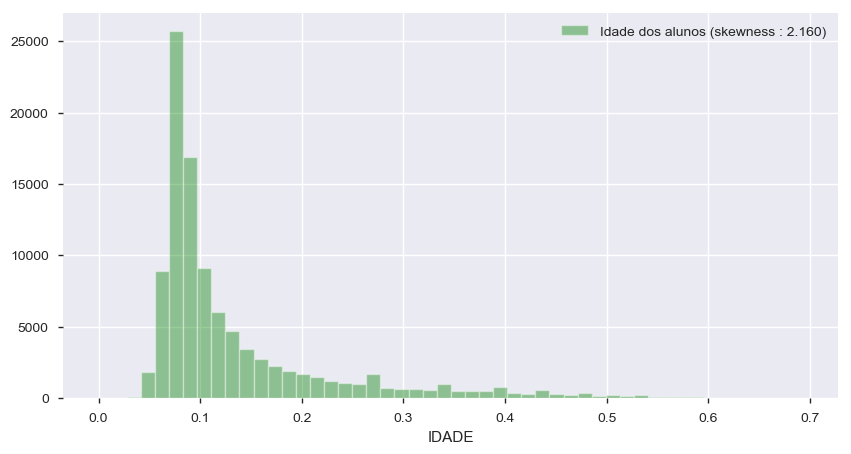

In [73]:
# Distribuição das idades (amostra)

fig, ax = plt.subplots(figsize=(10, 5))
g = sns.distplot(df_enem_copy["IDADE"], 
                 color="g", 
                 kde=False,
                 label="Idade dos alunos (skewness : %.3f)"%(df_enem_copy["IDADE"].skew()), 
                 hist_kws=dict(edgecolor="w", linewidth=1),
                 ax=ax)
                 
g = g.legend(loc="best")

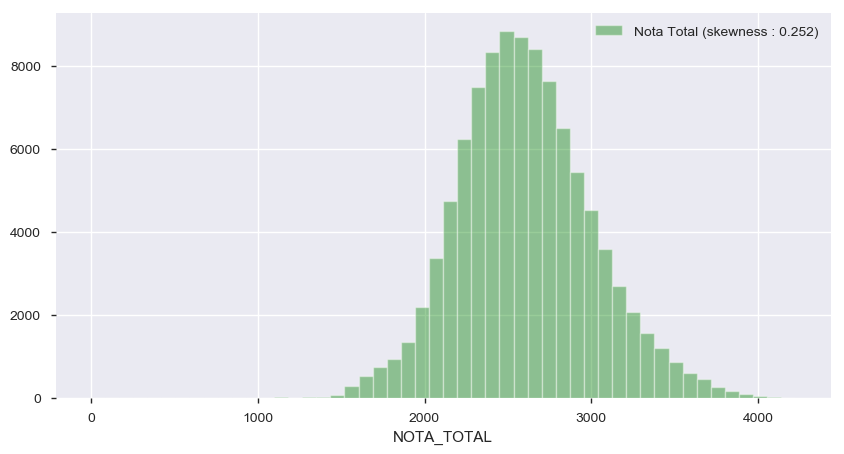

In [74]:
# Distribuição das notas totais (amostra)

fig, ax = plt.subplots(figsize=(10, 5))
g = sns.distplot(df_enem_copy["NOTA_TOTAL"], 
                 color="g", 
                 kde=False,
                 label="Nota Total (skewness : %.3f)"%(df_enem_copy["NOTA_TOTAL"].skew()), 
                 hist_kws=dict(edgecolor="w", linewidth=1),
                 ax=ax)
                 
g = g.legend(loc="best")

In [75]:
# Manter o nome do município

municipio = df_enem_copy['NO_MUNICIPIO_RESIDENCIA']

# Dropá-lo, pois não será útil nas previsões

df_enem_copy.drop(['NO_MUNICIPIO_RESIDENCIA'], axis=1, inplace=True)

In [76]:
y_train = df_enem_copy['NOTA_TOTAL']
df_enem_copy.drop(['NOTA_TOTAL'], axis=1, inplace=True)
X_train = df_enem_copy

# Liberar memória
del df_enem_copy

### Criando colunas dummy

In [77]:
colunas_categoricas = X_train.select_dtypes(include=['category']).columns
X_train = pd.get_dummies(X_train, columns=colunas_categoricas, drop_first=True)

df_enem_map = pd.get_dummies(df_enem_map, columns=colunas_categoricas, drop_first=True)

In [78]:
print('Shape do X_train:', X_train.shape)
print('Shape do y_train:', y_train.shape)

Shape do X_train: (99976, 241)
Shape do y_train: (99976,)


In [79]:
print('Shape do df_enem_map:', df_enem_map.shape)

Shape do df_enem_map: (99976, 243)


## Parte 4 - Validação do modelo

In [80]:
# Validação do modelo usando Kfold e dividindo o dataframe em n_folds partes

seed = 20
n_folds = 3
kfold = KFold(n_folds, shuffle=True, random_state=seed).get_n_splits(X_train)

In [81]:
parameters = {'n_estimators': 200, 'max_depth': 3}

gbr = GradientBoostingRegressor(**parameters)

In [82]:
# Comparando os valores do R2 de cada um dos algoritmos

get_results([gbr], ['Gradient Boosting'], kfold, X_train, y_train)

,Médias,STDs,Algoritmo
0,0.390913,0.016153,Gradient Boosting


In [83]:
X = X_train
y = y_train

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=seed)

In [84]:
gbr.fit(X_train, y_train)

GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
             learning_rate=0.1, loss='ls', max_depth=3, max_features=None,
             max_leaf_nodes=None, min_impurity_decrease=0.0,
             min_impurity_split=None, min_samples_leaf=1,
             min_samples_split=2, min_weight_fraction_leaf=0.0,
             n_estimators=200, n_iter_no_change=None, presort='auto',
             random_state=None, subsample=1.0, tol=0.0001,
             validation_fraction=0.1, verbose=0, warm_start=False)

In [85]:
yhat = gbr.predict(X_test)
r2 = r2_score(y_test, yhat)
mse = mean_squared_error(y_test, yhat)

print(f'R2: {round(r2, 4)}, MSE: {round(mse, 4)}')

R2: 0.4085, MSE: 94418.571


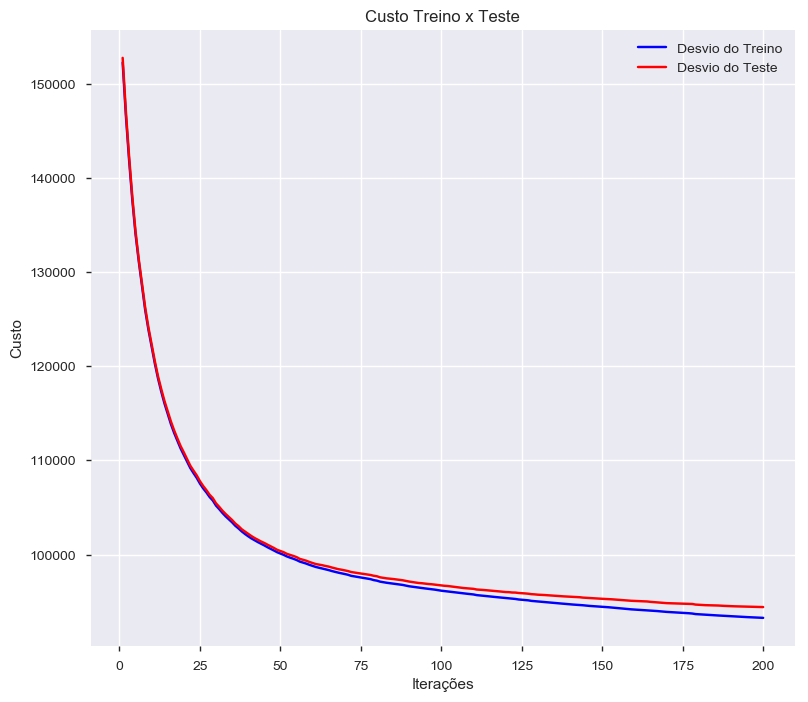

In [86]:
test_score = np.zeros((parameters['n_estimators'],), dtype=np.float64)

for i, y_pred in enumerate(gbr.staged_predict(X_test)):
    test_score[i] = gbr.loss_(y_test, y_pred)

plt.figure(figsize=(20, 8))
plt.subplot(1, 2, 1)
plt.title('Custo Treino x Teste')
plt.plot(np.arange(parameters['n_estimators']) + 1, gbr.train_score_, 'b-',
         label='Desvio do Treino')
plt.plot(np.arange(parameters['n_estimators']) + 1, test_score, 'r-',
         label='Desvio do Teste')
plt.legend(loc='upper right')
plt.xlabel('Iterações')
plt.ylabel('Custo');

## Parte 5 - Explicando os resultados do ENEM (Nota Total)

In [87]:
feature_importance = gbr.feature_importances_

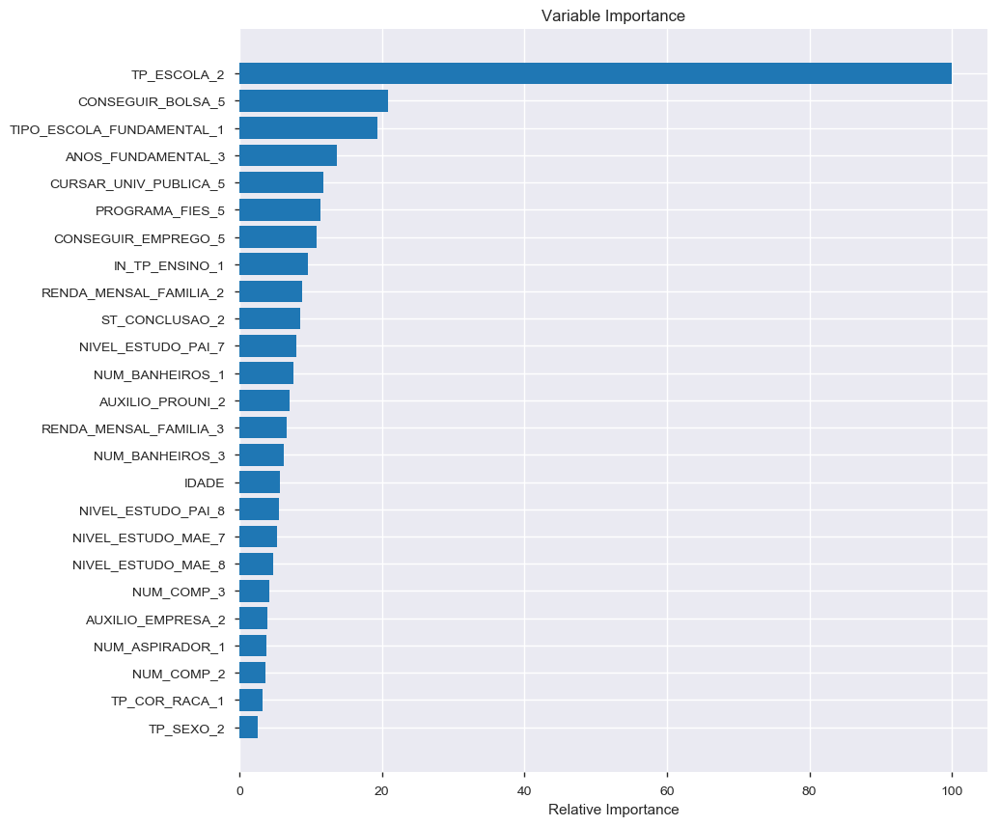

In [88]:
limite = 25

feature_importance = 100.0 * (feature_importance / feature_importance.max())
sorted_idx = np.argsort(feature_importance)[-limite:]

pos = np.arange(sorted_idx.shape[0]) + .5

plt.figure(figsize=(10, 10))
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, X.columns[sorted_idx])
plt.xlabel('Relative Importance')
plt.title('Variable Importance')
plt.show()

### Por Shapley

In [89]:
shap_values = shap.TreeExplainer(gbr).shap_values(X_test)

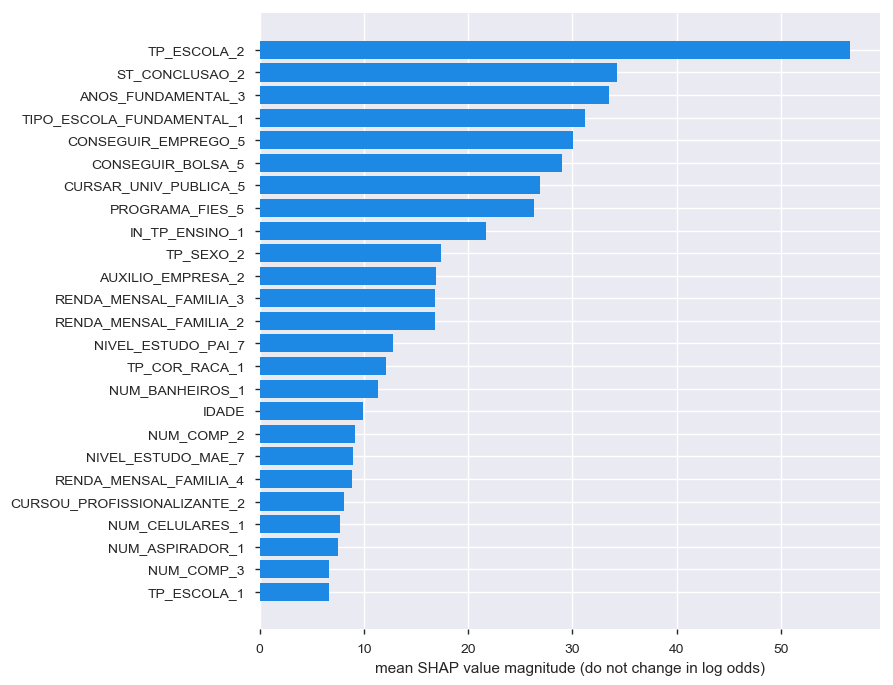

In [90]:
global_shap_vals = np.abs(shap_values).mean(0)[:-1]
variables_values = pd.DataFrame(list(zip(X_test.columns, global_shap_vals)))
variables_values.rename(columns={0:'variable', 1:'shap_value'}, inplace=True)
variables_values.sort_values(by=['shap_value'], ascending=False, inplace=True)
top_n = variables_values.head(limite)

pos = range(0,-top_n.shape[0],-1)
plt.barh(pos, top_n['shap_value'], color="#1E88E5")
plt.yticks(pos, top_n['variable'])
plt.xlabel("mean SHAP value magnitude (do not change in log odds)")
plt.gcf().set_size_inches(8, 8)
plt.gca()
plt.show()

In [91]:
top_n['variable'].values

array(['TP_ESCOLA_2', 'ST_CONCLUSAO_2', 'ANOS_FUNDAMENTAL_3',
       'TIPO_ESCOLA_FUNDAMENTAL_1', 'CONSEGUIR_EMPREGO_5',
       'CONSEGUIR_BOLSA_5', 'CURSAR_UNIV_PUBLICA_5', 'PROGRAMA_FIES_5',
       'IN_TP_ENSINO_1', 'TP_SEXO_2', 'AUXILIO_EMPRESA_2',
       'RENDA_MENSAL_FAMILIA_3', 'RENDA_MENSAL_FAMILIA_2',
       'NIVEL_ESTUDO_PAI_7', 'TP_COR_RACA_1', 'NUM_BANHEIROS_1', 'IDADE',
       'NUM_COMP_2', 'NIVEL_ESTUDO_MAE_7', 'RENDA_MENSAL_FAMILIA_4',
       'CURSOU_PROFISSIONALIZANTE_2', 'NUM_CELULARES_1',
       'NUM_ASPIRADOR_1', 'NUM_COMP_3', 'TP_ESCOLA_1'], dtype=object)

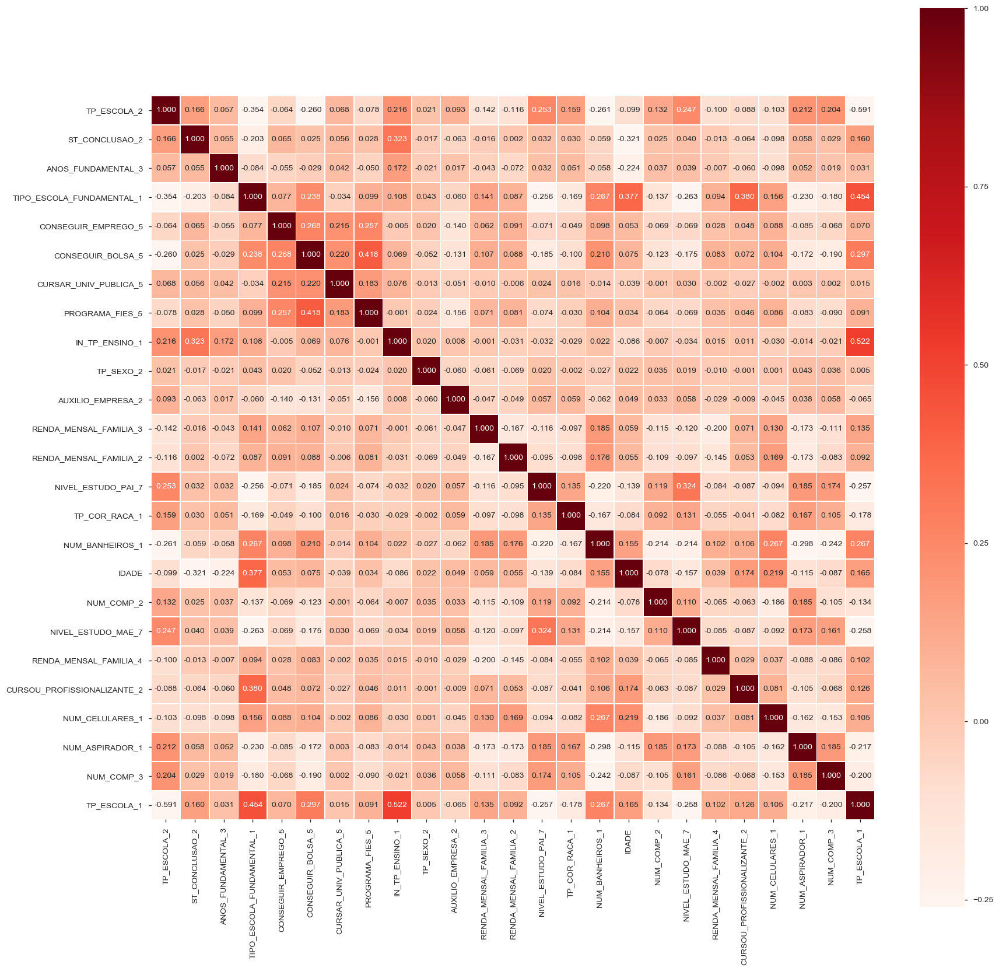

In [92]:
shapley_corr = top_n['variable'].values

f,ax = plt.subplots(figsize=(20, 20))
sns.heatmap(df_enem_map[shapley_corr].corr(), 
            annot=True, 
            linewidths=.4, 
            fmt='.3f', 
            robust=True,
            ax=ax, 
            cmap='Reds',
            square=True);

In [93]:
columns = top_n['variable'].values
corr_list = []
cols_list = []

for col in columns:
    corr = df_enem_map['NOTA_TOTAL'].corr(df_enem_map[col])
    corr_list.append(corr)
    cols_list.append(col)

df_corr = pd.DataFrame(columns=['VARIAVEL','CORRELACAO'])

df_corr['VARIAVEL'] = cols_list
df_corr['CORRELACAO'] = corr_list

df_corr = df_corr.sort_values(by='CORRELACAO', ascending=True)
df_corr.reset_index(drop=True, inplace=True)
df_corr

,VARIAVEL,CORRELACAO
0,TIPO_ESCOLA_FUNDAMENTAL_1,-0.303404
1,CONSEGUIR_BOLSA_5,-0.290987
2,NUM_BANHEIROS_1,-0.271881
3,TP_ESCOLA_1,-0.266031
4,PROGRAMA_FIES_5,-0.205649
5,RENDA_MENSAL_FAMILIA_2,-0.199508
6,CONSEGUIR_EMPREGO_5,-0.188077
7,NUM_CELULARES_1,-0.181069
8,RENDA_MENSAL_FAMILIA_3,-0.177128
9,CURSOU_PROFISSIONALIZANTE_2,-0.157146


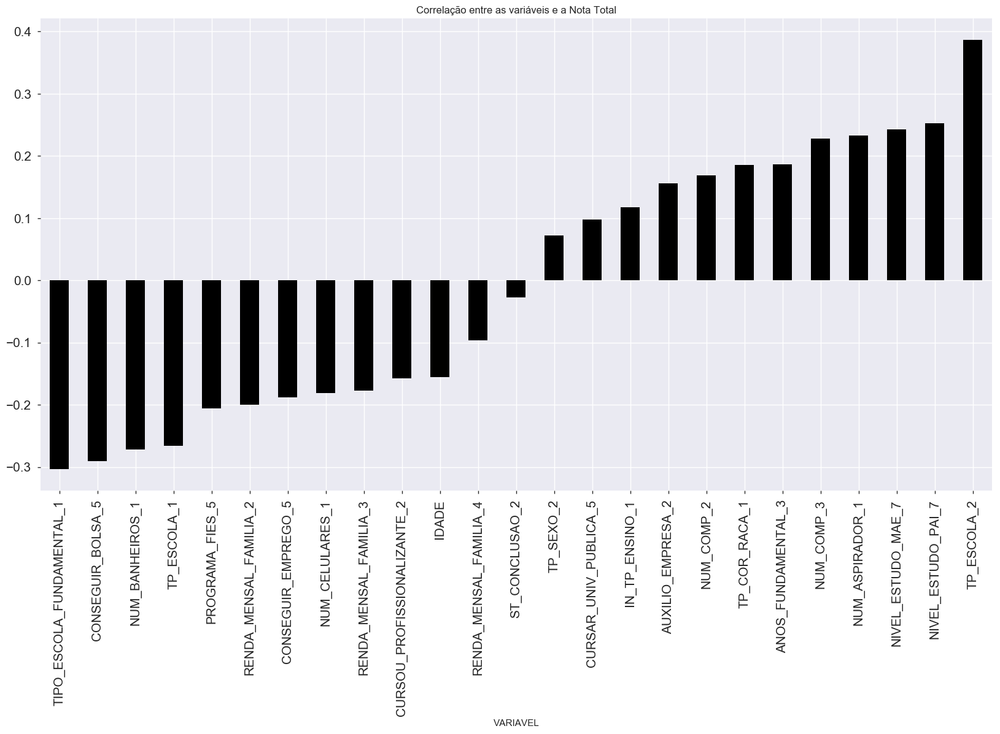

In [94]:
df_corr.plot.bar(x='VARIAVEL', 
                 y='CORRELACAO',figsize=(20, 10), 
                 legend=False,
                 title='Correlação entre as variáveis e a Nota Total', grid=True,
                 fontsize=15, cmap='binary_r');

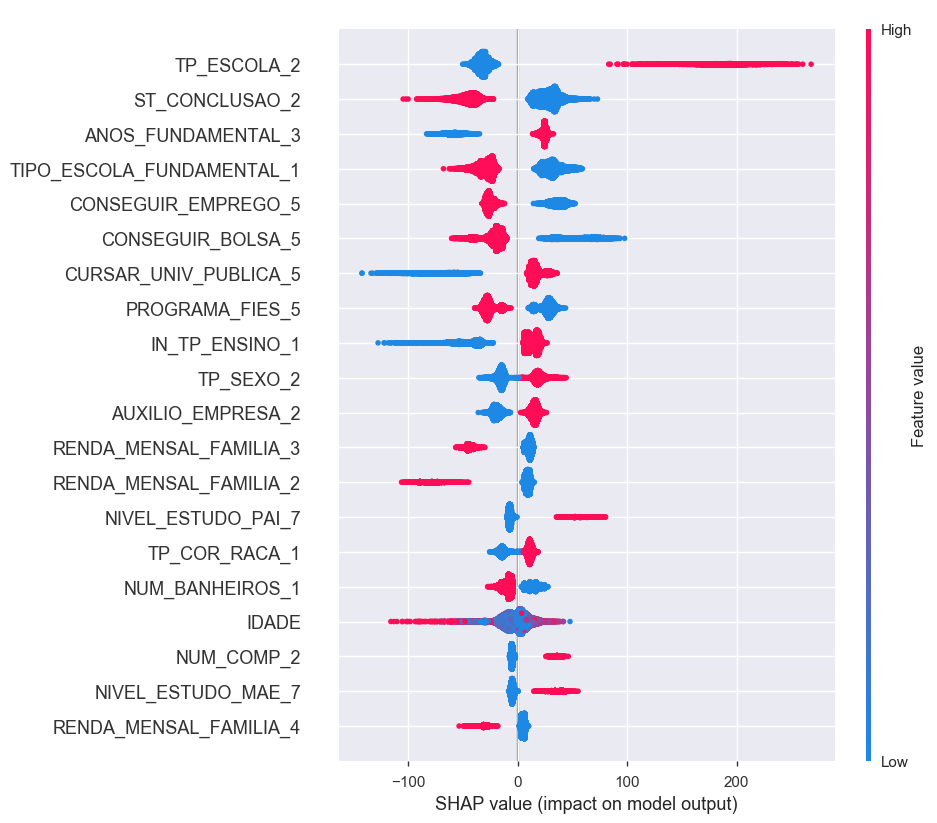

In [95]:
shap.summary_plot(shap_values, X_test)

In [96]:
dados_shapley = pd.read_excel(DIR_DATA + 'dados_shapley_v2.xlsx')
dados_shapley

,No.,NOME DA VARIÁVEL,Descrição,Categoria,Valores
0,1,TP_ESCOLA,Tipo de escola do Ensino Médio,2,(1) Pública – (2) Privada
1,2,ANOS_FUNDAMENTAL,Quantos anos você levou para concluir o Ensino...,8,(0) Não cursei – (1) Não conclui – (2) Menos d...
2,3,CONSEGUIR_BOLSA,"Conseguir uma bolsa de estudos (ProUni, outras)",5,0 indica o fator menos relevante e 5 o fator m...
3,4,ST_CONCLUSAO,Situação de conclusão do Ensino Médio,4,(1) Já concluí o Ensino Médio – (2) Estou curs...
4,5,CURSAR_UNIV_PUBLICA,Ingressar na Educação Superior Pública,5,0 indica o fator menos relevante e 5 o fator m...
5,6,CONSEGUIR_EMPREGO,Aumentar a possibilidade de conseguir um emprego,5,0 indica o fator menos relevante e 5 o fator m...
6,7,PROGRAMA_FIES,Participar do Programa de Financiamento Estuda...,5,0 indica o fator menos relevante e 5 o fator m...
7,8,CURSOU_SUPERIOR,Curso Superior,3,(0) Sem resposta - (1) Sim – (2) Não
8,9,CURSOU_IDIOMAS,Curso de Língua Estrangeira,3,(0) Sem resposta - (1) Sim – (2) Não
9,10,TP_SEXO,Sexo,2,(1) Feminino – (2) Masculino


In [97]:
row_to_show = 251
data_for_prediction = X_test.iloc[row_to_show]  # use 1 row of data here. Could use multiple rows if desired
data_for_prediction_array = data_for_prediction.values.reshape(1, -1)

# Criando o objeto que pode calcular os Shap values

explainer = shap.TreeExplainer(gbr)

# Calculando Shap values

shap_values = explainer.shap_values(data_for_prediction)

In [98]:
# Interpretação: Valores em vermelho aumentam o rating médio e os valores azuis diminuem.

shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, data_for_prediction)

In [99]:
# Visualizando as previsões dos dados de validação

shap_values = shap.TreeExplainer(gbr).shap_values(X_test.head(100))
shap.force_plot(explainer.expected_value, shap_values, X_test.head(100))

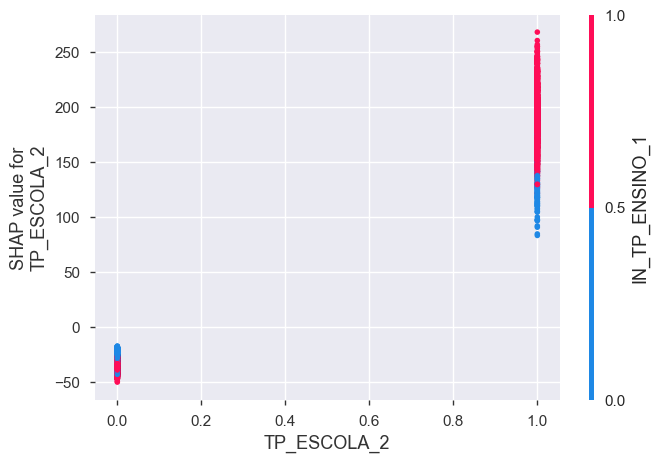

In [100]:
shap_values = shap.TreeExplainer(gbr).shap_values(X_test)
shap.dependence_plot("TP_ESCOLA_2", shap_values, X_test)

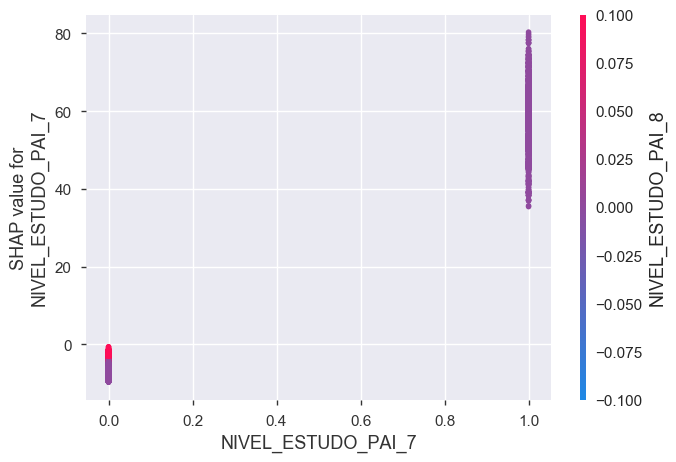

In [101]:
shap_values = shap.TreeExplainer(gbr).shap_values(X_test)
shap.dependence_plot("NIVEL_ESTUDO_PAI_7", shap_values, X_test)

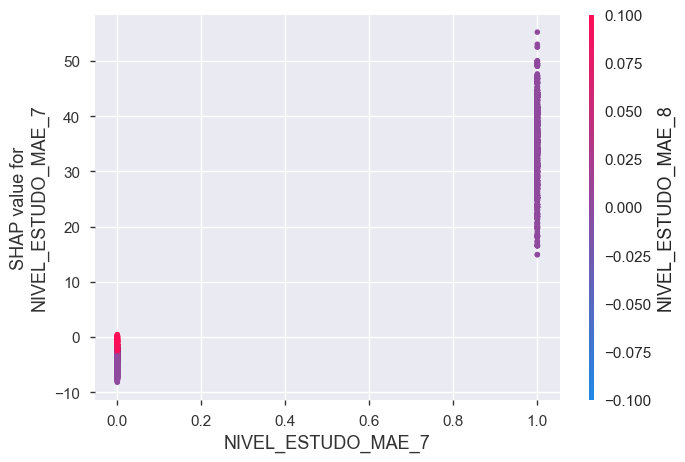

In [102]:
shap_values = shap.TreeExplainer(gbr).shap_values(X_test)
shap.dependence_plot("NIVEL_ESTUDO_MAE_7", shap_values, X_test)

## Parte 6 - Criando o dataframe para o GeoPandas e plotando os mapas de SP

In [106]:
# Carregar layers dos municípios do Brasil

municipios_brasil = gpd.read_file(DIR_DATA + 'geopackage_IBGE.gpkg', 
                                  layer='lim_municipio_a')[['nome', 'geocodigo', 'geometry']].to_crs('+proj=robin')

In [107]:
municipios_brasil['nome'] = municipios_brasil['nome'].apply(padronizaMunicipios)

# Inserindo o código do IBGE do único município com este campo faltante: Amapá no Estado do AP
# Sem isso não seria possível separar os municípios cujo código começam com 35 (pertencentes ao Estado de SP)

municipios_brasil['geocodigo'] = municipios_brasil['geocodigo'].replace(np.NaN, '1600105')

In [108]:
# Separar apenas os municípios do Estado de SP

municipios_map_sp = \
municipios_brasil[municipios_brasil['geocodigo'].str.startswith('35')].sort_values(by=['nome'], ascending=True)

municipios_map_sp.reset_index(drop=True, inplace=True)
municipios_map_sp.drop('geocodigo', axis=1, inplace=True)

# Liberando memória

del municipios_brasil

In [109]:
# Agrupando os municípios e recuperando as informações agregadas de cada um deles
# Gerando uma lista de dataframes que serão unidos em um único com todas as features

# Cópia do dataframe inicial do ENEM: df_enem_map

dfs = [
       df_enem_map.groupby('NO_MUNICIPIO_RESIDENCIA')['NOTA_TOTAL'].median().to_frame().reset_index(), 
       df_enem_map.groupby('NO_MUNICIPIO_RESIDENCIA')['TP_ESCOLA_2'].mean().to_frame().reset_index(),
       df_enem_map.groupby('NO_MUNICIPIO_RESIDENCIA')['TIPO_ESCOLA_FUNDAMENTAL_1'].mean().to_frame().reset_index(),
       df_enem_map.groupby('NO_MUNICIPIO_RESIDENCIA')['ST_CONCLUSAO_2'].mean().to_frame().reset_index(),
       df_enem_map.groupby('NO_MUNICIPIO_RESIDENCIA')['CONSEGUIR_BOLSA_5'].mean().to_frame().reset_index(),
       df_enem_map.groupby('NO_MUNICIPIO_RESIDENCIA')['CONSEGUIR_EMPREGO_5'].mean().to_frame().reset_index(),
       df_enem_map.groupby('NO_MUNICIPIO_RESIDENCIA')['PROGRAMA_FIES_5'].mean().to_frame().reset_index(),
       df_enem_map.groupby('NO_MUNICIPIO_RESIDENCIA')['CURSAR_UNIV_PUBLICA_5'].mean().to_frame().reset_index(),
       df_enem_map.groupby('NO_MUNICIPIO_RESIDENCIA')['IN_TP_ENSINO_1'].mean().to_frame().reset_index(),   
       df_enem_map.groupby('NO_MUNICIPIO_RESIDENCIA')['RENDA_MENSAL_FAMILIA_2'].mean().to_frame().reset_index(),
       df_enem_map.groupby('NO_MUNICIPIO_RESIDENCIA')['RENDA_MENSAL_FAMILIA_3'].mean().to_frame().reset_index(),
       df_enem_map.groupby('NO_MUNICIPIO_RESIDENCIA')['TP_SEXO_2'].mean().to_frame().reset_index(),
       df_enem_map.groupby('NO_MUNICIPIO_RESIDENCIA')['AUXILIO_EMPRESA_2'].mean().to_frame().reset_index(),
       df_enem_map.groupby('NO_MUNICIPIO_RESIDENCIA')['NIVEL_ESTUDO_PAI_7'].mean().to_frame().reset_index(),
       df_enem_map.groupby('NO_MUNICIPIO_RESIDENCIA')['TP_COR_RACA_1'].mean().to_frame().reset_index(),
       df_enem_map.groupby('NO_MUNICIPIO_RESIDENCIA')['NUM_BANHEIROS_1'].mean().to_frame().reset_index(),
       df_enem_map.groupby('NO_MUNICIPIO_RESIDENCIA')['RENDA_MENSAL_FAMILIA_4'].mean().to_frame().reset_index(),
       df_enem_map.groupby('NO_MUNICIPIO_RESIDENCIA')['IDADE'].mean().to_frame().reset_index(),
       df_enem_map.groupby('NO_MUNICIPIO_RESIDENCIA')['NUM_COMP_2'].mean().to_frame().reset_index(),
       df_enem_map.groupby('NO_MUNICIPIO_RESIDENCIA')['NIVEL_ESTUDO_MAE_7'].mean().to_frame().reset_index(),
       df_enem_map.groupby('NO_MUNICIPIO_RESIDENCIA')['NUM_CELULARES_1'].mean().to_frame().reset_index(),
       df_enem_map.groupby('NO_MUNICIPIO_RESIDENCIA')['CURSOU_PROFISSIONALIZANTE_2'].mean().to_frame().reset_index(),
       df_enem_map.groupby('NO_MUNICIPIO_RESIDENCIA')['NUM_CELULARES_1'].mean().to_frame().reset_index(),
       df_enem_map.groupby('NO_MUNICIPIO_RESIDENCIA')['AUXILIO_PROUNI_2'].mean().to_frame().reset_index(),
       df_enem_map.groupby('NO_MUNICIPIO_RESIDENCIA')['NUM_COMP_3'].mean().to_frame().reset_index(),
       df_enem_map.groupby('NO_MUNICIPIO_RESIDENCIA')['TP_ESCOLA_1'].mean().to_frame().reset_index()
      ]

df_features = reduce(lambda left, right: pd.merge(left, right, on='NO_MUNICIPIO_RESIDENCIA'), dfs)
df_features.head()

,NO_MUNICIPIO_RESIDENCIA,NOTA_TOTAL,TP_ESCOLA_2,TIPO_ESCOLA_FUNDAMENTAL_1,ST_CONCLUSAO_2,CONSEGUIR_BOLSA_5,CONSEGUIR_EMPREGO_5,PROGRAMA_FIES_5,CURSAR_UNIV_PUBLICA_5,IN_TP_ENSINO_1,RENDA_MENSAL_FAMILIA_2,RENDA_MENSAL_FAMILIA_3,TP_SEXO_2,AUXILIO_EMPRESA_2,NIVEL_ESTUDO_PAI_7,TP_COR_RACA_1,NUM_BANHEIROS_1,RENDA_MENSAL_FAMILIA_4,IDADE,NUM_COMP_2,NIVEL_ESTUDO_MAE_7,NUM_CELULARES_1_x,CURSOU_PROFISSIONALIZANTE_2,NUM_CELULARES_1_y,AUXILIO_PROUNI_2,NUM_COMP_3,TP_ESCOLA_1
0,ADAMANTINA,2670.70,0.212766,0.276596,0.468085,0.787234,0.510638,0.531915,0.765957,0.702128,0.170213,0.106383,0.489362,0.617021,0.170213,0.595745,0.361702,0.085106,20.872340,0.255319,0.191489,0.234043,0.255319,0.234043,0.148936,0.042553,0.510638
1,ADOLFO,2391.00,0.285714,0.857143,0.857143,0.857143,0.571429,0.857143,1.000000,0.857143,0.142857,0.000000,0.285714,0.285714,0.000000,0.714286,0.714286,0.571429,20.857143,0.142857,0.142857,0.142857,0.285714,0.142857,0.142857,0.000000,0.714286
2,AGUAI,2446.90,0.138462,0.446154,0.400000,0.723077,0.692308,0.584615,0.707692,0.553846,0.138462,0.323077,0.553846,0.538462,0.061538,0.707692,0.600000,0.184615,19.692308,0.184615,0.092308,0.246154,0.292308,0.246154,0.200000,0.076923,0.523077
3,AGUAS DA PRATA,2581.05,0.055556,0.555556,0.500000,0.666667,0.722222,0.500000,0.833333,0.833333,0.222222,0.333333,0.444444,0.333333,0.166667,0.666667,0.666667,0.166667,18.500000,0.055556,0.166667,0.222222,0.166667,0.222222,0.000000,0.000000,0.777778
4,AGUAS DE LINDOIA,2730.50,0.105263,0.526316,0.263158,0.824561,0.631579,0.649123,0.771930,0.596491,0.017544,0.210526,0.473684,0.508772,0.035088,0.771930,0.561404,0.157895,20.789474,0.157895,0.122807,0.245614,0.385965,0.245614,0.070175,0.017544,0.631579


In [110]:
# Não podemos renomear a coluna 'nome' nem 'geometry'. Se fizermos isso, não conseguiremos plotar o mapa.

municipios_map_sp = municipios_map_sp.merge(df_features, left_on='nome',
                                right_on='NO_MUNICIPIO_RESIDENCIA')

municipios_map_sp.drop('NO_MUNICIPIO_RESIDENCIA', axis=1, inplace=True)

# Seleciona todas as colunas menos 'nome', 'geometry', 'RENDA_PER_CAPITA' e 'NOTA_TOTAL'

colunas = [col for col in municipios_map_sp.columns if ('nome' not in col) & \
                                                     ('geometry' not in col) & \
                                                     ('NOTA_TOTAL' not in col) & \
                                                     ('IDADE' not in col)]
for col in colunas:
    # Converter em porcentagem e aumentar a escala
    municipios_map_sp[col] = municipios_map_sp[col] * 100

# Liberando memória

del dfs
del df_features
del df_enem_map

municipios_map_sp.head()

,nome,geometry,NOTA_TOTAL,TP_ESCOLA_2,TIPO_ESCOLA_FUNDAMENTAL_1,ST_CONCLUSAO_2,CONSEGUIR_BOLSA_5,CONSEGUIR_EMPREGO_5,PROGRAMA_FIES_5,CURSAR_UNIV_PUBLICA_5,IN_TP_ENSINO_1,RENDA_MENSAL_FAMILIA_2,RENDA_MENSAL_FAMILIA_3,TP_SEXO_2,AUXILIO_EMPRESA_2,NIVEL_ESTUDO_PAI_7,TP_COR_RACA_1,NUM_BANHEIROS_1,RENDA_MENSAL_FAMILIA_4,IDADE,NUM_COMP_2,NIVEL_ESTUDO_MAE_7,NUM_CELULARES_1_x,CURSOU_PROFISSIONALIZANTE_2,NUM_CELULARES_1_y,AUXILIO_PROUNI_2,NUM_COMP_3,TP_ESCOLA_1
0,ADAMANTINA,(POLYGON ((-4726864.208014516 -2288597.1756909...,2670.70,21.276596,27.659574,46.808511,78.723404,51.063830,53.191489,76.595745,70.212766,17.021277,10.638298,48.936170,61.702128,17.021277,59.574468,36.170213,8.510638,20.872340,25.531915,19.148936,23.404255,25.531915,23.404255,14.893617,4.255319,51.063830
1,ADOLFO,(POLYGON ((-4596615.100319558 -2268596.3310278...,2391.00,28.571429,85.714286,85.714286,85.714286,57.142857,85.714286,100.000000,85.714286,14.285714,0.000000,28.571429,28.571429,0.000000,71.428571,71.428571,57.142857,20.857143,14.285714,14.285714,14.285714,28.571429,14.285714,14.285714,0.000000,71.428571
2,AGUAI,(POLYGON ((-4343788.558907497 -2349285.8585229...,2446.90,13.846154,44.615385,40.000000,72.307692,69.230769,58.461538,70.769231,55.384615,13.846154,32.307692,55.384615,53.846154,6.153846,70.769231,60.000000,18.461538,19.692308,18.461538,9.230769,24.615385,29.230769,24.615385,20.000000,7.692308,52.307692
3,AGUAS DA PRATA,(POLYGON ((-4321919.62254707 -2333679.58837314...,2581.05,5.555556,55.555556,50.000000,66.666667,72.222222,50.000000,83.333333,83.333333,22.222222,33.333333,44.444444,33.333333,16.666667,66.666667,66.666667,16.666667,18.500000,5.555556,16.666667,22.222222,16.666667,22.222222,0.000000,0.000000,77.777778
4,AGUAS DE LINDOIA,(POLYGON ((-4306730.574420401 -2399937.0595314...,2730.50,10.526316,52.631579,26.315789,82.456140,63.157895,64.912281,77.192982,59.649123,1.754386,21.052632,47.368421,50.877193,3.508772,77.192982,56.140351,15.789474,20.789474,15.789474,12.280702,24.561404,38.596491,24.561404,7.017544,1.754386,63.157895


In [111]:
# Paleta de cores
'''

Possible values are: Accent, Accent_r, Blues, Blues_r, BrBG, BrBG_r, BuGn, BuGn_r, BuPu, BuPu_r, 
CMRmap, CMRmap_r, Dark2, Dark2_r, GnBu, GnBu_r, Greens, Greens_r, Greys, Greys_r, OrRd, OrRd_r, 
Oranges, Oranges_r, PRGn, PRGn_r, Paired, Paired_r, Pastel1, Pastel1_r, Pastel2, Pastel2_r, PiYG, PiYG_r, 
PuBu, PuBuGn, PuBuGn_r, PuBu_r, PuOr, PuOr_r, PuRd, PuRd_r, Purples, Purples_r, RdBu, RdBu_r, RdGy, RdGy_r, 
RdPu, RdPu_r, RdYlBu, RdYlBu_r, RdYlGn, RdYlGn_r, Reds, Reds_r, Set1, Set1_r, Set2, Set2_r, Set3, Set3_r, 
Spectral, Spectral_r, Wistia, Wistia_r, YlGn, YlGnBu, YlGnBu_r, YlGn_r, YlOrBr, YlOrBr_r, YlOrRd, YlOrRd_r, 
afmhot, afmhot_r, autumn, autumn_r, binary, binary_r, bone, bone_r, brg, brg_r, bwr, bwr_r, cividis, cividis_r, 
cool, cool_r, coolwarm, coolwarm_r, copper, copper_r, cubehelix, cubehelix_r, flag, flag_r, gist_earth, 
gist_earth_r, gist_gray, gist_gray_r, gist_heat, gist_heat_r, gist_ncar, gist_ncar_r, gist_rainbow, 
gist_rainbow_r, gist_stern, gist_stern_r, gist_yarg, gist_yarg_r, gnuplot, gnuplot2, gnuplot2_r, gnuplot_r, 
gray, gray_r, hot, hot_r, hsv, hsv_r, icefire, icefire_r, inferno, inferno_r, jet, jet_r, magma, magma_r, 
mako, mako_r, nipy_spectral, nipy_spectral_r, ocean, ocean_r, pink, pink_r, plasma, plasma_r, prism, prism_r, 
rainbow, rainbow_r, rocket, rocket_r, seismic, seismic_r, spring, spring_r, summer, summer_r, tab10, tab10_r, 
tab20, tab20_r, tab20b, tab20b_r, tab20c, tab20c_r, terrain, terrain_r, viridis, viridis_r, vlag, vlag_r, 
winter, winter_r

'''
cmap = 'viridis'

# Quantidade de cores que irão representar os intervalos da coluna escolhida
colors = 10

# Tamanho da figura
figsize = (30, 20)

# Para fazer a distribuição de cores de acordo com os intervalos 
scheme = 'equal_interval'

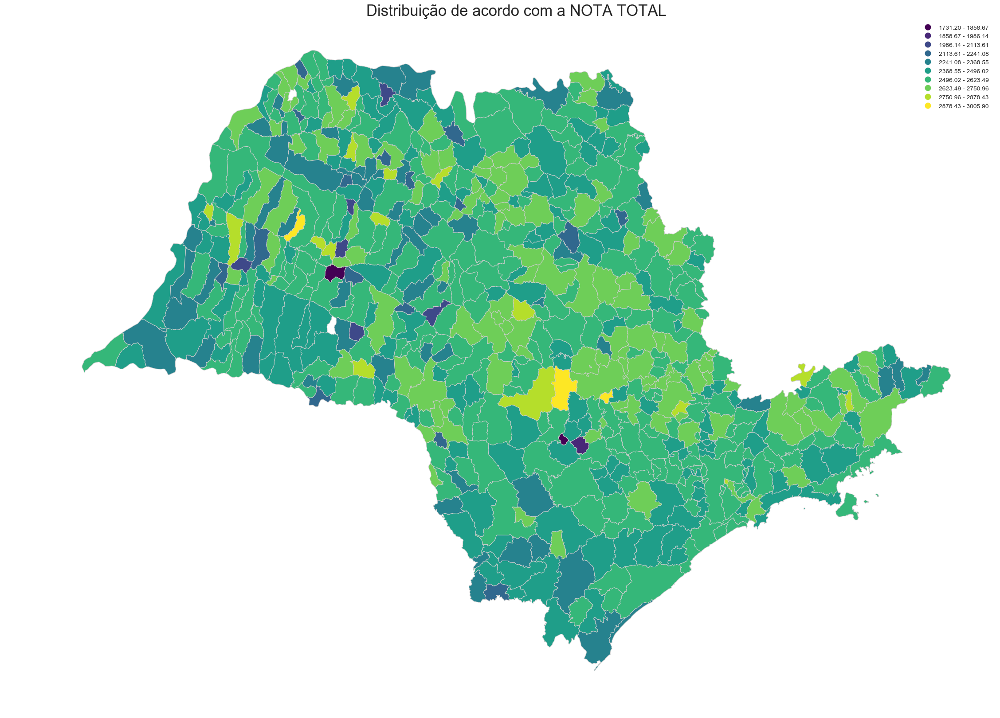

In [112]:
ax = municipios_map_sp.plot(column='NOTA_TOTAL', 
                            cmap=cmap, 
                            figsize=figsize, 
                            scheme=scheme, 
                            linewidth=0.8, 
                            edgecolor='0.8',
                            k=colors, 
                            legend=True)
ax.axis('off')
ax.set_title("Distribuição de acordo com a NOTA TOTAL", 
             fontdict={'fontsize': '25', 'fontweight' : '10'}, 
             loc='center');

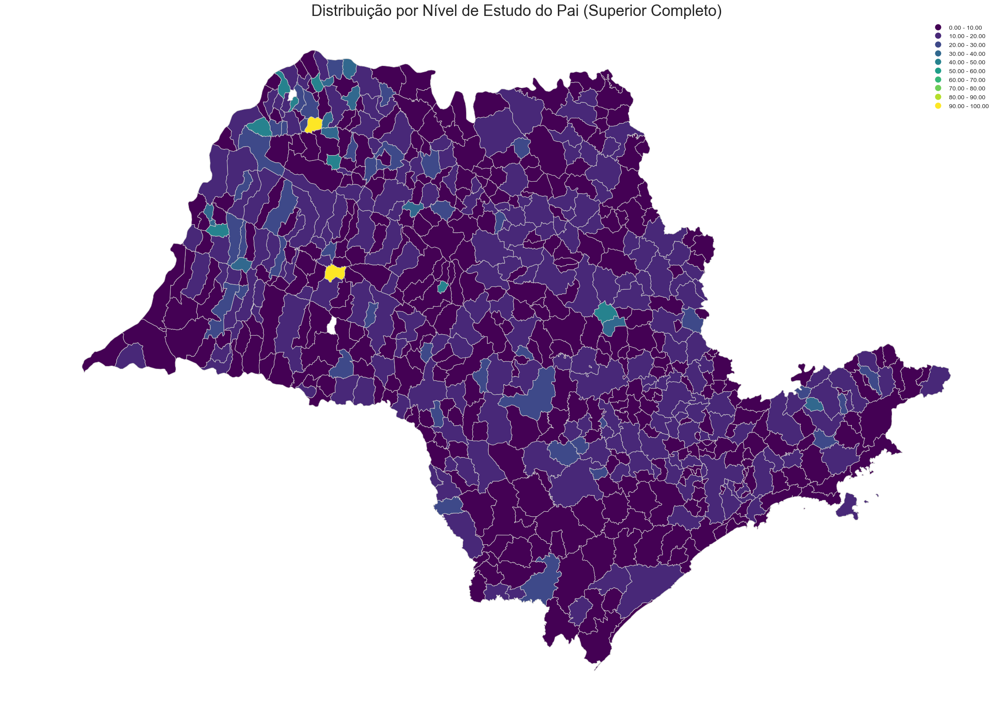

In [113]:
ax = municipios_map_sp.plot(column='NIVEL_ESTUDO_PAI_7', 
                            cmap=cmap, 
                            figsize=figsize, 
                            scheme=scheme, 
                            linewidth=0.8, 
                            edgecolor='0.8',
                            k=colors, 
                            legend=True)
ax.axis('off')
ax.set_title("Distribuição por Nível de Estudo do Pai (Superior Completo)", 
             fontdict={'fontsize': '25', 'fontweight' : '10'}, 
             loc='center');

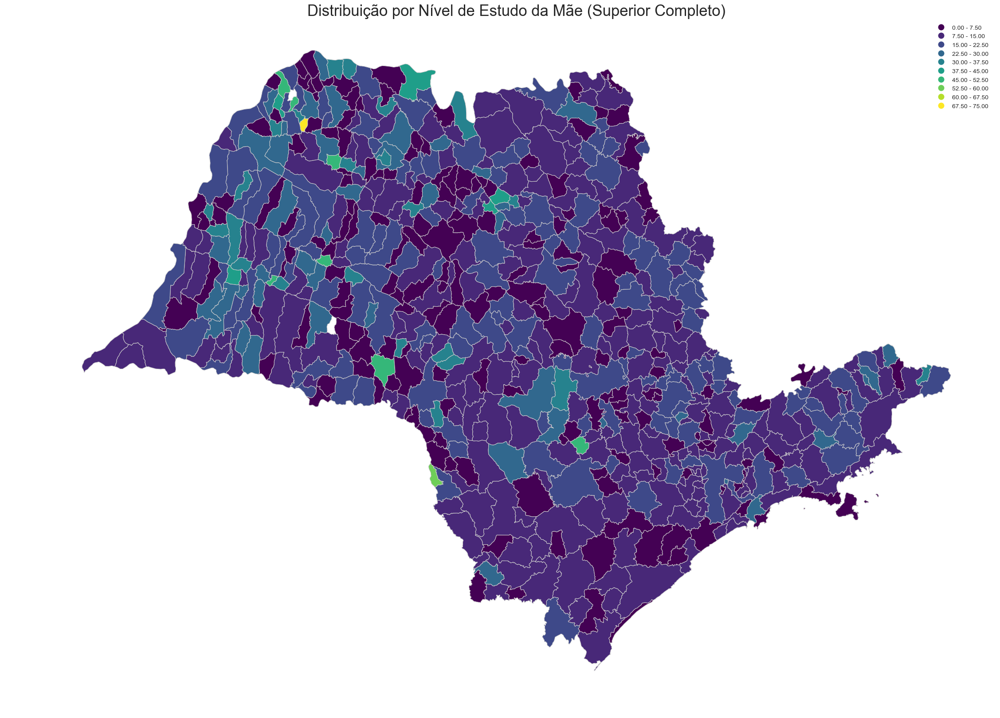

In [114]:
ax = municipios_map_sp.plot(column='NIVEL_ESTUDO_MAE_7', 
                            cmap=cmap, 
                            figsize=figsize, 
                            scheme=scheme, 
                            linewidth=0.8, 
                            edgecolor='0.8',
                            k=colors, 
                            legend=True)
ax.axis('off')
ax.set_title("Distribuição por Nível de Estudo da Mãe (Superior Completo)", 
             fontdict={'fontsize': '25', 'fontweight' : '10'}, 
             loc='center');

## Parte 7 - Analisando o PISA e encontrando um contrafactual

In [115]:
pisa = pd.read_csv(DIR_DATA + 'PISA_REGIONS.csv', encoding='iso-8859-1')
pisa = pisa.replace('ã','0')
pisa = pisa.replace('ö','0')
pisa['MATH'] = pisa['MATH'].astype(float)
pisa['READING'] = pisa['READING'].astype(float)
pisa['SCIENCE'] = pisa['SCIENCE'].astype(float)
pisa.reset_index(drop=True, inplace=True)
pisa.head()

,REGIONS,MATH,READING,SCIENCE
0,International Average (OECD Countries),490.0,493.0,493.0
1,Average of the Selected Jurisdictions,461.0,462.0,467.0
2,Australia,494.0,503.0,510.0
3,Austria,497.0,485.0,495.0
4,Belgium,507.0,499.0,502.0


In [116]:
pisa['GRADE'] = round((pisa.MATH + pisa.READING + pisa.SCIENCE)/3, 3)
pisa = pisa[pisa['GRADE'] > 0]
pisa = pisa.sort_values(by='GRADE', ascending=False)
pisa.head()

,REGIONS,MATH,READING,SCIENCE,GRADE
77,Singapore,564.0,535.0,556.0,551.667
54,Hong Kong - China,548.0,527.0,523.0,532.667
19,Japan,532.0,516.0,538.0,528.667
63,Macao - China,544.0,509.0,529.0,527.333
9,Estonia,520.0,519.0,534.0,524.333


In [117]:
pisa.drop(['MATH','READING','SCIENCE'], axis=1, inplace=True)

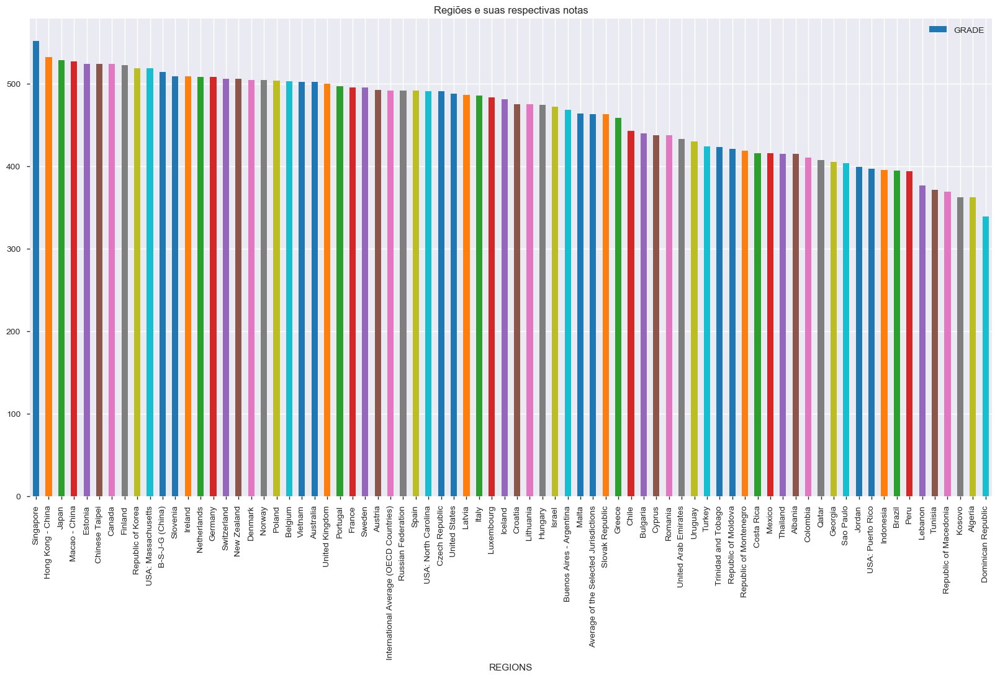

In [118]:
# Regiões e suas respectivas notas

pisa.plot.bar(x='REGIONS', y='GRADE',figsize=(20,10), title='Regiões e suas respectivas notas');

In [119]:
# Regiões com as notas entre (Nota de SP - variacao) <= grade <= (Nota de SP + variacao)
grade_sp = pisa[pisa['REGIONS'] == 'Sao Paulo'].iloc[0]['GRADE']

variacao = 10

condition1 = pisa['GRADE'] >= grade_sp - variacao
condition2 = pisa['GRADE'] <= grade_sp + variacao
condition = condition1 & condition2
pisa_around_sp = pisa[condition]
pisa_around_sp

# Liberando memória
del pisa

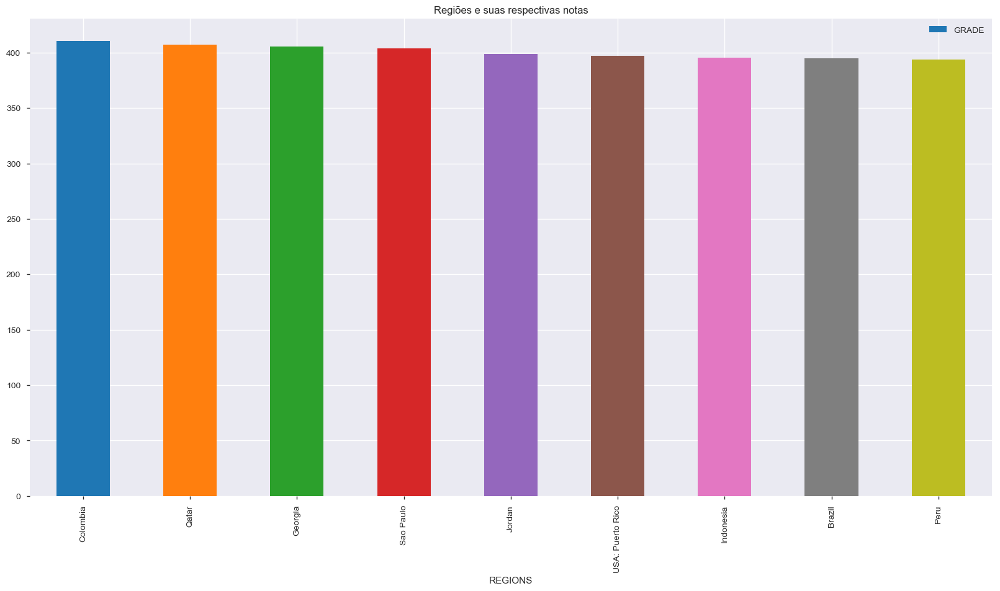

In [120]:
# São Paulo e seus "vizinhos" de notas

pisa_around_sp.plot.bar(x='REGIONS', y='GRADE',figsize=(20,10), 
                        title='Regiões e suas respectivas notas', grid=True);

### Dados da Colômbia - Exame Nacional - ICFES

In [121]:
from sodapy import Socrata

In [122]:
# Dados abertos da Colômbia - Resultado do SABER 11 (2014)

client = Socrata("www.datos.gov.co", None)

max_registros = 100000
results = client.get("fs87-yzra", limit=max_registros)

In [123]:
pd.set_option('display.max_columns', 500)
df_saber_11 = pd.DataFrame(results)

# Liberando memória
del client
del results

In [124]:
lst_repl = ['estu_mcpio_presentacion','estu_depto_presentacion','estu_reside_depto','estu_reside_mcpio','cole_mcpio_ubicacion','cole_depto_ubicacion','cole_caracter']
for col in lst_repl:
    df_saber_11[col] = df_saber_11[col].str.replace('Ã‘','N')
    df_saber_11[col] = df_saber_11[col].str.replace('Ã‰','E')
    df_saber_11[col] = df_saber_11[col].str.replace('Ã','A')
    df_saber_11[col] = df_saber_11[col].str.replace('Ã“','O')
    
df_saber_11.head()

,cole_area_ubicacion,cole_bilingue,cole_calendario,cole_caracter,cole_cod_dane_institucion,cole_cod_icfes,cole_cod_mcpio_ubicacion,cole_depto_ubicacion,cole_genero,cole_jornada,cole_mcpio_ubicacion,cole_naturaleza,cole_nombre_sede,cole_valor_pension,decil_c_naturales,decil_comp_ciudadana,decil_ingles,decil_lectura_critica,decil_matematicas,decil_razona_cuant,decil_sociales_ciudadanas,desemp_ingles,estu_ano_matricula_primero,estu_ano_matricula_sexto,estu_ano_termino_bachill,estu_ano_termino_quinto,estu_anos_colegio_actual,estu_anos_preescolar,estu_area_reside,estu_cod_depto_presentacion,estu_cod_mcpio_presentacion,estu_cod_otro_pais_plantel,estu_cod_plantel,estu_cod_reside_depto,estu_cod_reside_mcpio,estu_consecutivo,estu_cuantos_cole_estudio,estu_depto_presentacion,estu_edad,estu_estudiante,estu_etnia,estu_fecha_nacimiento,estu_genero,estu_ies_cod_deseada,estu_ies_cod_mpio_deseada,estu_ies_deseada_nombre,estu_ies_mpio_deseada,estu_ingreso_carrera,estu_limita_autismo,estu_limita_condicionespecial,estu_limita_invidente,estu_limita_motriz,estu_limita_sdown,estu_limita_sordo,estu_mcpio_presentacion,estu_mes_termino_bachill,estu_otro_plantel,estu_pais_reside,estu_por_amigosestudiando,estu_por_buscandocarrera,estu_por_colombiaaprende,estu_por_costomatricula,estu_por_influenciaalguien,estu_por_interespersonal,estu_por_mejorarposicionsocial,estu_por_oportunidades,estu_por_orientacionvocacional,estu_por_otrarazon,estu_por_tradicionfamiliar,estu_por_ubicacion,estu_por_unicaqueofrece,estu_presento_antecedentes,estu_presento_expectativas,estu_prestigioinstitucion,estu_privado_libertad,estu_programa_academicodeseado,estu_puesto,estu_punt_esperado_ingles,estu_punt_esperado_lenguaje,estu_punt_esperado_matematicas,estu_razon_retiro,estu_recibe_salario,estu_reprobo_cuarto,estu_reprobo_decimo,estu_reprobo_noveno,estu_reprobo_octavo,estu_reprobo_once_mas,estu_reprobo_primero,estu_reprobo_quinto,estu_reprobo_segundo,estu_reprobo_septimo,estu_reprobo_sexto,estu_reprobo_tercero,estu_reside_depto,estu_reside_mcpio,estu_retirarse_colegio,estu_salario_esperado_bach,estu_salario_esperado_profes,estu_salario_esperado_tecnico,estu_tipo_carrera_deseada,estu_tipo_documento,estu_total_alumnos_curso,estu_trabaja,estu_veces_estado,estu_veces_estado_estudiantil,estu_zona_reside,fami_automovil,fami_celular,fami_computador,fami_cuartos_hogar,fami_dvd,fami_educa_madre,fami_educa_padre,fami_estrato_vivienda,fami_horno,fami_ingreso_fmiliar_mensual,fami_internet,fami_lavadora,fami_microondas,fami_nevera,fami_nivel_sisben,fami_ocupa_madre,fami_ocupa_padre,fami_personas_hogar,fami_pisoshogar,fami_servicio_television,fami_telefono_fijo,periodo,punt_c_naturales,punt_comp_ciudadana,punt_global,punt_ingles,punt_lectura_critica,punt_matematicas,punt_razona_cuant,punt_sociales_ciudadanas
0,U,N,A,TECNICO/ACADEMICO,105001015091,113324,05001,ANTIOQUIA,MIXTO,M,MEDELLIN,OFICIAL,INST EDUC FE Y ALEGRIA GRANIZAL,1,D08,D07,D08,D09,D08,D10,D08,A1,NaN,NaN,NaN,NaN,NaN,NaN,U,5,05001,NaN,NaN,5,05001,SABER1120142000001,NaN,ANTIOQUIA,17,ESTUDIANTE,100,NaN,M,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,MEDELLIN,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NO,NO,NaN,N,NaN,164,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ANTIOQUIA,MEDELLIN,NaN,NaN,NaN,NaN,NaN,TI,NaN,1,NaN,1,6,N,S,N,2,N,4,4,2,S,2,N,N,N,S,2,9,10,4,2,N,S,20142,58,56,292,53,60,58,65,59
1,U,N,A,TECNICO/ACADEMICO,105051000028,38992,05051,ANTIOQUIA,MIXTO,M,ARBOLETES,OFICIAL,I. E. MIGUEL VICENTE GARRIDO ORTIZ,1,D03,D07,D03,D04,D04,D05,D07,A-,NaN,NaN,NaN,NaN,NaN,NaN,U,5,05051,NaN,NaN,5,05051,SABER1120142000002,NaN,ANTIOQUIA,17,ESTUDIANTE,100,1996-06-12T00:00:00.000,M,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ARBOLETES,NaN,NaN,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NO,NO,NaN,N,NaN,589,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ANTIOQUIA,ARBOLETES,NaN,NaN,NaN,NaN,NaN,TI,NaN,1,NaN,1,10,N,S,N,2,N,5,3,1,N,1,N,S,N,S,1,10,9,3,2,S,N,20142,44,56,237,45,45,47,49,54
2,U,N,A

### Limpando as colunas que possuem as pontuações do candidato e deixando somente a pontuação geral

In [125]:
punt_t_lst = []
for word in list(df_saber_11):
    if word.startswith('punt'):
        if word != 'punt_global':
            punt_t_lst.append(word)
punt_t_lst

['punt_c_naturales',
 'punt_comp_ciudadana',
 'punt_ingles',
 'punt_lectura_critica',
 'punt_matematicas',
 'punt_razona_cuant',
 'punt_sociales_ciudadanas']

### Limpando as colunas com mais de 15% de valores nulos

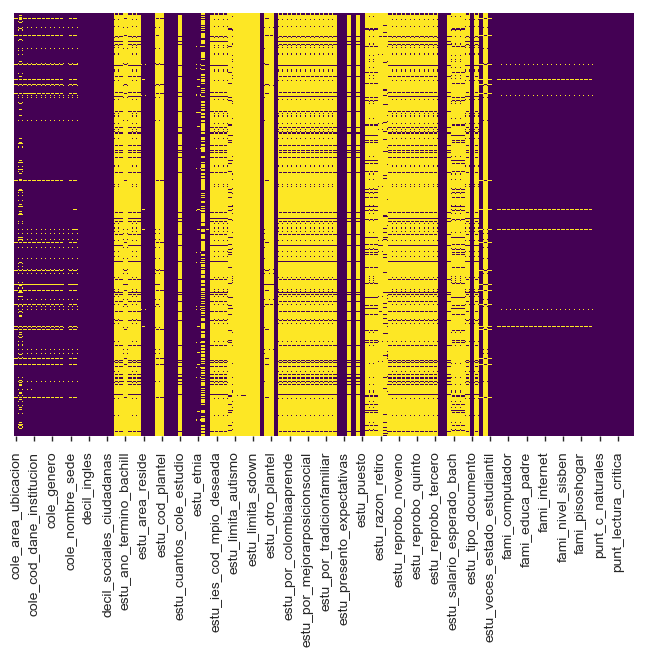

In [126]:
sns.heatmap(df_saber_11.isnull(), yticklabels=False, cbar=False, cmap='viridis');

In [127]:
df_cols_values = pd.DataFrame(df_saber_11.isnull().sum(axis = 0) / max_registros * 100)
df_cols_values.reset_index(inplace=True)
df_cols_values.rename(mapper={'index':'col_name', 0:'null_perc'}, axis=1, inplace=True)
cols_for_drop = df_cols_values.loc[df_cols_values['null_perc'] > 15.0].sort_values(by='null_perc',ascending=True)[['col_name']]

lst_drop = cols_for_drop['col_name'].tolist() + punt_t_lst

df_saber_11.drop(axis=1, columns=lst_drop, inplace=True)
df_saber_11.info()

#Liberando memória
del df_cols_values
del cols_for_drop

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 67 columns):
cole_area_ubicacion              95713 non-null object
cole_calendario                  95716 non-null object
cole_caracter                    95383 non-null object
cole_cod_dane_institucion        95716 non-null object
cole_cod_icfes                   95716 non-null object
cole_cod_mcpio_ubicacion         95716 non-null object
cole_depto_ubicacion             95716 non-null object
cole_genero                      95716 non-null object
cole_jornada                     95716 non-null object
cole_mcpio_ubicacion             95716 non-null object
cole_naturaleza                  100000 non-null object
cole_nombre_sede                 95716 non-null object
cole_valor_pension               95372 non-null object
decil_c_naturales                100000 non-null object
decil_comp_ciudadana             100000 non-null object
decil_ingles                     100000 non-null object
decil_

### Separando as colunas por grupos e tratando os valores nulos

In [128]:
lst_cole = []
for word in list(df_saber_11):
    if word.startswith('cole'):
        lst_cole.append(word)
        
lst_dec = []
for word in list(df_saber_11):
    if word.startswith('decil'):
        lst_dec.append(word)
        
lst_estu = []
for word in list(df_saber_11):
    if word.startswith('estu'):
        lst_estu.append(word)
lst_estu.remove('estu_consecutivo')

lst_fami = []
for word in list(df_saber_11):
    if word.startswith('fami'):
        lst_fami.append(word)

In [129]:
lst_xs = lst_fami + lst_cole + lst_estu

In [130]:
df_saber_11[lst_xs] = df_saber_11[lst_xs].fillna(df_saber_11.mode().iloc[0])

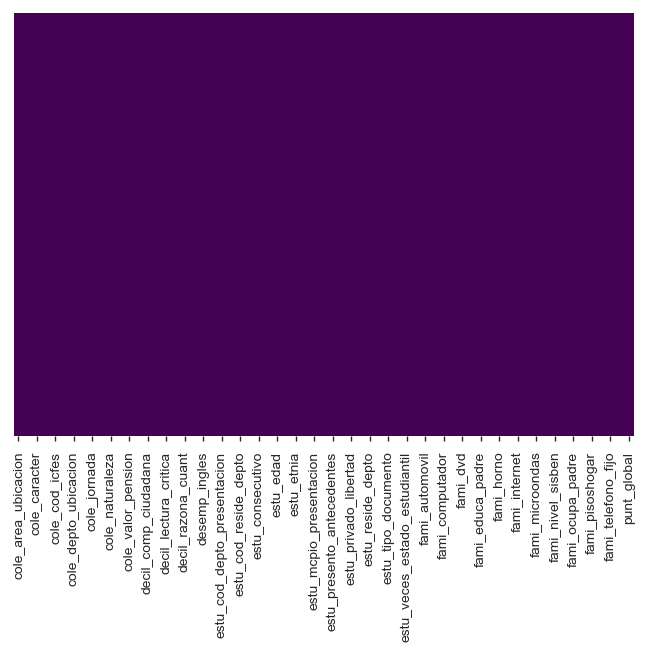

In [131]:
sns.heatmap(df_saber_11.isnull(), yticklabels=False, cbar=False, cmap='viridis');

In [197]:
# Cópia de segurança, caso tenhamos algum erro ao longo das execuções e não ter que baixar tudo de novo

df_saber_11_copy = df_saber_11.copy(deep=False)

### Tratando as colunas para a regressão

In [198]:
cole_cod_mcpio_ubicacion = df_saber_11_copy['cole_cod_mcpio_ubicacion']
cole_depto_ubicacion = df_saber_11_copy['cole_depto_ubicacion']
cole_mcpio_ubicacion = df_saber_11_copy['cole_mcpio_ubicacion']
estu_consecutivo = df_saber_11_copy['estu_consecutivo'] # ID do estudante
estu_depto_presentacion = df_saber_11_copy['estu_depto_presentacion']
estu_mcpio_presentacion = df_saber_11_copy['estu_mcpio_presentacion']
estu_reside_depto = df_saber_11_copy['estu_reside_depto']
estu_reside_mcpio = df_saber_11_copy['estu_reside_mcpio']

# Dropando algumas colunas

df_saber_11_copy.drop(['cole_cod_dane_institucion', 'cole_cod_icfes', 'cole_cod_mcpio_ubicacion',
                   'cole_mcpio_ubicacion', 'cole_depto_ubicacion', 'cole_jornada', 'cole_naturaleza', 
                   'cole_nombre_sede', 'estu_cod_depto_presentacion', 'estu_cod_mcpio_presentacion', 
                   'estu_cod_reside_depto', 'estu_cod_reside_mcpio', 'estu_consecutivo', 
                   'estu_depto_presentacion', 'estu_mcpio_presentacion', 'estu_pais_reside', 'estu_puesto', 
                   'estu_reside_depto', 'estu_reside_mcpio', 'estu_tipo_documento', 'periodo',
                   'decil_c_naturales', 'decil_comp_ciudadana', 'decil_ingles', 'decil_lectura_critica',
                   'decil_matematicas', 'decil_razona_cuant', 'decil_sociales_ciudadanas', 'desemp_ingles'
                  ], axis=1, inplace=True)

df_saber_11_copy['estu_edad'] = df_saber_11_copy['estu_edad'].astype(int)
df_saber_11_copy['punt_global'] = df_saber_11_copy['punt_global'].astype(float)

df_saber_11_copy.columns = df_saber_11_copy.columns.str.upper()

In [199]:
df_saber_11_copy.replace({'COLE_AREA_UBICACION': {'U': 1, 'R': 2}}, inplace=True)
df_saber_11_copy.replace({'COLE_CALENDARIO': {'A': 1, 'B': 2, 'O': 3}}, inplace=True)
df_saber_11_copy.replace({'COLE_CARACTER': {'NO_APLICA': 0, 'TECNICO/ACADEMICO': 1, 
                                        'TECNICO': 3, 'ACADEMICO': 4}}, inplace=True)
df_saber_11_copy.replace({'COLE_GENERO': {'FEMENINO': 1, 'MASCULINO': 2, 'MIXTO': 3}}, inplace=True)

df_saber_11_copy.replace({'DESEMP_INGLES': {'B1': 1, 'B+': 2, 'A-': 3, 'A2': 4, 'A1': 5}}, inplace=True)
df_saber_11_copy.replace({'ESTU_AREA_RESIDE': {'U': 1, 'R': 2}}, inplace=True)
df_saber_11_copy.replace({'ESTU_ESTUDIANTE': {'ESTUDIANTE': 1, 'INDIVIDUAL': 2}}, inplace=True)
df_saber_11_copy.replace({'ESTU_GENERO': {'F': 1, 'M': 2}}, inplace=True)

df_saber_11_copy.replace({'ESTU_PRESENTO_ANTECEDENTES': {'NO': 1, 'SI': 2}}, inplace=True)
df_saber_11_copy.replace({'ESTU_PRESENTO_EXPECTATIVAS': {'NO': 1, 'SI': 2}}, inplace=True)

for coluna in ['ESTU_PRIVADO_LIBERTAD', 'FAMI_AUTOMOVIL', 'FAMI_CELULAR', 'FAMI_COMPUTADOR', 'FAMI_DVD',
               'FAMI_HORNO', 'FAMI_INTERNET', 'FAMI_LAVADORA', 'FAMI_MICROONDAS', 'FAMI_NEVERA',
               'FAMI_SERVICIO_TELEVISION', 'FAMI_TELEFONO_FIJO']:
    df_saber_11_copy.replace({coluna: {'N': 1, 'S': 2}}, inplace=True)

df_saber_11_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 38 columns):
COLE_AREA_UBICACION              100000 non-null int64
COLE_CALENDARIO                  100000 non-null int64
COLE_CARACTER                    100000 non-null int64
COLE_GENERO                      100000 non-null int64
COLE_VALOR_PENSION               100000 non-null object
ESTU_AREA_RESIDE                 100000 non-null int64
ESTU_EDAD                        100000 non-null int64
ESTU_ESTUDIANTE                  100000 non-null int64
ESTU_ETNIA                       100000 non-null object
ESTU_GENERO                      100000 non-null int64
ESTU_PRESENTO_ANTECEDENTES       100000 non-null int64
ESTU_PRESENTO_EXPECTATIVAS       100000 non-null int64
ESTU_PRIVADO_LIBERTAD            100000 non-null int64
ESTU_TRABAJA                     100000 non-null object
ESTU_VECES_ESTADO_ESTUDIANTIL    100000 non-null object
ESTU_ZONA_RESIDE                 100000 non-null object
FAMI_

### Verificando com o Pandas Profiling se existem features muito correlacionadas entre si

In [200]:
profile = pandas_profiling.ProfileReport(df_saber_11_copy)
rejeitadas = profile.get_rejected_variables(threshold=0.9)
rejeitadas

[]

In [201]:
df_saber_11_copy.drop(rejeitadas, axis=1, inplace=True)

### Normalizando as colunas numéricas do dataframe da Colômbia

In [202]:
# Convertendo para categórica

colunas_categoricas = [col for col in df_saber_11_copy.columns if ('ESTU_EDAD' not in col) & \
                       ('PUNT_GLOBAL' not in col)]

for coluna in colunas_categoricas:
    df_saber_11_copy[coluna] = df_saber_11_copy[coluna].astype('category')
    
colunas_numericas = [col for col in df_saber_11_copy.select_dtypes(include=[np.number]).columns if 'PUNT_GLOBAL' != col]
df_saber_11_copy[colunas_numericas] = df_saber_11_copy[colunas_numericas].apply(normalMinMax)
    
df_saber_11_copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 38 columns):
COLE_AREA_UBICACION              100000 non-null category
COLE_CALENDARIO                  100000 non-null category
COLE_CARACTER                    100000 non-null category
COLE_GENERO                      100000 non-null category
COLE_VALOR_PENSION               100000 non-null category
ESTU_AREA_RESIDE                 100000 non-null category
ESTU_EDAD                        100000 non-null float64
ESTU_ESTUDIANTE                  100000 non-null category
ESTU_ETNIA                       100000 non-null category
ESTU_GENERO                      100000 non-null category
ESTU_PRESENTO_ANTECEDENTES       100000 non-null category
ESTU_PRESENTO_EXPECTATIVAS       100000 non-null category
ESTU_PRIVADO_LIBERTAD            100000 non-null category
ESTU_TRABAJA                     100000 non-null category
ESTU_VECES_ESTADO_ESTUDIANTIL    100000 non-null category
ESTU_ZONA_RESIDE     

### Regressão Multipla (dados da Colômbia)

In [203]:
function = \
'''

PUNT_GLOBAL ~
+COLE_AREA_UBICACION              
+COLE_CALENDARIO                  
+COLE_CARACTER                    
+COLE_GENERO                      
+COLE_VALOR_PENSION  
+ESTU_AREA_RESIDE                 
+np.log1p(ESTU_EDAD)                        
+ESTU_ESTUDIANTE                  
+ESTU_ETNIA                       
+ESTU_GENERO                      
+ESTU_PRESENTO_ANTECEDENTES       
+ESTU_PRESENTO_EXPECTATIVAS       
+ESTU_PRIVADO_LIBERTAD            
+ESTU_TRABAJA                     
+ESTU_VECES_ESTADO_ESTUDIANTIL    
+ESTU_ZONA_RESIDE                 
+FAMI_AUTOMOVIL                   
+FAMI_CELULAR                     
+FAMI_COMPUTADOR                  
+FAMI_CUARTOS_HOGAR               
+FAMI_DVD                         
+FAMI_EDUCA_MADRE                 
+FAMI_EDUCA_PADRE                 
+FAMI_ESTRATO_VIVIENDA            
+FAMI_HORNO                       
+FAMI_INGRESO_FMILIAR_MENSUAL     
+FAMI_INTERNET                    
+FAMI_LAVADORA                    
+FAMI_MICROONDAS                  
+FAMI_NEVERA                      
+FAMI_NIVEL_SISBEN                
+FAMI_OCUPA_MADRE                 
+FAMI_OCUPA_PADRE                 
+FAMI_PERSONAS_HOGAR              
+FAMI_PISOSHOGAR                  
+FAMI_SERVICIO_TELEVISION         
+FAMI_TELEFONO_FIJO               

'''

model = smf.ols(function, df_saber_11_copy).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:            PUNT_GLOBAL   R-squared:                       0.330
Model:                            OLS   Adj. R-squared:                  0.329
Method:                 Least Squares   F-statistic:                     346.4
Date:                Sun, 25 Nov 2018   Prob (F-statistic):               0.00
Time:                        20:37:09   Log-Likelihood:            -4.9806e+05
No. Observations:              100000   AIC:                         9.964e+05
Df Residuals:                   99857   BIC:                         9.978e+05
Df Model:                         142                                         
Covariance Type:            nonrobust                                         
                                         coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------------
Inte

In [204]:
colunas_categoricas = df_saber_11_copy.select_dtypes(include=['category']).columns
df_saber_11_copy = pd.get_dummies(df_saber_11_copy, columns=colunas_categoricas, drop_first=True)
df_saber_11_copy.head(10)

,ESTU_EDAD,PUNT_GLOBAL,COLE_AREA_UBICACION_2,COLE_CALENDARIO_2,COLE_CALENDARIO_3,COLE_CARACTER_1,COLE_CARACTER_3,COLE_CARACTER_4,COLE_GENERO_2,COLE_GENERO_3,COLE_VALOR_PENSION_2,COLE_VALOR_PENSION_3,COLE_VALOR_PENSION_4,COLE_VALOR_PENSION_5,COLE_VALOR_PENSION_6,ESTU_AREA_RESIDE_2,ESTU_ESTUDIANTE_2,ESTU_ETNIA_10,ESTU_ETNIA_100,ESTU_ETNIA_12,ESTU_ETNIA_13,ESTU_ETNIA_14,ESTU_ETNIA_16,ESTU_ETNIA_17,ESTU_ETNIA_18,ESTU_ETNIA_19,ESTU_ETNIA_2,ESTU_ETNIA_3,ESTU_ETNIA_4,ESTU_ETNIA_5,ESTU_ETNIA_6,ESTU_ETNIA_7,ESTU_ETNIA_8,ESTU_ETNIA_9,ESTU_GENERO_2,ESTU_PRESENTO_ANTECEDENTES_2,ESTU_PRESENTO_EXPECTATIVAS_2,ESTU_PRIVADO_LIBERTAD_2,ESTU_TRABAJA_2,ESTU_TRABAJA_3,ESTU_VECES_ESTADO_ESTUDIANTIL_2,ESTU_VECES_ESTADO_ESTUDIANTIL_3,ESTU_VECES_ESTADO_ESTUDIANTIL_4,ESTU_ZONA_RESIDE_10,ESTU_ZONA_RESIDE_2,ESTU_ZONA_RESIDE_3,ESTU_ZONA_RESIDE_4,ESTU_ZONA_RESIDE_5,ESTU_ZONA_RESIDE_6,ESTU_ZONA_RESIDE_7,ESTU_ZONA_RESIDE_8,ESTU_ZONA_RESIDE_9,FAMI_AUTOMOVIL_2,FAMI_CELULAR_2,FAMI_COMPUTADOR_2,FAMI_CUARTOS_HOGAR_10,FAMI_CUARTOS_HOGAR_2,FAMI_CUARTOS_HOGAR_3,FAMI_CUARTOS_HOGAR_4,FAMI_CUARTOS_HOGAR_5,FAMI_CUARTOS_HOGAR_6,FAMI_CUARTOS_HOGAR_7,FAMI_CUARTOS_HOGAR_8,FAMI_CUARTOS_HOGAR_9,FAMI_DVD_2,FAMI_EDUCA_MADRE_10,FAMI_EDUCA_MADRE_11,FAMI_EDUCA_MADRE_2,FAMI_EDUCA_MADRE_3,FAMI_EDUCA_MADRE_4,FAMI_EDUCA_MADRE_5,FAMI_EDUCA_MADRE_6,FAMI_EDUCA_MADRE_7,FAMI_EDUCA_MADRE_8,FAMI_EDUCA_MADRE_9,FAMI_EDUCA_PADRE_10,FAMI_EDUCA_PADRE_11,FAMI_EDUCA_PADRE_2,FAMI_EDUCA_PADRE_3,FAMI_EDUCA_PADRE_4,FAMI_EDUCA_PADRE_5,FAMI_EDUCA_PADRE_6,FAMI_EDUCA_PADRE_7,FAMI_EDUCA_PADRE_8,FAMI_EDUCA_PADRE_9,FAMI_ESTRATO_VIVIENDA_2,FAMI_ESTRATO_VIVIENDA_3,FAMI_ESTRATO_VIVIENDA_4,FAMI_ESTRATO_VIVIENDA_5,FAMI_ESTRATO_VIVIENDA_6,FAMI_HORNO_2,FAMI_INGRESO_FMILIAR_MENSUAL_2,FAMI_INGRESO_FMILIAR_MENSUAL_3,FAMI_INGRESO_FMILIAR_MENSUAL_4,FAMI_INGRESO_FMILIAR_MENSUAL_5,FAMI_INGRESO_FMILIAR_MENSUAL_6,FAMI_INGRESO_FMILIAR_MENSUAL_7,FAMI_INTERNET_2,FAMI_LAVADORA_2,FAMI_MICROONDAS_2,FAMI_NEVERA_2,FAMI_NIVEL_SISBEN_2,FAMI_NIVEL_SISBEN_3,FAMI_NIVEL_SISBEN_4,FAMI_NIVEL_SISBEN_5,FAMI_OCUPA_MADRE_10,FAMI_OCUPA_MADRE_11,FAMI_OCUPA_MADRE_12,FAMI_OCUPA_MADRE_2,FAMI_OCUPA_MADRE_3,FAMI_OCUPA_MADRE_4,FAMI_OCUPA_MADRE_5,FAMI_OCUPA_MADRE_6,FAMI_OCUPA_MADRE_7,FAMI_OCUPA_MADRE_8,FAMI_OCUPA_MADRE_9,FAMI_OCUPA_PADRE_10,FAMI_OCUPA_PADRE_11,FAMI_OCUPA_PADRE_12,FAMI_OCUPA_PADRE_2,FAMI_OCUPA_PADRE_3,FAMI_OCUPA_PADRE_4,FAMI_OCUPA_PADRE_5,FAMI_OCUPA_PADRE_6,FAMI_OCUPA_PADRE_7,FAMI_OCUPA_PADRE_8,FAMI_OCUPA_PADRE_9,FAMI_PERSONAS_HOGAR_10,FAMI_PERSONAS_HOGAR_11,FAMI_PERSONAS_HOGAR_12,FAMI_PERSONAS_HOGAR_2,FAMI_PERSONAS_HOGAR_3,FAMI_PERSONAS_HOGAR_4,FAMI_PERSONAS_HOGAR_5,FAMI_PERSONAS_HOGAR_6,FAMI_PERSONAS_HOGAR_7,FAMI_PERSONAS_HOGAR_8,FAMI_PERSONAS_HOGAR_9,FAMI_PISOSHOGAR_2,FAMI_PISOSHOGAR_3,FAMI_PISOSHOGAR_4,FAMI_SERVICIO_TELEVISION_2,FAMI_TELEFONO_FIJO_2
0,0.171717,292.0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1
1,0.171717,237.0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0
2,0.171717,279.0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0
3,0.232323,214.0,0,0,0,0,0,1,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0
4,0.181818,

In [205]:
y = df_saber_11_copy['PUNT_GLOBAL']
X = df_saber_11_copy.drop(['PUNT_GLOBAL'], axis=1)

In [206]:
print('Shape do X:', X.shape)
print('Shape do y:', y.shape)

Shape do X: (100000, 142)
Shape do y: (100000,)


In [207]:
# Validação do modelo usando Kfold e dividindo o dataframe em n_folds partes

seed = 20
n_folds = 3
kfold = KFold(n_folds, shuffle=True, random_state=seed).get_n_splits(X)

In [143]:
parameters = {'n_estimators': 200, 'max_depth': 3}

gbr_co = GradientBoostingRegressor(**parameters)

In [144]:
# Comparando os valores do R2 de cada um dos algoritmos

get_results([gbr_co], ['Gradient Boosting'], kfold, X, y)

,Médias,STDs,Algoritmo
0,0.348605,0.00124,Gradient Boosting


In [167]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=seed)

In [168]:
gbr_co.fit(X_train, y_train)

GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
             learning_rate=0.1, loss='ls', max_depth=3, max_features=None,
             max_leaf_nodes=None, min_impurity_decrease=0.0,
             min_impurity_split=None, min_samples_leaf=1,
             min_samples_split=2, min_weight_fraction_leaf=0.0,
             n_estimators=200, n_iter_no_change=None, presort='auto',
             random_state=None, subsample=1.0, tol=0.0001,
             validation_fraction=0.1, verbose=0, warm_start=False)

In [169]:
yhat = gbr_co.predict(X_test)
r2 = r2_score(y_test, yhat)
mse = mean_squared_error(y_test, yhat)

print(f'R2: {round(r2, 4)}, MSE: {round(mse, 4)}')

R2: 0.3484, MSE: 1213.345


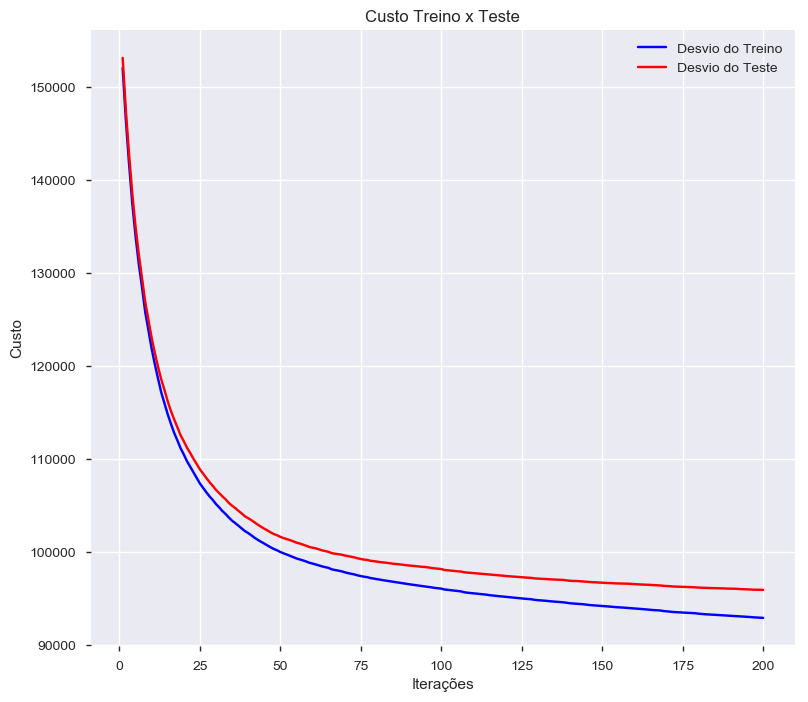

In [148]:
test_score = np.zeros((parameters['n_estimators'],), dtype=np.float64)

for i, y_pred in enumerate(gbr_co.staged_predict(X_test)):
    test_score[i] = gbr_co.loss_(y_test, y_pred)

plt.figure(figsize=(20, 8))
plt.subplot(1, 2, 1)
plt.title('Custo Treino x Teste')
plt.plot(np.arange(parameters['n_estimators']) + 1, gbr_co.train_score_, 'b-',
         label='Desvio do Treino')
plt.plot(np.arange(parameters['n_estimators']) + 1, test_score, 'r-',
         label='Desvio do Teste')
plt.legend(loc='upper right')
plt.xlabel('Iterações')
plt.ylabel('Custo');

In [187]:
feature_importance = gbr_co.feature_importances_

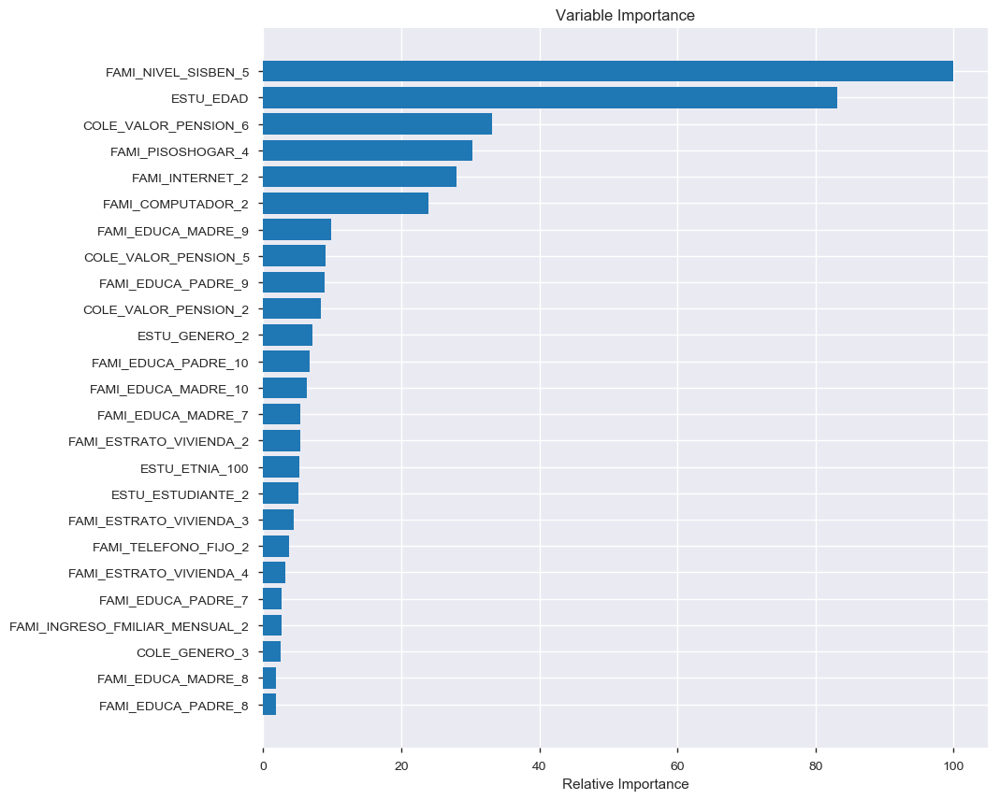

In [188]:
limite = 25

feature_importance = 100.0 * (feature_importance / feature_importance.max())
sorted_idx = np.argsort(feature_importance)[-limite:]

pos = np.arange(sorted_idx.shape[0]) + .5

plt.figure(figsize=(10, 10))
plt.barh(pos, feature_importance[sorted_idx], align='center')
plt.yticks(pos, X.columns[sorted_idx])
plt.xlabel('Relative Importance')
plt.title('Variable Importance')
plt.show()

### Por Shapley

In [189]:
shap_values = shap.TreeExplainer(gbr_co).shap_values(X_test)

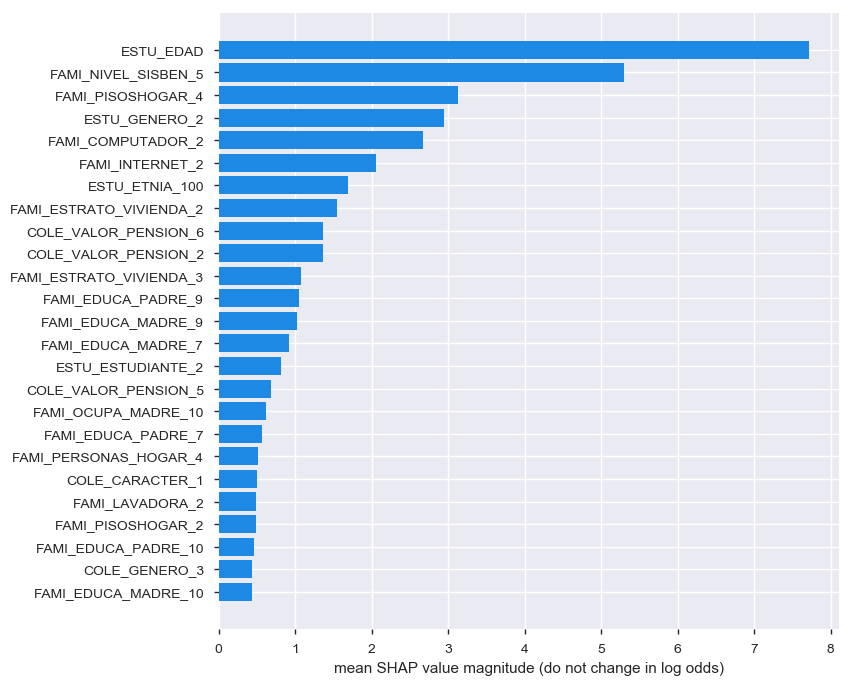

In [190]:
global_shap_vals = np.abs(shap_values).mean(0)[:-1]
variables_values = pd.DataFrame(list(zip(X_test.columns, global_shap_vals)))
variables_values.rename(columns={0:'variable', 1:'shap_value'}, inplace=True)
variables_values.sort_values(by=['shap_value'], ascending=False, inplace=True)
top_n = variables_values.head(limite)

pos = range(0,-top_n.shape[0],-1)
plt.barh(pos, top_n['shap_value'], color="#1E88E5")
plt.yticks(pos, top_n['variable'])
plt.xlabel("mean SHAP value magnitude (do not change in log odds)")
plt.gcf().set_size_inches(8, 8)
plt.gca()
plt.show()

In [191]:
top_n['variable'].values

array(['ESTU_EDAD', 'FAMI_NIVEL_SISBEN_5', 'FAMI_PISOSHOGAR_4',
       'ESTU_GENERO_2', 'FAMI_COMPUTADOR_2', 'FAMI_INTERNET_2',
       'ESTU_ETNIA_100', 'FAMI_ESTRATO_VIVIENDA_2',
       'COLE_VALOR_PENSION_6', 'COLE_VALOR_PENSION_2',
       'FAMI_ESTRATO_VIVIENDA_3', 'FAMI_EDUCA_PADRE_9',
       'FAMI_EDUCA_MADRE_9', 'FAMI_EDUCA_MADRE_7', 'ESTU_ESTUDIANTE_2',
       'COLE_VALOR_PENSION_5', 'FAMI_OCUPA_MADRE_10',
       'FAMI_EDUCA_PADRE_7', 'FAMI_PERSONAS_HOGAR_4', 'COLE_CARACTER_1',
       'FAMI_LAVADORA_2', 'FAMI_PISOSHOGAR_2', 'FAMI_EDUCA_PADRE_10',
       'COLE_GENERO_3', 'FAMI_EDUCA_MADRE_10'], dtype=object)

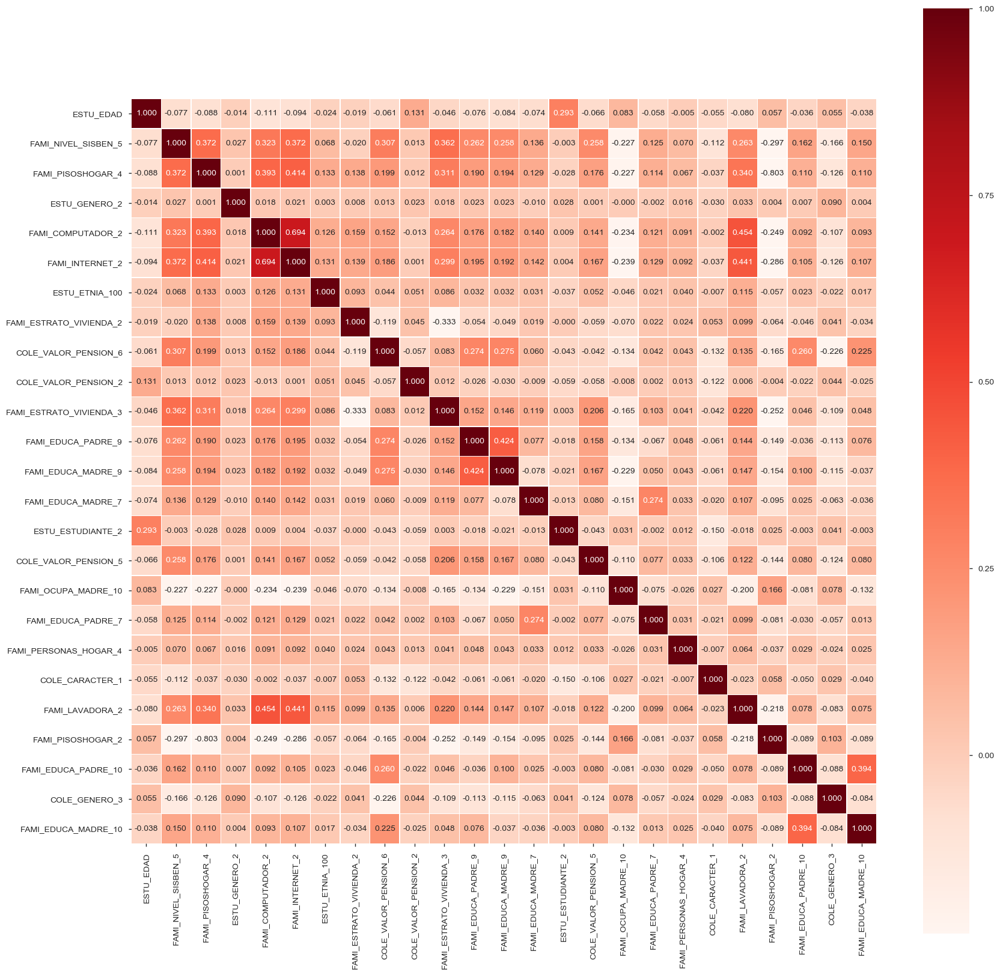

In [208]:
shapley_corr = top_n['variable'].values

f,ax = plt.subplots(figsize=(20, 20))
sns.heatmap(df_saber_11_copy[shapley_corr].corr(), 
            annot=True, 
            linewidths=.4, 
            fmt='.3f', 
            robust=True,
            ax=ax, 
            cmap='Reds',
            square=True);

In [210]:
columns = top_n['variable'].values
corr_list = []
cols_list = []

for col in columns:
    corr = df_saber_11_copy['PUNT_GLOBAL'].corr(df_saber_11_copy[col])
    corr_list.append(corr)
    cols_list.append(col)

df_corr = pd.DataFrame(columns=['VARIAVEL','CORRELACAO'])

df_corr['VARIAVEL'] = cols_list
df_corr['CORRELACAO'] = corr_list

df_corr = df_corr.sort_values(by='CORRELACAO', ascending=True)
df_corr.reset_index(drop=True, inplace=True)
df_corr

,VARIAVEL,CORRELACAO
0,ESTU_EDAD,-0.222920
1,FAMI_PISOSHOGAR_2,-0.213406
2,FAMI_OCUPA_MADRE_10,-0.199557
3,COLE_GENERO_3,-0.162481
4,COLE_VALOR_PENSION_2,-0.114822
5,COLE_CARACTER_1,-0.026282
6,ESTU_ESTUDIANTE_2,-0.012465
7,FAMI_ESTRATO_VIVIENDA_2,0.051703
8,ESTU_GENERO_2,0.074387
9,FAMI_PERSONAS_HOGAR_4,0.079543


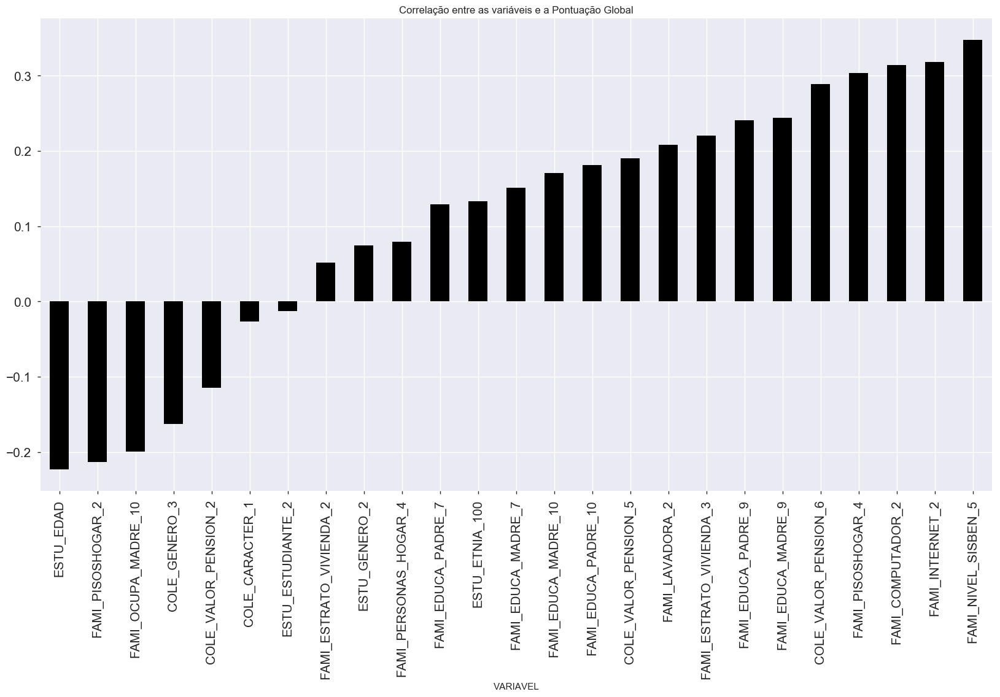

In [211]:
df_corr.plot.bar(x='VARIAVEL', 
                 y='CORRELACAO',figsize=(20, 10), 
                 legend=False,
                 title='Correlação entre as variáveis e a Pontuação Global', grid=True,
                 fontsize=15, cmap='binary_r');

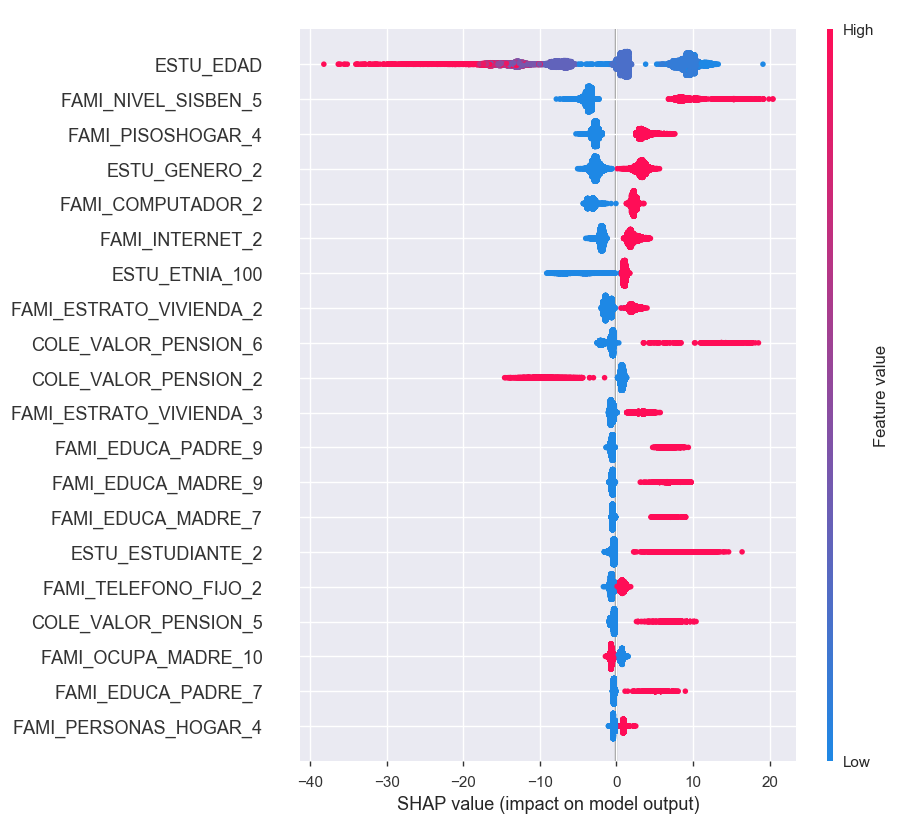

In [212]:
shap.summary_plot(shap_values, X_test)

In [213]:
row_to_show = 251
data_for_prediction = X_test.iloc[row_to_show]  # use 1 row of data here. Could use multiple rows if desired
data_for_prediction_array = data_for_prediction.values.reshape(1, -1)

# Criando o objeto que pode calcular os Shap values

explainer = shap.TreeExplainer(gbr_co)

# Calculando Shap values

shap_values = explainer.shap_values(data_for_prediction)

In [214]:
# Interpretação: Valores em vermelho aumentam o rating médio e os valores azuis diminuem.

shap.initjs()
shap.force_plot(explainer.expected_value, shap_values, data_for_prediction)

In [215]:
# Visualizando as previsões dos dados de validação

shap_values = shap.TreeExplainer(gbr_co).shap_values(X_test.head(100))
shap.force_plot(explainer.expected_value, shap_values, X_test.head(100))